# Rejecting full GP SFH reconstructions, focusing on histogram-like fits instead
Messing around with converting GP reconstructions into histogram fits, and inventing a metric to guage best binning scheme and number of bins to move forward

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import sys
sys.path.append('/home/hin/Documents/St_Andrews/dense_basis')
import dense_basis as db

from george import kernels
import george
from astropy.cosmology import FlatLambdaCDM
cosmo = FlatLambdaCDM(H0=70., Om0=0.3)

from scipy.optimize import minimize

Starting dense_basis. Failed to load FSPS, only GP-SFH module will be available.
running without emcee


### First define the functions related to GP fitting

In [3]:
def nll(p, gp, y):
    gp.set_parameter_vector(p)
    return -gp.log_likelihood(y)

def grad_nll(p, gp, y):
    gp.set_parameter_vector(p)
    return -gp.grad_log_likelihood(y)

def gp_interpolator(x,y,res = 1000, Nparam = 3, decouple_sfr = False, var=False, sample=False):

    yerr = np.zeros_like(y)
    yerr[2:(2+Nparam)] = 0.001/np.sqrt(Nparam)
    if len(yerr) > 26:
        yerr[2:(2+Nparam)] = 0.1/np.sqrt(Nparam)
    yerr[(2+Nparam):] = 0.1
    #kernel = np.var(y) * kernels.ExpSquaredKernel(np.median(y))
    #kernel = np.var(y) * kernels.LinearKernel(np.median(y),order=1)
    #kernel = np.var(y) * kernels.Matern32Kernel(np.median(y)) #+ k2
    kernel = np.var(y) * (kernels.Matern32Kernel(np.median(y)) + kernels.LinearKernel(np.median(y), order=2))
    gp = george.GP(kernel, solver=george.HODLRSolver)

    #print(xax.shape, yerr.shape)
    #gp.compute(x.ravel(), yerr.ravel())
    # the choices of yerr in dense_basis seems arbituary, switching them off for now
    gp.compute(x.ravel())
    
    # optimize kernel parameters
    #p0 = gp.get_parameter_vector()
    #results = minimize(nll, p0, jac=grad_nll, method="L-BFGS-B", args = (gp, y))
    #print(results)
    #gp.set_parameter_vector(results.x)

    x_pred = np.linspace(np.amin(x), np.amax(x), res)
    y_pred, pred_var = gp.predict(y.ravel(), x_pred, return_var=True)
    
    if var==True:
        if sample==True:
            samples = gp.sample_conditional(y.ravel(), x_pred, size=30)
            return x_pred, y_pred, pred_var, samples
        else:
            return x_pred, y_pred, pred_var
    else:
        return x_pred, y_pred

def treat_sfh(time_arr_interp, mass_arr_interp, sfh_tuple, zval, 
              decouple_sfr, decouple_sfr_time, sfr_tolerance, pred_var=None):
    sfh = (np.diff(mass_arr_interp)*10**(sfh_tuple[0])) / (np.diff(time_arr_interp)*cosmo.age(zval).value*1e9)
    #sfh_scale = 10**(sfh_tuple[0])/(cosmo.age(zval).value*1e9/1000)
    #sfh = np.diff(mass_arr_interp)*sfh_scale
    sfh[sfh<0] = 0
    sfh = np.insert(sfh,0,[0])
    if pred_var is not None:
        sfh_var = (pred_var[1:]+pred_var[:-1]) * (10**(sfh_tuple[0])/(np.diff(time_arr_interp)*cosmo.age(zval).value*1e9))**2
        sfh_var = np.insert(sfh_var,0,[0])
    
    sfr_decouple_time_index = np.argmin(np.abs(time_arr_interp*cosmo.age(zval).value - decouple_sfr_time/1e3))
    if sfr_decouple_time_index == 0:
        sfr_decouple_time_index = 2
    mass_lastbins = np.trapz(x=time_arr_interp[-sfr_decouple_time_index:]*1e9*(cosmo.age(zval).value), y=sfh[-sfr_decouple_time_index:])
    mass_remaining = 10**(sfh_tuple[0]) - mass_lastbins
    if mass_remaining < 0:
        mass_remaining = 0
        print('input SFR, M* combination is not physically consistent (log M*: %.2f, log SFR: %.2f.)' %(sfh_tuple[0],sfh_tuple[1]))
    mass_initbins = np.trapz(x=time_arr_interp[0:(1000-sfr_decouple_time_index)]*1e9*(cosmo.age(zval).value), y=sfh[0:(1000-sfr_decouple_time_index)])
    sfh[0:(1000-sfr_decouple_time_index)] = sfh[0:(1000-sfr_decouple_time_index)] * mass_remaining / mass_initbins
    
    if (np.abs(np.log10(sfh[-1]) - sfh_tuple[1]) > sfr_tolerance) or (decouple_sfr == True):
        sfh[-sfr_decouple_time_index:] = 10**sfh_tuple[1]
    
#     if decouple_sfr == True:
#         sfr_decouple_time_index = np.argmin(np.abs(time_arr_interp*cosmo.age(zval).value - decouple_sfr_time/1e3))
#         sfh[-sfr_decouple_time_index:] = 10**sfh_tuple[1]
    if pred_var is not None:
        return sfh, sfh_var
    else: return sfh
    
#iyer binning's GP fit function
def tuple_to_sfh(sfh_tuple, zval, interpolator = 'gp_george', decouple_sfr = False, decouple_sfr_time = 10, sfr_tolerance = 0.05, vb = False,cosmo = cosmo):
    # generate an SFH from an input tuple (Mass, SFR, {tx}) at a specified redshift


    Nparam = int(sfh_tuple[2])
    mass_quantiles = np.linspace(0,1,Nparam+2)
    time_quantiles = np.zeros_like(mass_quantiles)
    time_quantiles[-1] = 1
    time_quantiles[1:-1] = sfh_tuple[3:]
    
    if vb == True:
        print('pre-adjustment:',time_quantiles, mass_quantiles)

    # now add SFR constraints

    # SFR smoothly increasing from 0 at the big bang
    mass_quantiles = np.insert(mass_quantiles,1,[0.00])
    time_quantiles = np.insert(time_quantiles,1,[0.01])

    # SFR constrained to SFR_inst at the time of observation
    #SFH_constraint_percentiles = np.array([0.96,0.97,0.98,0.99])
    SFH_constraint_percentiles = np.array([0.97, 0.98, 0.99])
    for const_vals in SFH_constraint_percentiles:

        delta_mstar = 10**(sfh_tuple[0]) *(1-const_vals)
        delta_t = 1 - delta_mstar/(10**sfh_tuple[1])/(cosmo.age(zval).value*1e9)
        if vb == True:
            print(delta_t,time_quantiles[-2])

        if (delta_t > time_quantiles[-2]) & (delta_t > 0.9):
            if vb == True:
                print('if', const_vals)
            mass_quantiles = np.insert(mass_quantiles, -1, [const_vals], )
            time_quantiles = np.insert(time_quantiles, -1, [delta_t],)
        else:
            if vb == True:
                print('else', const_vals)
            if const_vals > time_quantiles[-2]:
                delta_m = 1 - ((cosmo.age(zval).value*1e9)*(1-const_vals)*(10**sfh_tuple[1]))/(10**sfh_tuple[0])
                time_quantiles = np.insert(time_quantiles, -1, [const_vals])
                mass_quantiles=  np.insert(mass_quantiles, -1, [delta_m])
    
    if vb == True:
        print('post-adjustment:',time_quantiles, mass_quantiles)
    
    if interpolator == 'gp_george':
        time_arr_interp, mass_arr_interp, pred_var, mass_arr_interp_samples = gp_interpolator(
            time_quantiles, mass_quantiles, Nparam = int(Nparam), decouple_sfr = decouple_sfr, 
            var=True, sample=True)
    elif interpolator == 'gp_sklearn':
        time_arr_interp, mass_arr_interp = gp_sklearn_interpolator(time_quantiles, mass_quantiles)
    elif interpolator == 'linear':
        time_arr_interp, mass_arr_interp = linear_interpolator(time_quantiles, mass_quantiles)
    elif interpolator == 'pchip':
        time_arr_interp, mass_arr_interp = Pchip_interpolator(time_quantiles, mass_quantiles)
    else:
        raise Exception('specified interpolator does not exist: {}. \n use one of the following: gp_george, gp_sklearn, linear, and pchip '.format(interpolator))
    
    sfh, sfh_var = treat_sfh(time_arr_interp, mass_arr_interp, sfh_tuple, zval, 
                             decouple_sfr, decouple_sfr_time, sfr_tolerance, pred_var=pred_var)
    
    samp = []
    for i,sample in enumerate(mass_arr_interp_samples):
        sfh_i = treat_sfh(time_arr_interp, sample, sfh_tuple, zval, 
                             decouple_sfr, decouple_sfr_time, sfr_tolerance)
        samp.append([sfh_i, sample])

    timeax = time_arr_interp * cosmo.age(zval).value

    if vb == True:
        print('time and mass quantiles:')
        print(time_quantiles, mass_quantiles)
        plt.plot(time_quantiles, mass_quantiles,'--o')
        plt.plot(time_arr_interp, mass_arr_interp)
        plt.axis([0,1,0,1])
        #plt.axis([0.9,1.05,0.9,1.05])
        plt.show()

        print('instantaneous SFR: %.1f' %sfh[-1])
        plt.plot(np.amax(time_arr_interp) - time_arr_interp, sfh)
        #plt.xscale('log')
        plt.show()

    return sfh, timeax, mass_arr_interp, sfh_var, pred_var, samp

#log time binning's GP fit function
def fit_logtime(sfh_tuple, zval, interpolator = 'gp_george', decouple_sfr = False, 
                decouple_sfr_time = 10, sfr_tolerance = 0.05, vb = False,cosmo = cosmo):
    # sfh_tuple[0] = total mass formed in log10 form
    # sfh_tuple[1] = log10 SFR at time of observation
    # sfh_tuple[2] = list of time bin boundaries in fractions of the universe's current
    # sfh_tuple[3] = list of fraction mass formed at bin boundaries
    
    # generate an SFH from an input tuple at a specified redshift
    Nparam = int(sfh_tuple[2])
    input_tx = sfh_tuple[3:3+Nparam]
    input_mf = sfh_tuple[3+Nparam:3+2*Nparam]
    c_mass_formed = np.zeros(len(input_mf))
    for i,mi in enumerate(input_mf):
        c_mass_formed[i] = np.sum(input_mf[:i+1])
    mass_quantiles = np.array([0,*c_mass_formed,1])
    time_quantiles = np.zeros_like(mass_quantiles)
    time_quantiles[-1] = 1
    time_quantiles[1:-1] = input_tx
    
    if vb == True:
        print('pre-adjustment:',time_quantiles, mass_quantiles)
    
    # now add SFR constraints
    mass_quantiles = np.insert(mass_quantiles,1,[0.00])
    time_quantiles = np.insert(time_quantiles,1,[0.01])
    
    # SFR constrained to SFR_inst at the time of observation
    #SFH_constraint_percentiles = np.array([0.96,0.97,0.98,0.99])
    SFH_constraint_percentiles = np.array([0.97, 0.98, 0.99])
    for const_vals in SFH_constraint_percentiles:

        delta_mstar = 10**(sfh_tuple[0]) *(1-const_vals)
        delta_t = 1 - delta_mstar/(10**sfh_tuple[1])/(cosmo.age(zval).value*1e9)
        if vb == True:
            print(delta_t,time_quantiles[-2])

        if (delta_t > time_quantiles[-2]) & (delta_t > 0.9):
            if vb == True:
                print('if', const_vals)
            mass_quantiles = np.insert(mass_quantiles, -1, [const_vals], )
            time_quantiles = np.insert(time_quantiles, -1, [delta_t],)
        else:
            if vb == True:
                print('else', const_vals)
            if const_vals > time_quantiles[-2]:
                delta_m = 1 - ((cosmo.age(zval).value*1e9)*(1-const_vals)*(10**sfh_tuple[1]))/(10**sfh_tuple[0])
                time_quantiles = np.insert(time_quantiles, -1, [const_vals])
                mass_quantiles=  np.insert(mass_quantiles, -1, [delta_m])
    
    #debug stuff
    if vb == True:
        print('post-adjustment:',time_quantiles, mass_quantiles)
        plt.plot(model_ages, c_model_sfh)
        plt.plot(time_quantiles*age_at_z, mass_quantiles*np.trapz(y=model_sfh, x=model_ages))
        plt.show()
        
    #transform 0-1 in linear tme to 0-1 in log lookback time
    #a = 1
    #time_quantiles_ = 1-np.log(a*((1-time_quantiles)+1)-(a-1))/np.log(a+1)
    #print(time_quantiles)
    #print(time_quantiles_)
    #time_quantiles = time_quantiles_.copy()
    
    if interpolator == 'gp_george':
        time_arr_interp, mass_arr_interp, pred_var, mass_arr_interp_samples = gp_interpolator(
            time_quantiles, mass_quantiles, Nparam = int(Nparam), decouple_sfr = decouple_sfr, 
            var=True, sample=True)
    elif interpolator == 'gp_sklearn':
        time_arr_interp, mass_arr_interp = gp_sklearn_interpolator(time_quantiles, mass_quantiles)
    elif interpolator == 'linear':
        time_arr_interp, mass_arr_interp = linear_interpolator(time_quantiles, mass_quantiles)
    elif interpolator == 'pchip':
        time_arr_interp, mass_arr_interp = Pchip_interpolator(time_quantiles, mass_quantiles)
    else:
        raise Exception('specified interpolator does not exist: {}. \n use one of the following: gp_george, gp_sklearn, linear, and pchip '.format(interpolator))
        
    #time_arr_interp_ = 1-((np.exp((1-time_arr_interp)*np.log(a+1))+(a-1))/a-1)
    #print(time_arr_interp)
    #print(time_arr_interp_)
    #time_arr_interp = time_arr_interp_.copy()
    
    sfh, sfh_var = treat_sfh(time_arr_interp, mass_arr_interp, sfh_tuple, zval, 
                             decouple_sfr, decouple_sfr_time, sfr_tolerance, pred_var=pred_var)
    
    samp = []
    for i,sample in enumerate(mass_arr_interp_samples):
        sfh_i = treat_sfh(time_arr_interp, sample, sfh_tuple, zval, 
                             decouple_sfr, decouple_sfr_time, sfr_tolerance)
        samp.append([sfh_i, sample])

    timeax = time_arr_interp * cosmo.age(zval).value

    if vb == True:
        print('time and mass quantiles:')
        print(time_quantiles, mass_quantiles)
        plt.plot(time_quantiles, mass_quantiles,'--o')
        plt.plot(time_arr_interp, mass_arr_interp)
        plt.axis([0,1,0,1])
        #plt.axis([0.9,1.05,0.9,1.05])
        plt.show()

        print('instantaneous SFR: %.1f' %sfh[-1])
        plt.plot(np.amax(time_arr_interp) - time_arr_interp, sfh)
        #plt.xscale('log')
        plt.show()

    return sfh, timeax, mass_arr_interp, sfh_var, pred_var, samp

### Next, define the functions used for binning and running the fits

In [ ]:
def bin_iyer(Nbins, end_time=None):
    if end_time is not None:
        end_age = age_at_z-end_time*10**-9
        model_ages_ = model_ages[model_ages>=end_age].copy()
        model_sfh_ = model_sfh[model_ages>=end_age].copy()
    else:
        model_ages_ = model_ages.copy()
        model_sfh_ = model_sfh.copy()
    total_mass = np.trapz(y=model_sfh_, x=model_ages_)
    c_mass = []
    for i,sfh in enumerate(model_sfh_):
        c_mass.append(np.trapz(y=model_sfh_[:i+1], x=model_ages_[:i+1])/total_mass)
    mass_percentiles = np.arange(1,Nbins)*1/Nbins
    tx = np.interp(mass_percentiles, c_mass, model_ages_/age_at_z)
    return np.array(tx)

def cal_ave_sfr(age,sfh,tx,age_at_z,abs_err=False,isfit=False):
    sort_ind = np.argsort(age)
    age = age[sort_ind]
    sfh = sfh[sort_ind]
    tx_ = np.array([0, *tx, 1])*age_at_z
    ave_sfr = np.zeros(len(tx)+1)
    for i,txi in enumerate(tx_):
        if i>0:
            this_age = age[np.where((age>tx_[i-1]) & (age<txi))]
            this_age = [tx_[i-1], *this_age, txi]
            this_sfh = sfh[np.where((age>tx_[i-1]) & (age<txi))]
            this_sfh = [np.interp(tx_[i-1], age, sfh), *this_sfh, np.interp(txi, age, sfh)]
            ave_sfr[i-1] = np.trapz(y=this_sfh, x=this_age) / (this_age[-1]-this_age[0])
    if abs_err == False:
        return ave_sfr, tx_[:-1], tx_[1:]
    elif abs_err == True:
        if isfit==False:
            age_ = age.copy()
            sfh_ = sfh.copy()
        elif isfit==True:
            age_ = model_ages
            sfh_ = model_sfh
        ave_sfh = np.zeros(len(age_))
        for i,txi in enumerate(tx_):
            if i>0:
                ave_sfh[np.where((age_>tx_[i-1]) & (age_<txi))] = ave_sfr[i-1]
        abs_err_value = np.trapz(y=((sfh_-ave_sfh)**2),x=age_)
        return ave_sfr, tx_[:-1], tx_[1:], abs_err_value
    
def bin_logtime(Nbins, interp=True, begin_time=3*10**8, end_time=None):
    # begin_time and end_time are the two extremes at which the bin boundaries are linspaced between
    # Note that they are in lookback time instead of age
    if end_time == None:
        end_time = age_at_z*10**9
    logtime_per_bin = (np.log10(end_time)-np.log10(begin_time))/(Nbins-1)
    tx = age_at_z - 10**(np.arange(Nbins-1)*logtime_per_bin + np.log10(begin_time) - 9)
    tx = tx[::-1]
    
    mass_so_far = [0]
    for txi in tx:
        if interp==True:
            sfh_at_txi = np.interp(txi, model_ages, model_sfh)
            insert_index = model_ages.searchsorted(txi)
            model_ages_ = np.insert(model_ages,insert_index,txi)
            model_sfh_ = np.insert(model_sfh,insert_index,sfh_at_txi)
            int_mass = np.trapz(y=model_sfh_[model_ages_<=txi], x=model_ages_[model_ages_<=txi]*10**9)
        else:
            int_mass = np.trapz(y=model_sfh[model_ages<=txi], x=model_ages[model_ages<=txi]*10**9)
        mass_so_far.append(int_mass)
    #mass_so_far.append(np.trapz(y=model_sfh, x=model_ages*10**9))
    mass_so_far = np.array(mass_so_far)
    mass_formed = mass_so_far[1:]-mass_so_far[:-1]
    t_mass_formed = np.trapz(y=model_sfh, x=model_ages*10**9)
    return tx/age_at_z, mass_formed/t_mass_formed

def db_fit(Nbins, tx):
    iyer_param = np.hstack([np.log10(model_Mstar), np.log10(model_sfh[-1]), Nbins-1, tx])
    return tuple_to_sfh(iyer_param, 0.04, vb=False)

def lt_fit(Nbins, tx, mf):
    lt_param = np.hstack([np.log10(model_Mstar), np.log10(model_sfh[-1]), Nbins-1, tx, mf])
    return fit_logtime(lt_param, 0.04, vb=False)

### Now load in the true SFH

In [4]:
plt.rcParams.update({'font.size': 14})

sim_data = np.loadtxt('../Yirui_test_cube/snap119/2xSc_07_EC_BH_vw1e4_ReposNoRFBNoRP_snap119_SFH_at_diff_radius.txt')
age_at_z = cosmo.age(0.04).value
model_lb_time = sim_data[:,0]
model_ages = age_at_z - model_lb_time
mask = model_ages > 0
model_ages = model_ages[mask][::-1]
model_sfh = sim_data[:,2][mask][::-1]
model_lb_time = model_lb_time[mask][::-1]
model_Mstar = np.trapz(y=model_sfh, x=model_ages)*10**9

#cumulative mass formed vs age
Mstar_total_model = np.trapz(model_sfh, x=model_ages)
c_model_sfh = np.zeros(len(model_sfh))
for i,sfh in enumerate(model_sfh):
    c_model_sfh[i] = np.trapz(model_sfh[:i+1],x=model_ages[:i+1])/Mstar_total_model

# Section 1: Demo of the binning methods and process

### Demo of the fitting process using a 6 bin iyer fit

First cell shows the binning against the "true" SFH, and the next cell shows the GP fitting with information from those bins. <br>

Note: The "area error" is calculated with this <br>
$\begin{equation}
\sum_i^{Nbins} \int_{whole\;bin} (\rm{SFR}(age) - \bar{SFR}_i)^2 d(age)
\end{equation}$ <br> <br>
where $\bar{\rm{SFR}}_i$ is the calculated average SFR in bin i (can be from both the true SFH, in the case of calculating the binning error, or from the fitted SFH, in the case of calculating the fitting error). 

summed squared arror between averaged sfr and actual sfh = 459.377323023472


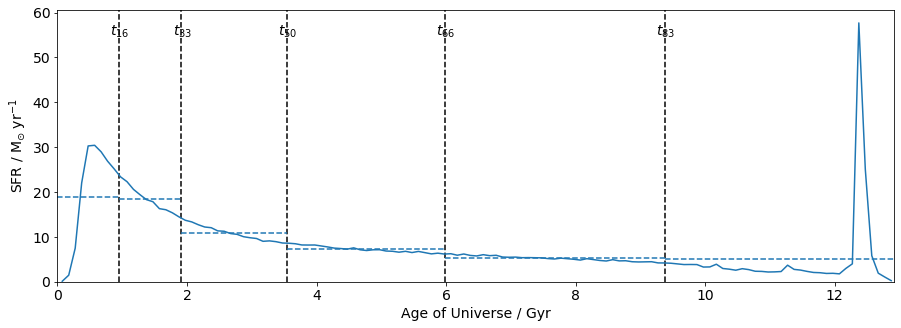

In [120]:
Nbins = 6
tx = bin_iyer(Nbins)

fig, ax = plt.subplots(figsize=[15,5])
p0 = ax.plot(model_ages, model_sfh)
ax.set_xlim([0,age_at_z])
ax.set_xlabel('Age of Universe / Gyr')
ax.set_ylabel(r'SFR / $\rm{M_{\odot}}\; \rm{yr}^{-1}$')
ylims = ax.get_ylim()
ax.vlines(tx*age_at_z, 0, ylims[1], color='k', ls='--')
for i,txi in enumerate(tx):
    ax.annotate('$t_{'+str(int((i+1)*100/Nbins))+'}$', [(txi-0.01)*age_at_z, 0.95*max(model_sfh)])
ave_sfr_ = cal_ave_sfr(model_ages, model_sfh, tx, age_at_z, abs_err=True)
ave_sfr = ave_sfr_[:-1]
print('summed squared arror between averaged sfr and actual sfh =', ave_sfr_[-1])
ax.hlines(*ave_sfr, color=p0[0].get_color(), ls='--', label='average SFR in bin')
ax.set_ylim([0,ylims[1]])
plt.show()

(fitted) summed squared arror between averaged sfr and actual sfh = 459.74644888854965


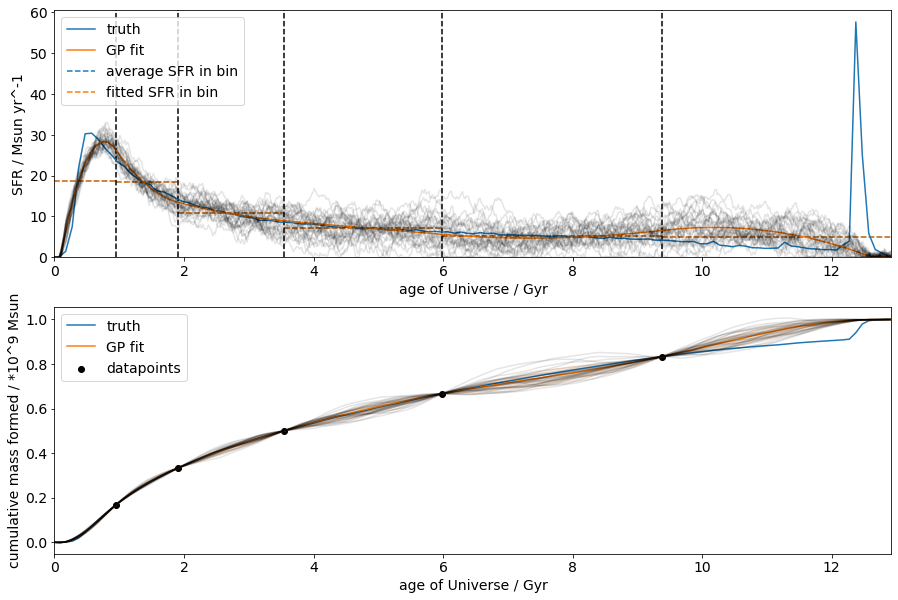

In [121]:
iyer_sfh, iyer_ages, iyer_c_mass, iyer_sfh_var, iyer_c_mass_var, iyer_samples = db_fit(Nbins, tx)
iyer_ave_sfr_ = cal_ave_sfr(iyer_ages, iyer_sfh, tx, age_at_z, abs_err=True, isfit=True)
iyer_ave_sfr = iyer_ave_sfr_[:-1]
print('(fitted) summed squared arror between averaged sfr and actual sfh =', iyer_ave_sfr_[-1])

fig, ax = plt.subplots(2, 1, figsize=[15,10])
p0 = ax[0].plot(model_ages, model_sfh, label='truth')
ylims = ax[0].get_ylim()
ax[0].vlines(tx*age_at_z, 0, ylims[1], color='k', ls='--')
ax[0].hlines(*ave_sfr, color=p0[0].get_color(), ls='--', label='average SFR in bin', zorder=1)
p1 = ax[0].plot(iyer_ages, iyer_sfh, label='GP fit')
ax[0].hlines(*iyer_ave_sfr, color=p1[0].get_color(), ls='--', label='fitted SFR in bin', zorder=1)
#ax[0].fill_between(iyer_ages, iyer_sfh-np.sqrt(iyer_sfh_var), iyer_sfh+np.sqrt(iyer_sfh_var), 
#                  color='sandybrown', alpha=0.2)
ax[0].set_xlim([0,age_at_z])
ax[0].set_ylim([0,ylims[1]])
ax[0].set_xlabel('age of Universe / Gyr')
ax[0].set_ylabel('SFR / Msun yr^-1')
ax[0].legend()

ax[1].plot(model_ages, c_model_sfh, label='truth')
ax[1].scatter(tx*age_at_z, np.linspace(0,1,Nbins+1)[1:-1], color='k', label='datapoints')
ax[1].plot(iyer_ages, iyer_c_mass, label='GP fit')
ax[1].fill_between(iyer_ages, iyer_c_mass-np.sqrt(iyer_c_mass_var), iyer_c_mass+np.sqrt(iyer_c_mass_var), 
                  color='sandybrown', alpha=0.2)
ax[1].set_xlim([0,age_at_z])
ax[1].set_xlabel('age of Universe / Gyr')
ax[1].set_ylabel('cumulative mass formed / *10^9 Msun')
for samp in iyer_samples:
    ax[0].plot(iyer_ages, samp[0], color='k', alpha=0.1)
    ax[1].plot(iyer_ages, samp[1], color='k', alpha=0.1)
ax[1].legend()
plt.show()

### Uniform bin width in log time, again 6 bins
Alternative binning scheme proposed by Vivienne: to definie bin boundaries as uniform width in log lookback time, and fit for the mass formed in each bin

summed squared arror between averaged sfr and actual sfh = 446.478080508885


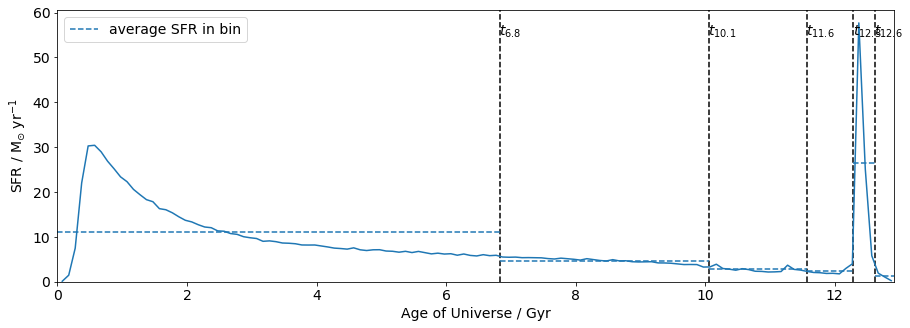

In [122]:
Nbins = 6
tx, f_mass_formed = bin_logtime(Nbins, interp=True, end_time=None)
ave_sfr_ = cal_ave_sfr(model_ages, model_sfh, tx, age_at_z, abs_err=True)
ave_sfr = ave_sfr_[:-1]
print('summed squared arror between averaged sfr and actual sfh =', ave_sfr_[-1])

fig, ax = plt.subplots(figsize=[15,5])
p0 = ax.plot(model_ages, model_sfh)
ax.set_xlim([0,age_at_z])
ax.set_xlabel('Age of Universe / Gyr')
ax.set_ylabel(r'SFR / $\rm{M_{\odot}}\; \rm{yr}^{-1}$')
ylims = ax.get_ylim()
ax.vlines(tx*age_at_z, 0, ylims[1], color='k', ls='--')
ax.hlines(*ave_sfr, color=p0[0].get_color(), ls='--', label='average SFR in bin')

for i,txi in enumerate(tx):
    ax.annotate('$t_{'+str(np.round(txi*age_at_z,1))+'}$', [(txi*age_at_z-0.01), 0.95*max(model_sfh)])
ax.set_ylim([0,ylims[1]])
ax.legend()
plt.show()

(fitted) summed squared arror between averaged sfr and actual sfh = 453.8235510578067


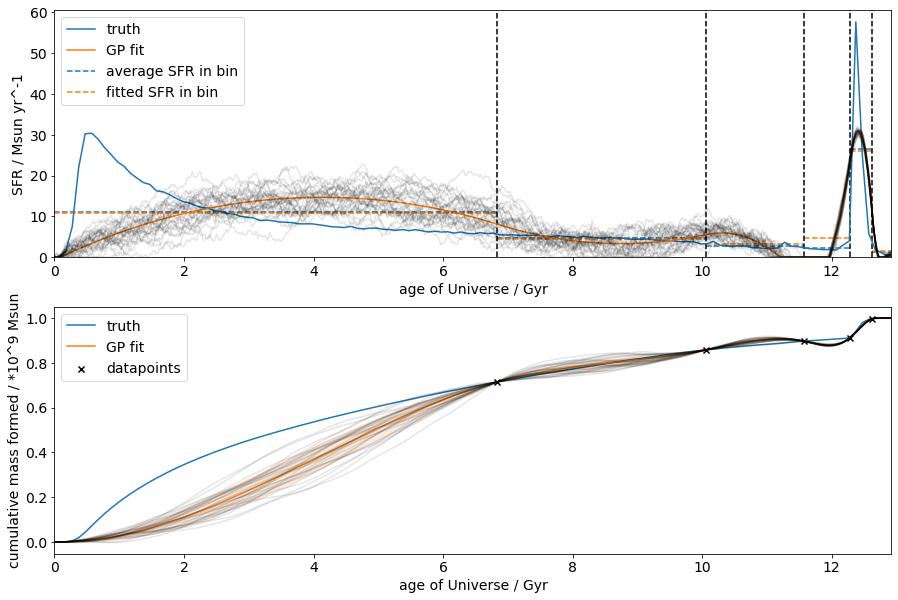

In [123]:
lt_sfh, lt_ages, lt_c_mass, lt_sfh_var, lt_c_mass_var, lt_samples = lt_fit(Nbins, tx, f_mass_formed)
lt_ave_sfr_ = cal_ave_sfr(lt_ages, lt_sfh, tx, age_at_z, abs_err=True, isfit=True)
lt_ave_sfr = lt_ave_sfr_[:-1]
print('(fitted) summed squared arror between averaged sfr and actual sfh =', lt_ave_sfr_[-1])

fig, ax = plt.subplots(2, 1, figsize=[15,10])
p0 = ax[0].plot(model_ages, model_sfh, label='truth')
ylims = ax[0].get_ylim()
ax[0].vlines(tx*age_at_z, 0, ylims[1], color='k', ls='--')
ax[0].hlines(*ave_sfr, color=p0[0].get_color(), ls='--', label='average SFR in bin', zorder=1)
p1 = ax[0].plot(lt_ages, lt_sfh, label='GP fit')
ax[0].hlines(*lt_ave_sfr, color=p1[0].get_color(), ls='--', label='fitted SFR in bin', zorder=1)
#ax[0].fill_between(lt_ages, lt_sfh-np.sqrt(lt_sfh_var), lt_sfh+np.sqrt(lt_sfh_var), 
#                  color='sandybrown', alpha=0.2)
ax[0].set_xlim([0,age_at_z])
ax[0].set_ylim([0,ylims[1]])
ax[0].set_xlabel('age of Universe / Gyr')
ax[0].set_ylabel('SFR / Msun yr^-1')
ax[0].legend()

ax[1].plot(model_ages, c_model_sfh, label='truth')
ax[1].scatter(tx*age_at_z, np.cumsum(f_mass_formed), color='k', marker='x', label='datapoints')
ax[1].plot(lt_ages, lt_c_mass, label='GP fit')
ax[1].fill_between(lt_ages, lt_c_mass-np.sqrt(lt_c_mass_var), lt_c_mass+np.sqrt(lt_c_mass_var), 
                  color='sandybrown', alpha=0.2)
ax[1].set_xlim([0,age_at_z])
ax[1].set_xlabel('age of Universe / Gyr')
ax[1].set_ylabel('cumulative mass formed / *10^9 Msun')
for samp in lt_samples:
    ax[0].plot(lt_ages, samp[0], color='k', alpha=0.1)
    ax[1].plot(lt_ages, samp[1], color='k', alpha=0.1)
ax[1].legend()
plt.show()

### How about mixing the two together? Becomes the hybrid scheme
A second idea Vivienne had was to mix the two binning schemes together to get the best of both worlds. This might mean fitting for (a fewer number of) bin boundaries in both schemes, then using a unified GP-sfh reconstruction function to recreate the SFH. <br>

There are two ways to do this: divide the final bin of top level iyer-binning using uniform log time, or using another layer of iyer-binning. For the version with uniform log time, it uses the most recent bin boundary as the end-time. <br>

First, the iyer-then-logtime is demonstrated, with 3 then 4 bins.

tx(fractional) = [0.14754982 0.46263317 0.81145231 0.93384364 0.9767875 ]
fractional mass formed = [0.33333333 0.33333333 0.20381874 0.03575488 0.09036774]
summed squared arror between averaged sfr and actual sfh = 384.04466583735297


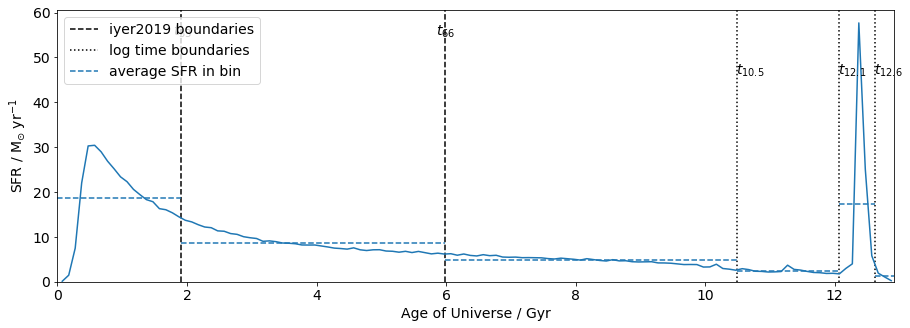

In [124]:
Nbins = [3,4]
tx_iyer = bin_iyer(Nbins[0])
tx_lt, mf_lt = bin_logtime(Nbins[1], end_time=(1-tx_iyer[-1])*age_at_z*10**9)

#converting dense_basis info into log time info
c_mf_iyer = np.arange(1,Nbins[0])/Nbins[0]
c_mf_lt = np.cumsum(mf_lt)
c_mf = np.concatenate((c_mf_iyer, c_mf_lt))
tx = np.concatenate((tx_iyer, tx_lt))
sort_ind = np.argsort(tx)
tx = tx[sort_ind]
c_mf = np.insert(c_mf[sort_ind],0,0)
mf = c_mf[1:]-c_mf[:-1]
print('tx(fractional) =',tx)
print('fractional mass formed =',mf)

ave_sfr_ = cal_ave_sfr(model_ages, model_sfh, tx, age_at_z, abs_err=True)
ave_sfr = ave_sfr_[:-1]
print('summed squared arror between averaged sfr and actual sfh =', ave_sfr_[-1])

fig, ax = plt.subplots(figsize=[15,5])
p0 = ax.plot(model_ages, model_sfh)
ax.set_xlim([0,age_at_z])
ax.set_xlabel('Age of Universe / Gyr')
ax.set_ylabel(r'SFR / $\rm{M_{\odot}}\; \rm{yr}^{-1}$')
ylims = ax.get_ylim()

ax.vlines(tx_iyer*age_at_z, 0, ylims[1], color='k', ls='--', label='iyer2019 boundaries')
for i,txi in enumerate(tx_iyer):
    ax.annotate('$t_{'+str(int((i+1)*100/Nbins[0]))+'}$', [(txi-0.01)*age_at_z, 0.95*max(model_sfh)])
ax.vlines(tx_lt*age_at_z, 0, ylims[1], color='k', ls=':', label='log time boundaries')
ax.hlines(*ave_sfr, color=p0[0].get_color(), ls='--', label='average SFR in bin')
for i,txi in enumerate(tx_lt):
    ax.annotate('$t_{'+str(np.round(txi*age_at_z,1))+'}$', [(txi*age_at_z-0.01), 0.8*max(model_sfh)])
    
ax.set_ylim([0,ylims[1]])
ax.legend()
plt.show()

(fitted) summed squared arror between averaged sfr and actual sfh = 387.2489772976319


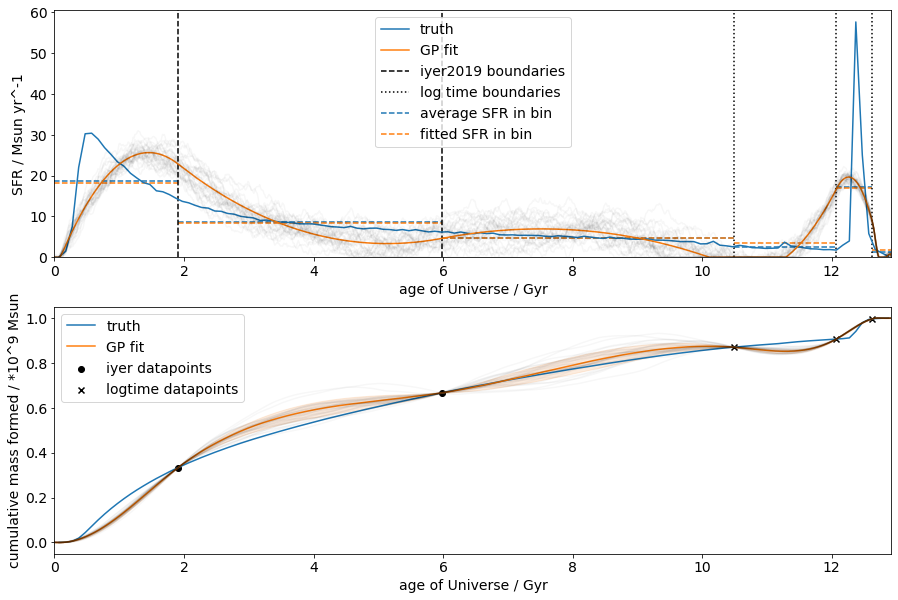

In [125]:
combine_sfh, combine_ages, combine_c_mass, combine_sfh_var, combine_c_mass_var, combine_samples = lt_fit(np.sum(Nbins)-1, tx, mf)
combine_ave_sfr_ = cal_ave_sfr(combine_ages, combine_sfh, tx, age_at_z, abs_err=True, isfit=True)
combine_ave_sfr = combine_ave_sfr_[:-1]
print('(fitted) summed squared arror between averaged sfr and actual sfh =', combine_ave_sfr_[-1])

fig, ax = plt.subplots(2, 1, figsize=[15,10])
p0 = ax[0].plot(model_ages, model_sfh, label='truth')
ylims = ax[0].get_ylim()
ax[0].vlines(tx_iyer*age_at_z, 0, ylims[1], color='k', ls='--', label='iyer2019 boundaries')
ax[0].vlines(tx_lt*age_at_z, 0, ylims[1], color='k', ls=':', label='log time boundaries')
ax[0].hlines(*ave_sfr, color=p0[0].get_color(), ls='--', label='average SFR in bin', zorder=1)
p1 = ax[0].plot(combine_ages, combine_sfh, label='GP fit')
ax[0].hlines(*combine_ave_sfr, color=p1[0].get_color(), ls='--', label='fitted SFR in bin', zorder=1)
#ax[0].fill_between(combine_ages, combine_sfh-np.sqrt(combine_sfh_var), combine_sfh+np.sqrt(combine_sfh_var), 
#                  color='sandybrown', alpha=0.2)
ax[0].set_xlim([0,age_at_z])
ax[0].set_ylim([0,ylims[1]])
ax[0].set_xlabel('age of Universe / Gyr')
ax[0].set_ylabel('SFR / Msun yr^-1')
ax[0].legend()

ax[1].plot(model_ages, c_model_sfh, label='truth')
ax[1].scatter(tx_iyer*age_at_z, np.linspace(0,1,Nbins[0]+1)[1:-1], color='k', label='iyer datapoints')
ax[1].scatter(tx_lt*age_at_z, c_mf_lt, color='k', marker='x', label='logtime datapoints')
ax[1].plot(combine_ages, combine_c_mass, label='GP fit')
ax[1].fill_between(combine_ages, combine_c_mass-np.sqrt(combine_c_mass_var), combine_c_mass+np.sqrt(combine_c_mass_var), 
                  color='sandybrown', alpha=0.2)
ax[1].set_xlim([0,age_at_z])
ax[1].set_xlabel('age of Universe / Gyr')
ax[1].set_ylabel('cumulative mass formed / *10^9 Msun')
for samp in combine_samples:
    ax[0].plot(combine_ages, samp[0], color='k', alpha=0.03)
    ax[1].plot(combine_ages, samp[1], color='k', alpha=0.03)
ax[1].legend()
plt.show()

And next the iyer-then-iyer, with 3 then 4 bins.

[0.14754982 0.46263317] [0.58889508 0.73116863 0.95136111]
tx(fractional) = [0.14754982 0.46263317 0.58889508 0.73116863 0.95136111]
fractional mass formed = [0.33333333 0.33333333 0.08333333 0.08333333 0.08333333]
summed squared arror between averaged sfr and actual sfh = 386.21758188372274


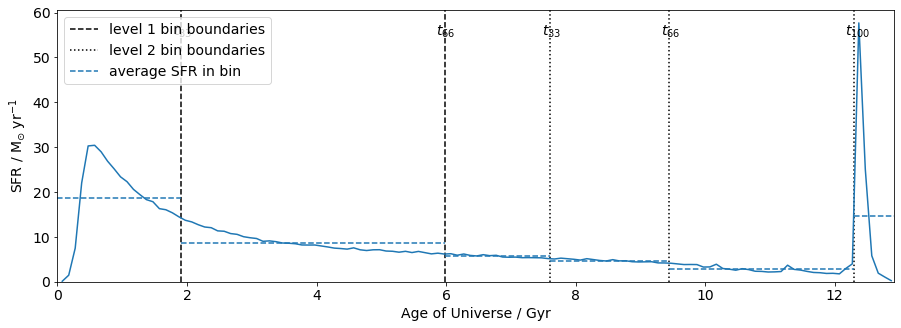

In [126]:
Nbins = [3,4]
tx1 = bin_iyer(Nbins[0])
tx2 = bin_iyer(Nbins[1], end_time=(1-tx1[-1])*age_at_z*1e9)
print(tx1,tx2)

#converting dense_basis info into log time info
c_mf_1 = np.arange(1,Nbins[0])/Nbins[0]
c_mf_2 = np.arange(1,Nbins[1])/Nbins[0]/Nbins[1]+(Nbins[0]-1)/Nbins[0]
c_mf = np.concatenate((c_mf_1, c_mf_2))
tx = np.concatenate((tx1, tx2))
sort_ind = np.argsort(tx)
tx = tx[sort_ind]
c_mf = np.insert(c_mf[sort_ind],0,0)
mf = c_mf[1:]-c_mf[:-1]
print('tx(fractional) =',tx)
print('fractional mass formed =',mf)

ave_sfr_ = cal_ave_sfr(model_ages, model_sfh, tx, age_at_z, abs_err=True)
ave_sfr = ave_sfr_[:-1]
print('summed squared arror between averaged sfr and actual sfh =', ave_sfr_[-1])

fig, ax = plt.subplots(figsize=[15,5])
p0 = ax.plot(model_ages, model_sfh)
ax.set_xlim([0,age_at_z])
ax.set_xlabel('Age of Universe / Gyr')
ax.set_ylabel(r'SFR / $\rm{M_{\odot}}\; \rm{yr}^{-1}$')
ylims = ax.get_ylim()

ax.vlines(tx1*age_at_z, 0, ylims[1], color='k', ls='--', label='level 1 bin boundaries')
for i,txi in enumerate(tx1):
    ax.annotate('$t_{'+str(int((i+1)*100/Nbins[0]))+'}$', [(txi-0.01)*age_at_z, 0.95*max(model_sfh)])
ax.vlines(tx2*age_at_z, 0, ylims[1], color='k', ls=':', label='level 2 bin boundaries')
ax.hlines(*ave_sfr, color=p0[0].get_color(), ls='--', label='average SFR in bin')
for i,txi in enumerate(tx2):
    ax.annotate('$t_{'+str(int((i+1)*100/Nbins[0]))+'}$', [(txi-0.01)*age_at_z, 0.95*max(model_sfh)])
    
ax.set_ylim([0,ylims[1]])
ax.legend()
plt.show()

(fitted) summed squared arror between averaged sfr and actual sfh = 460.1869533830464


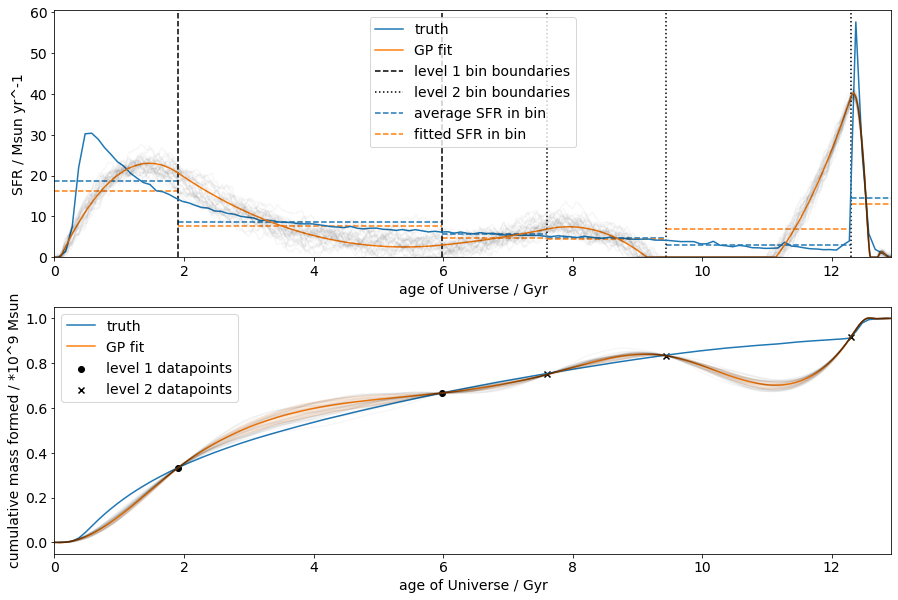

In [127]:
double_sfh, double_ages, double_c_mass, double_sfh_var, double_c_mass_var, double_samples = lt_fit(np.sum(Nbins)-1, tx, mf)
double_ave_sfr_ = cal_ave_sfr(double_ages, double_sfh, tx, age_at_z, abs_err=True, isfit=True)
double_ave_sfr = double_ave_sfr_[:-1]
print('(fitted) summed squared arror between averaged sfr and actual sfh =', double_ave_sfr_[-1])

fig, ax = plt.subplots(2, 1, figsize=[15,10])
p0 = ax[0].plot(model_ages, model_sfh, label='truth')
ylims = ax[0].get_ylim()
ax[0].vlines(tx1*age_at_z, 0, ylims[1], color='k', ls='--', label='level 1 bin boundaries')
ax[0].vlines(tx2*age_at_z, 0, ylims[1], color='k', ls=':', label='level 2 bin boundaries')
ax[0].hlines(*ave_sfr, color=p0[0].get_color(), ls='--', label='average SFR in bin', zorder=1)
p1 = ax[0].plot(double_ages, double_sfh, label='GP fit')
ax[0].hlines(*double_ave_sfr, color=p1[0].get_color(), ls='--', label='fitted SFR in bin', zorder=1)
#ax[0].fill_between(double_ages, double_sfh-np.sqrt(double_sfh_var), double_sfh+np.sqrt(double_sfh_var), 
#                  color='sandybrown', alpha=0.2)
ax[0].set_xlim([0,age_at_z])
ax[0].set_ylim([0,ylims[1]])
ax[0].set_xlabel('age of Universe / Gyr')
ax[0].set_ylabel('SFR / Msun yr^-1')
ax[0].legend()

ax[1].plot(model_ages, c_model_sfh, label='truth')
ax[1].scatter(tx1*age_at_z, c_mf_1, color='k', label='level 1 datapoints')
ax[1].scatter(tx2*age_at_z, c_mf_2, color='k', marker='x', label='level 2 datapoints')
ax[1].plot(double_ages, double_c_mass, label='GP fit')
ax[1].fill_between(double_ages, double_c_mass-np.sqrt(double_c_mass_var), double_c_mass+np.sqrt(double_c_mass_var), 
                  color='sandybrown', alpha=0.2)
ax[1].set_xlim([0,age_at_z])
ax[1].set_xlabel('age of Universe / Gyr')
ax[1].set_ylabel('cumulative mass formed / *10^9 Msun')
for samp in double_samples:
    ax[0].plot(double_ages, samp[0], color='k', alpha=0.03)
    ax[1].plot(double_ages, samp[1], color='k', alpha=0.03)
ax[1].legend()
plt.show()

# Section 2: graphical showcase of the fitted SFH from 2 to 24 bins
Since I have noticed during previous meetings that the inabiliy to play around with varying the number of bins makes this notebook less useful, I thought I will just plot every single fitted SFHs with the wide range of number of bins for each method all at once.

### First defining some functions

In [174]:
def plot_sfh(ax, ylims):
    ax[0].set_xlim([0,age_at_z])
    ax[0].set_ylim([0,ylims[1]])
    ax[0].set_xlabel('age of Universe / Gyr')
    ax[0].set_ylabel('SFR / Msun yr^-1')
    ax[0].legend()
    
    ax[1].set_xlim([0,age_at_z])
    ax[1].set_xlabel('age of Universe / Gyr')
    ax[1].set_ylabel('cumulative mass formed / *10^9 Msun')
    ax[1].legend()
    return ax

def do_iyer_fitting(Nbins, vb=True):
    if vb == True:
        print(f'Iyer-only binning and fitting for {Nbins} bins.')
    tx = bin_iyer(Nbins)
    ave_sfr_ = cal_ave_sfr(model_ages, model_sfh, tx, age_at_z, abs_err=True)
    ave_sfr = ave_sfr_[:-1]
    if vb == True:
        print('(binning) summed squared arror between averaged sfr and actual sfh =', ave_sfr_[-1])
    
    iyer_sfh, iyer_ages, iyer_c_mass, iyer_sfh_var, iyer_c_mass_var, iyer_samples = db_fit(Nbins, tx)
    iyer_ave_sfr_ = cal_ave_sfr(iyer_ages, iyer_sfh, tx, age_at_z, abs_err=True, isfit=True)
    iyer_ave_sfr = iyer_ave_sfr_[:-1]
    if vb == True:
        print('(fitted) summed squared arror between averaged sfr and actual sfh =', iyer_ave_sfr_[-1])

    if vb == True:
        fig, ax = plt.subplots(2, 1, figsize=[15,10])
        p0 = ax[0].plot(model_ages, model_sfh, label='truth')
        ylims = ax[0].get_ylim()
        ax[0].vlines(tx*age_at_z, 0, ylims[1], color='k', ls='--')
        ax[0].hlines(*ave_sfr, color=p0[0].get_color(), ls='--', label='average SFR in bin', zorder=1)
        p1 = ax[0].plot(iyer_ages, iyer_sfh, label='GP fit')
        ax[0].hlines(*iyer_ave_sfr, color=p1[0].get_color(), ls='--', label='fitted SFR in bin', zorder=1)

        ax[1].plot(model_ages, c_model_sfh, label='truth')
        ax[1].scatter(tx*age_at_z, np.linspace(0,1,Nbins+1)[1:-1], color='k', label='datapoints')
        ax[1].plot(iyer_ages, iyer_c_mass, label='GP fit')
        ax[1].fill_between(iyer_ages, iyer_c_mass-np.sqrt(iyer_c_mass_var), iyer_c_mass+np.sqrt(iyer_c_mass_var), 
                          color='sandybrown', alpha=0.2)
        for samp in iyer_samples:
            ax[0].plot(iyer_ages, samp[0], color='k', alpha=0.1)
            ax[1].plot(iyer_ages, samp[1], color='k', alpha=0.1)

        ax = plot_sfh(ax, ylims)
        plt.show()
    
    return ave_sfr_[-1], iyer_ave_sfr_[-1]
    
def do_lt_fitting(Nbins, vb=True):
    if vb == True:
        print(f'Log-time-only binning and fitting for {Nbins} bins.')
    tx, f_mass_formed = bin_logtime(Nbins, interp=True, end_time=None)
    ave_sfr_ = cal_ave_sfr(model_ages, model_sfh, tx, age_at_z, abs_err=True)
    ave_sfr = ave_sfr_[:-1]
    if vb == True:
        print('(binning) summed squared arror between averaged sfr and actual sfh =', ave_sfr_[-1])
    
    lt_sfh, lt_ages, lt_c_mass, lt_sfh_var, lt_c_mass_var, lt_samples = lt_fit(Nbins, tx, f_mass_formed)
    lt_ave_sfr_ = cal_ave_sfr(lt_ages, lt_sfh, tx, age_at_z, abs_err=True, isfit=True)
    lt_ave_sfr = lt_ave_sfr_[:-1]
    if vb == True:
        print('(fitted) summed squared arror between averaged sfr and actual sfh =', lt_ave_sfr_[-1])

    if vb == True:
        fig, ax = plt.subplots(2, 1, figsize=[15,10])
        p0 = ax[0].plot(model_ages, model_sfh, label='truth')
        ylims = ax[0].get_ylim()
        ax[0].vlines(tx*age_at_z, 0, ylims[1], color='k', ls='--')
        ax[0].hlines(*ave_sfr, color=p0[0].get_color(), ls='--', label='average SFR in bin', zorder=1)
        p1 = ax[0].plot(lt_ages, lt_sfh, label='GP fit')
        ax[0].hlines(*lt_ave_sfr, color=p1[0].get_color(), ls='--', label='fitted SFR in bin', zorder=1)

        ax[1].plot(model_ages, c_model_sfh, label='truth')
        ax[1].scatter(tx*age_at_z, np.cumsum(f_mass_formed), color='k', marker='x', label='datapoints')
        ax[1].plot(lt_ages, lt_c_mass, label='GP fit')
        ax[1].fill_between(lt_ages, lt_c_mass-np.sqrt(lt_c_mass_var), lt_c_mass+np.sqrt(lt_c_mass_var), 
                          color='sandybrown', alpha=0.2)
        for samp in lt_samples:
            ax[0].plot(lt_ages, samp[0], color='k', alpha=0.1)
            ax[1].plot(lt_ages, samp[1], color='k', alpha=0.1)

        ax = plot_sfh(ax, ylims)
        plt.show()
        
    return ave_sfr_[-1], lt_ave_sfr_[-1]
    
def do_iyer_lt_fitting(Nbins, vb=True):
    if vb == True:
        print(f'Iyer-then-log-time binning and fitting for {Nbins[0]} and then {Nbins[1]} bins.')
    tx_iyer = bin_iyer(Nbins[0])
    tx_lt, mf_lt = bin_logtime(Nbins[1], end_time=(1-tx_iyer[-1])*age_at_z*10**9)

    #converting dense_basis info into log time info
    c_mf_iyer = np.arange(1,Nbins[0])/Nbins[0]
    c_mf_lt = np.cumsum(mf_lt)
    c_mf = np.concatenate((c_mf_iyer, c_mf_lt))
    tx = np.concatenate((tx_iyer, tx_lt))
    sort_ind = np.argsort(tx)
    tx = tx[sort_ind]
    c_mf = np.insert(c_mf[sort_ind],0,0)
    mf = c_mf[1:]-c_mf[:-1]

    ave_sfr_ = cal_ave_sfr(model_ages, model_sfh, tx, age_at_z, abs_err=True)
    ave_sfr = ave_sfr_[:-1]
    if vb == True:
        print('(binning) summed squared arror between averaged sfr and actual sfh =', ave_sfr_[-1])
    
    combine_sfh, combine_ages, combine_c_mass, combine_sfh_var, combine_c_mass_var, combine_samples = lt_fit(np.sum(Nbins)-1, tx, mf)
    combine_ave_sfr_ = cal_ave_sfr(combine_ages, combine_sfh, tx, age_at_z, abs_err=True, isfit=True)
    combine_ave_sfr = combine_ave_sfr_[:-1]
    if vb == True:
        print('(fitted) summed squared arror between averaged sfr and actual sfh =', combine_ave_sfr_[-1])

    if vb == True:
        fig, ax = plt.subplots(2, 1, figsize=[15,10])
        p0 = ax[0].plot(model_ages, model_sfh, label='truth')
        ylims = ax[0].get_ylim()
        ax[0].vlines(tx_iyer*age_at_z, 0, ylims[1], color='k', ls='--', label='iyer2019 boundaries')
        ax[0].vlines(tx_lt*age_at_z, 0, ylims[1], color='k', ls=':', label='log time boundaries')
        ax[0].hlines(*ave_sfr, color=p0[0].get_color(), ls='--', label='average SFR in bin', zorder=1)
        p1 = ax[0].plot(combine_ages, combine_sfh, label='GP fit')
        ax[0].hlines(*combine_ave_sfr, color=p1[0].get_color(), ls='--', label='fitted SFR in bin', zorder=1)

        ax[1].plot(model_ages, c_model_sfh, label='truth')
        ax[1].scatter(tx_iyer*age_at_z, np.linspace(0,1,Nbins[0]+1)[1:-1], color='k', label='iyer datapoints')
        ax[1].scatter(tx_lt*age_at_z, c_mf_lt, color='k', marker='x', label='logtime datapoints')
        ax[1].plot(combine_ages, combine_c_mass, label='GP fit')
        ax[1].fill_between(combine_ages, combine_c_mass-np.sqrt(combine_c_mass_var), combine_c_mass+np.sqrt(combine_c_mass_var), 
                          color='sandybrown', alpha=0.2)
        for samp in combine_samples:
            ax[0].plot(combine_ages, samp[0], color='k', alpha=0.03)
            ax[1].plot(combine_ages, samp[1], color='k', alpha=0.03)

        ax = plot_sfh(ax, ylims)
        plt.show()
        
    return ave_sfr_[-1], combine_ave_sfr_[-1]
    
def do_iyer_iyer_fitting(Nbins, vb=True):
    if vb == True:
        print(f'Iyer-then-log-time binning and fitting for {Nbins[0]} and then {Nbins[1]} bins.')
    tx1 = bin_iyer(Nbins[0])
    tx2 = bin_iyer(Nbins[1], end_time=(1-tx1[-1])*age_at_z*1e9)

    #converting dense_basis info into log time info
    c_mf_1 = np.arange(1,Nbins[0])/Nbins[0]
    c_mf_2 = np.arange(1,Nbins[1])/Nbins[0]/Nbins[1]+(Nbins[0]-1)/Nbins[0]
    c_mf = np.concatenate((c_mf_1, c_mf_2))
    tx = np.concatenate((tx1, tx2))
    sort_ind = np.argsort(tx)
    tx = tx[sort_ind]
    c_mf = np.insert(c_mf[sort_ind],0,0)
    mf = c_mf[1:]-c_mf[:-1]

    ave_sfr_ = cal_ave_sfr(model_ages, model_sfh, tx, age_at_z, abs_err=True)
    ave_sfr = ave_sfr_[:-1]
    if vb == True:
        print('(binning) summed squared arror between averaged sfr and actual sfh =', ave_sfr_[-1])
    
    double_sfh, double_ages, double_c_mass, double_sfh_var, double_c_mass_var, double_samples = lt_fit(np.sum(Nbins)-1, tx, mf)
    double_ave_sfr_ = cal_ave_sfr(double_ages, double_sfh, tx, age_at_z, abs_err=True, isfit=True)
    double_ave_sfr = double_ave_sfr_[:-1]
    if vb == True:
        print('(fitted) summed squared arror between averaged sfr and actual sfh =', double_ave_sfr_[-1])

    if vb == True:
        fig, ax = plt.subplots(2, 1, figsize=[15,10])
        p0 = ax[0].plot(model_ages, model_sfh, label='truth')
        ylims = ax[0].get_ylim()
        ax[0].vlines(tx1*age_at_z, 0, ylims[1], color='k', ls='--', label='level 1 bin boundaries')
        ax[0].vlines(tx2*age_at_z, 0, ylims[1], color='k', ls=':', label='level 2 bin boundaries')
        ax[0].hlines(*ave_sfr, color=p0[0].get_color(), ls='--', label='average SFR in bin', zorder=1)
        p1 = ax[0].plot(double_ages, double_sfh, label='GP fit')
        ax[0].hlines(*double_ave_sfr, color=p1[0].get_color(), ls='--', label='fitted SFR in bin', zorder=1)

        ax[1].plot(model_ages, c_model_sfh, label='truth')
        ax[1].scatter(tx1*age_at_z, c_mf_1, color='k', label='level 1 datapoints')
        ax[1].scatter(tx2*age_at_z, c_mf_2, color='k', marker='x', label='level 2 datapoints')
        ax[1].plot(double_ages, double_c_mass, label='GP fit')
        ax[1].fill_between(double_ages, double_c_mass-np.sqrt(double_c_mass_var), double_c_mass+np.sqrt(double_c_mass_var), 
                          color='sandybrown', alpha=0.2)
        for samp in double_samples:
            ax[0].plot(double_ages, samp[0], color='k', alpha=0.03)
            ax[1].plot(double_ages, samp[1], color='k', alpha=0.03)

        ax = plot_sfh(ax, ylims)
        plt.show()
        
    return ave_sfr_[-1], double_ave_sfr_[-1]

### Iyer only binning from 2 to 24 bins

Iyer-only binning and fitting for 2 bins.
(binning) summed squared arror between averaged sfr and actual sfh = 529.1457437004509
(fitted) summed squared arror between averaged sfr and actual sfh = 529.2245860355065


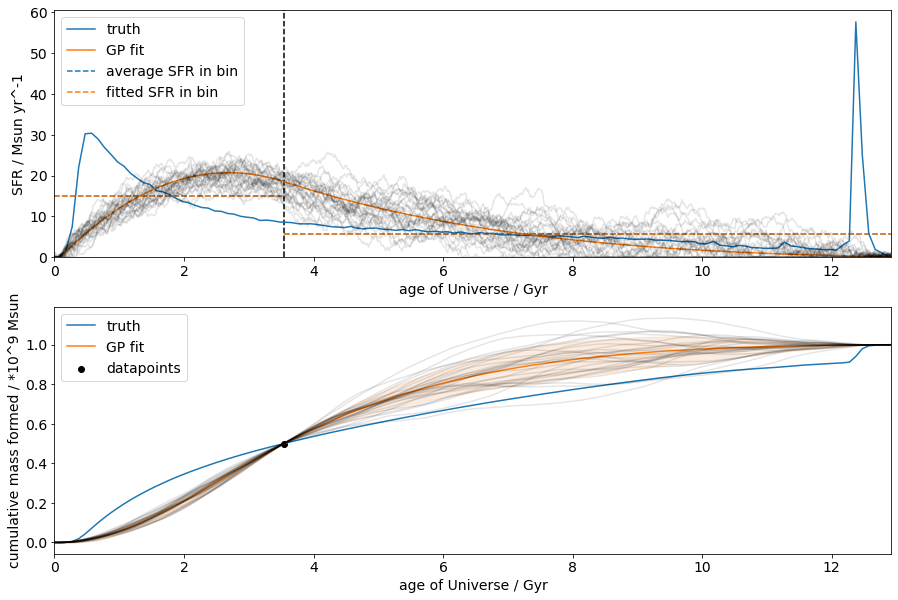

Iyer-only binning and fitting for 3 bins.
(binning) summed squared arror between averaged sfr and actual sfh = 472.4918481049863
(fitted) summed squared arror between averaged sfr and actual sfh = 472.7125229403981


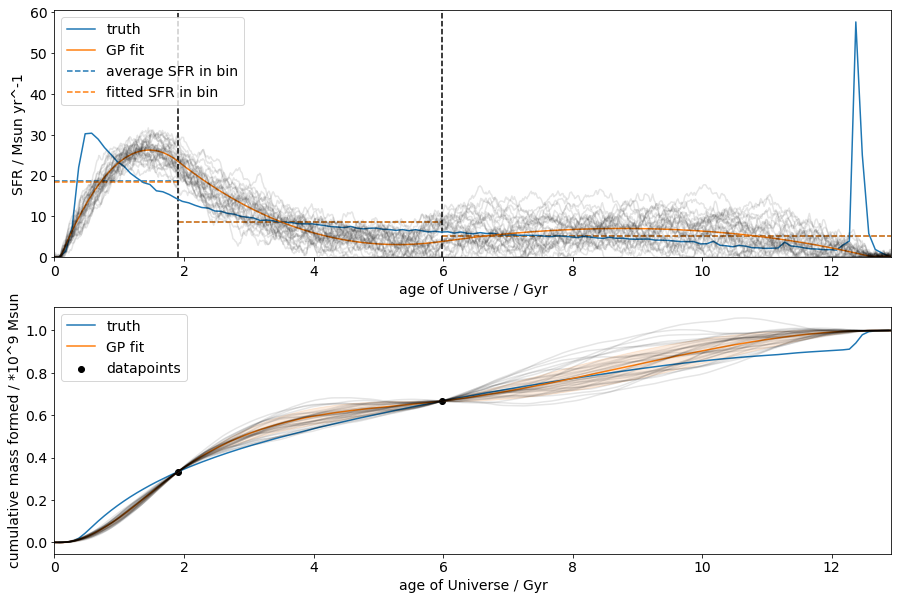

Iyer-only binning and fitting for 4 bins.
(binning) summed squared arror between averaged sfr and actual sfh = 468.51938099384483
(fitted) summed squared arror between averaged sfr and actual sfh = 468.79324275677493


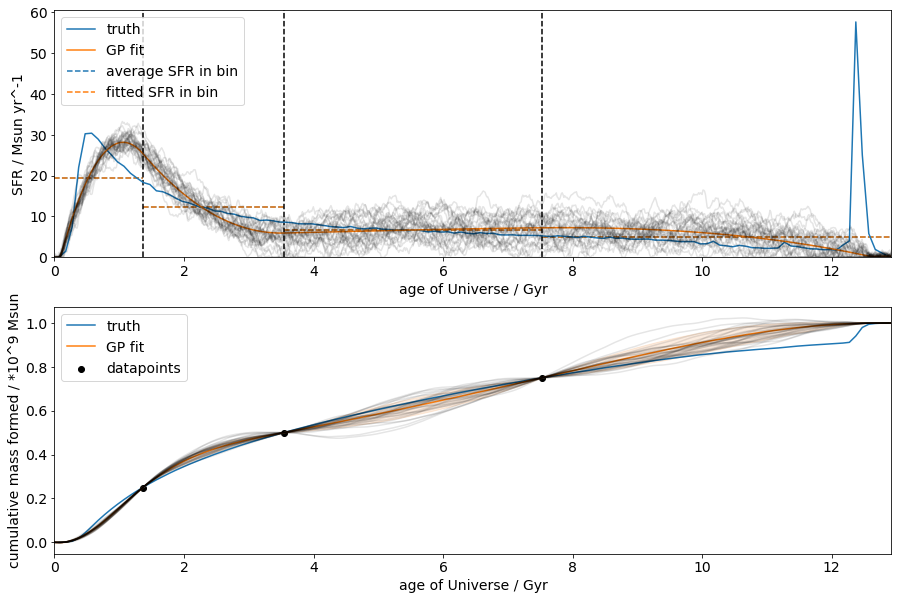

Iyer-only binning and fitting for 5 bins.
(binning) summed squared arror between averaged sfr and actual sfh = 461.9403794969553
(fitted) summed squared arror between averaged sfr and actual sfh = 462.32781146542686


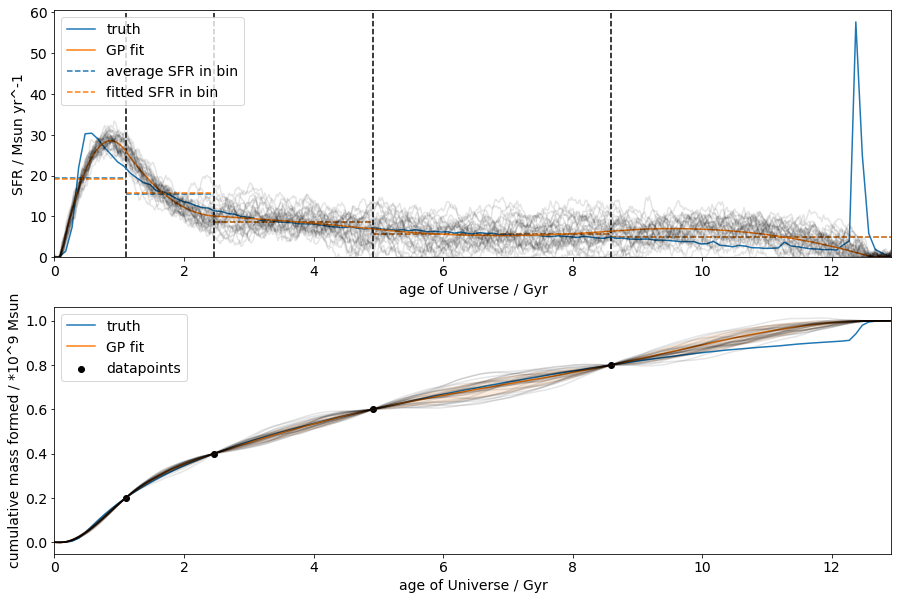

Iyer-only binning and fitting for 6 bins.
(binning) summed squared arror between averaged sfr and actual sfh = 459.377323023472
(fitted) summed squared arror between averaged sfr and actual sfh = 459.74644888854965


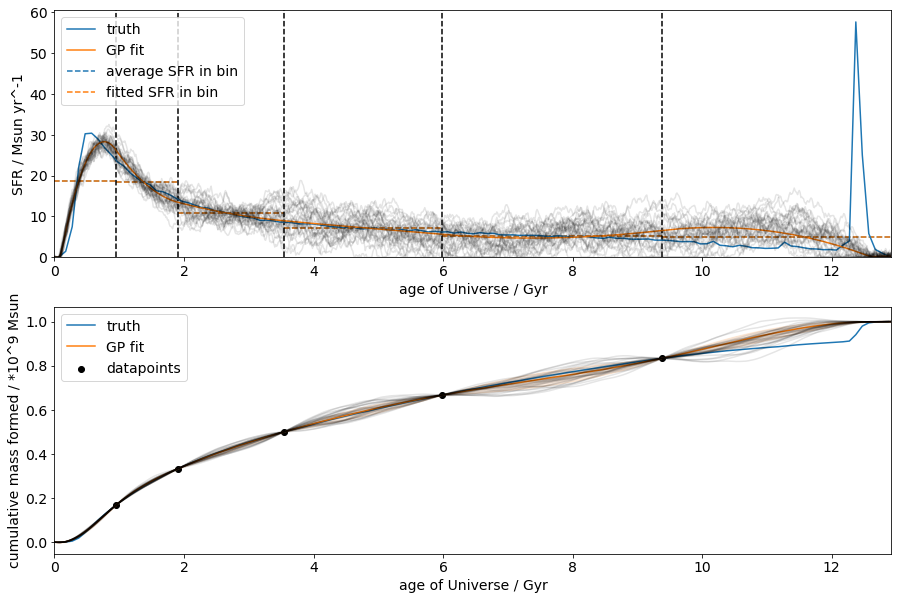

Iyer-only binning and fitting for 7 bins.
(binning) summed squared arror between averaged sfr and actual sfh = 453.70649140373234
(fitted) summed squared arror between averaged sfr and actual sfh = 454.1043438821246


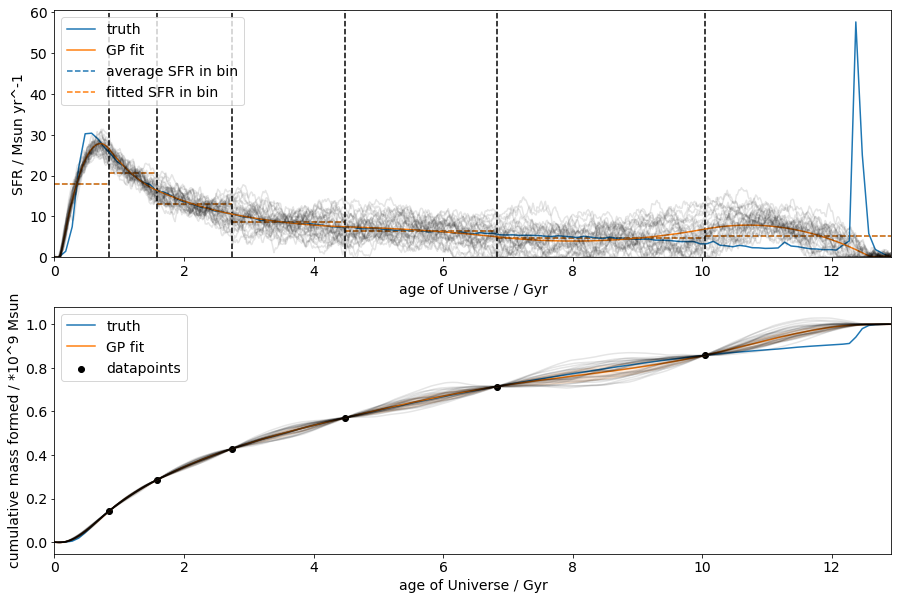

Iyer-only binning and fitting for 8 bins.
(binning) summed squared arror between averaged sfr and actual sfh = 442.0925565806186
(fitted) summed squared arror between averaged sfr and actual sfh = 442.27033191810597


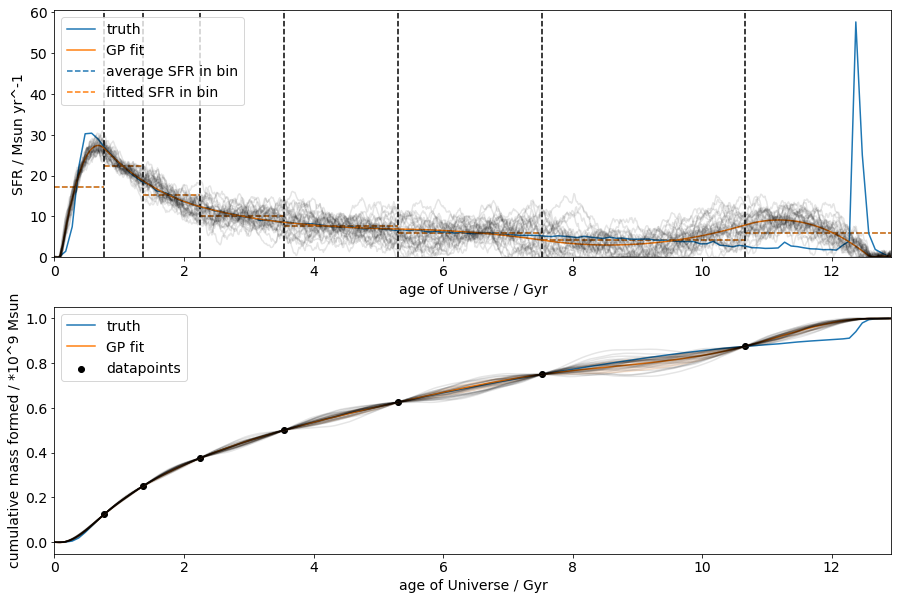

Iyer-only binning and fitting for 9 bins.
(binning) summed squared arror between averaged sfr and actual sfh = 430.66251513947714
(fitted) summed squared arror between averaged sfr and actual sfh = 431.16763012363907


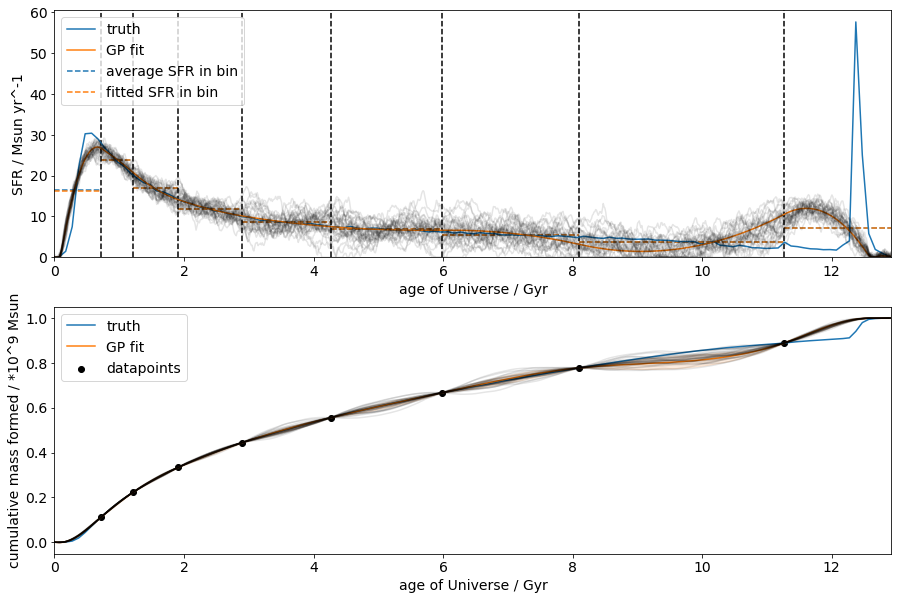

Iyer-only binning and fitting for 10 bins.
(binning) summed squared arror between averaged sfr and actual sfh = 416.81257711564473
(fitted) summed squared arror between averaged sfr and actual sfh = 417.55954207174466


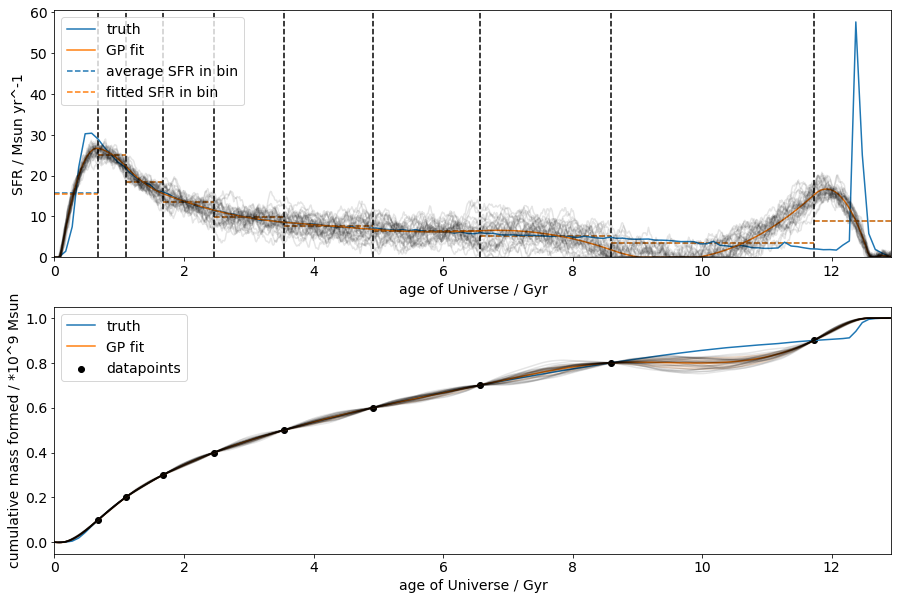

Iyer-only binning and fitting for 11 bins.
(binning) summed squared arror between averaged sfr and actual sfh = 356.20523794767564
(fitted) summed squared arror between averaged sfr and actual sfh = 389.71818086530106


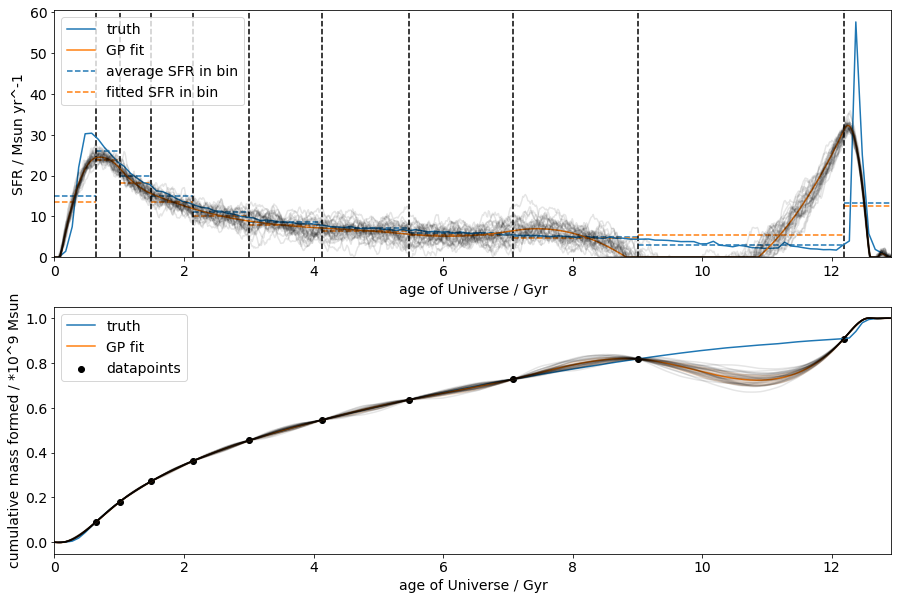

Iyer-only binning and fitting for 12 bins.
(binning) summed squared arror between averaged sfr and actual sfh = 343.2166359337058
(fitted) summed squared arror between averaged sfr and actual sfh = 413.3711220879904


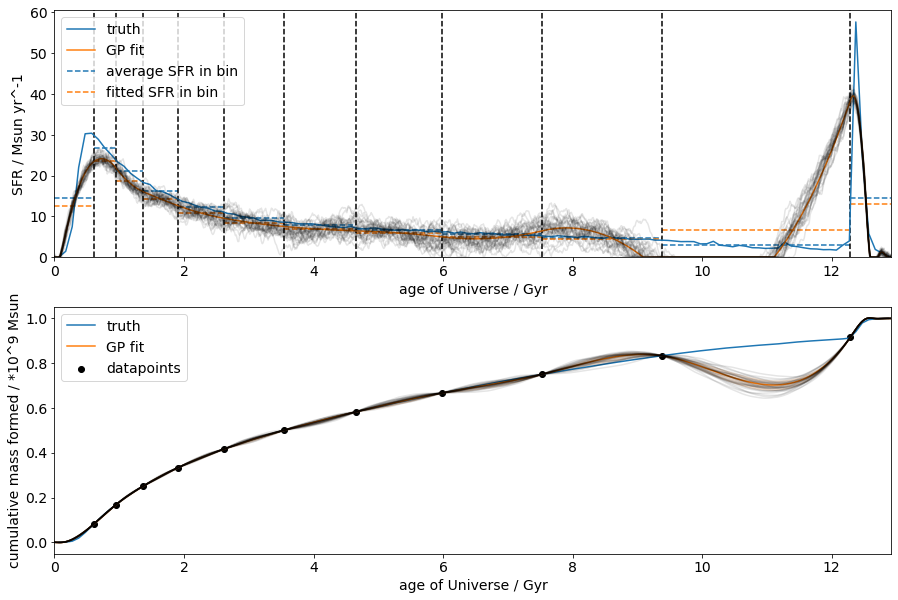

Iyer-only binning and fitting for 13 bins.
(binning) summed squared arror between averaged sfr and actual sfh = 344.3691541303609
(fitted) summed squared arror between averaged sfr and actual sfh = 413.8334326656428


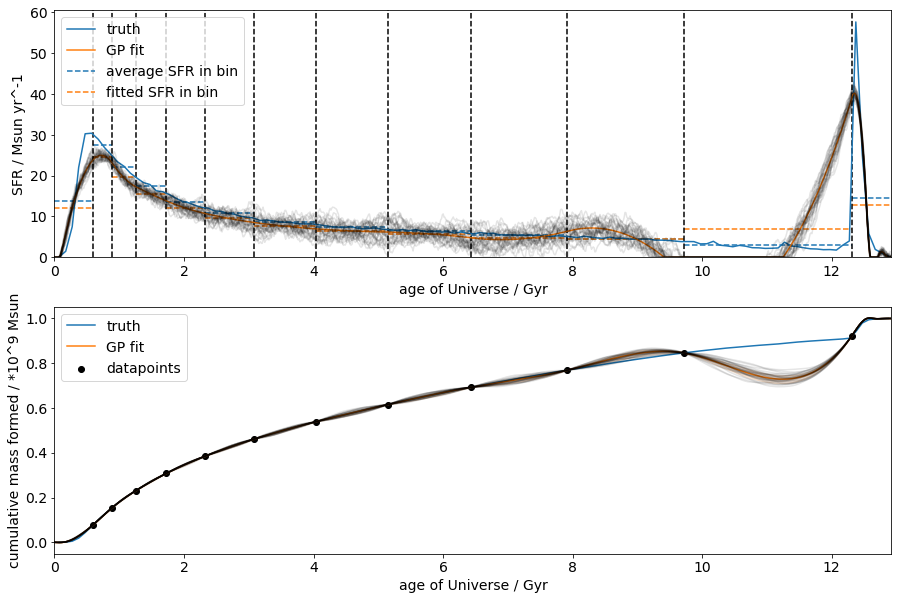

Iyer-only binning and fitting for 14 bins.
(binning) summed squared arror between averaged sfr and actual sfh = 318.4942118662886
(fitted) summed squared arror between averaged sfr and actual sfh = 384.57716346360337


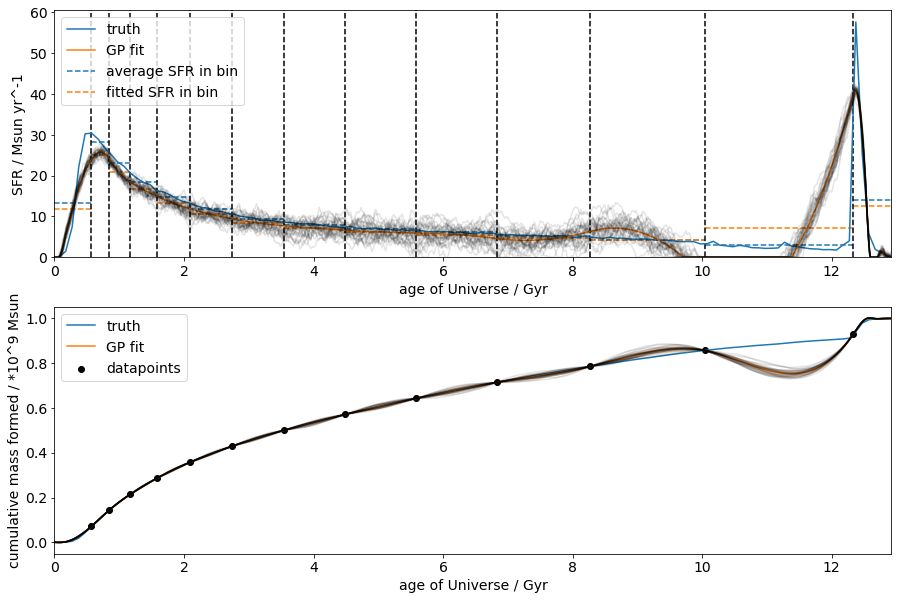

Iyer-only binning and fitting for 15 bins.
(binning) summed squared arror between averaged sfr and actual sfh = 320.9964524037345
(fitted) summed squared arror between averaged sfr and actual sfh = 382.8850792068289


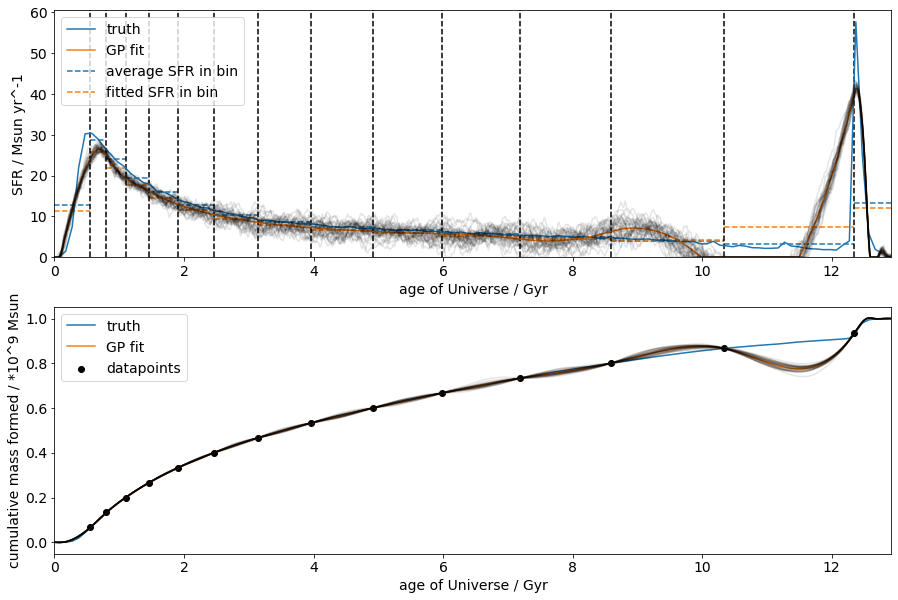

Iyer-only binning and fitting for 16 bins.
(binning) summed squared arror between averaged sfr and actual sfh = 326.998243810216
(fitted) summed squared arror between averaged sfr and actual sfh = 383.7982240808838


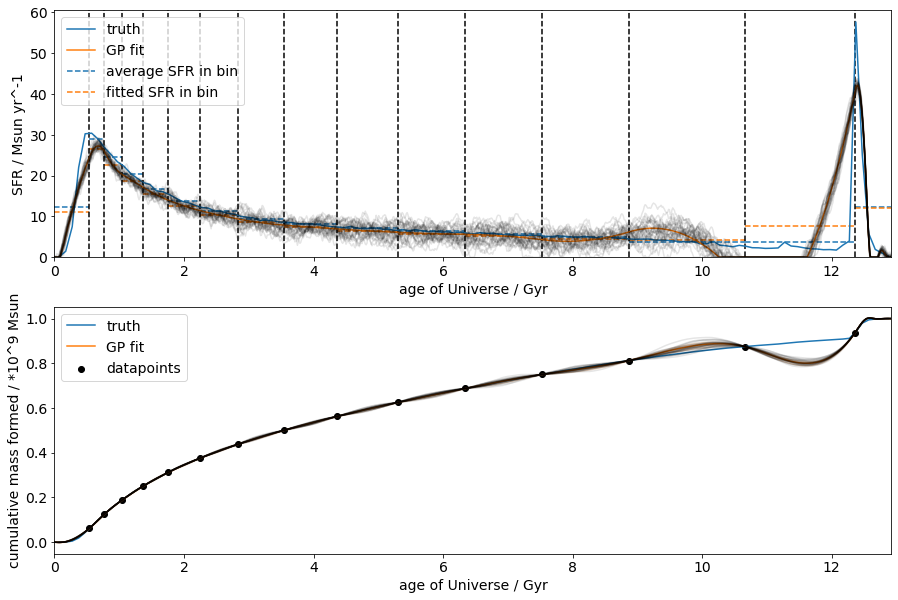

Iyer-only binning and fitting for 17 bins.
(binning) summed squared arror between averaged sfr and actual sfh = 403.74083815680547
(fitted) summed squared arror between averaged sfr and actual sfh = 411.7101737333371


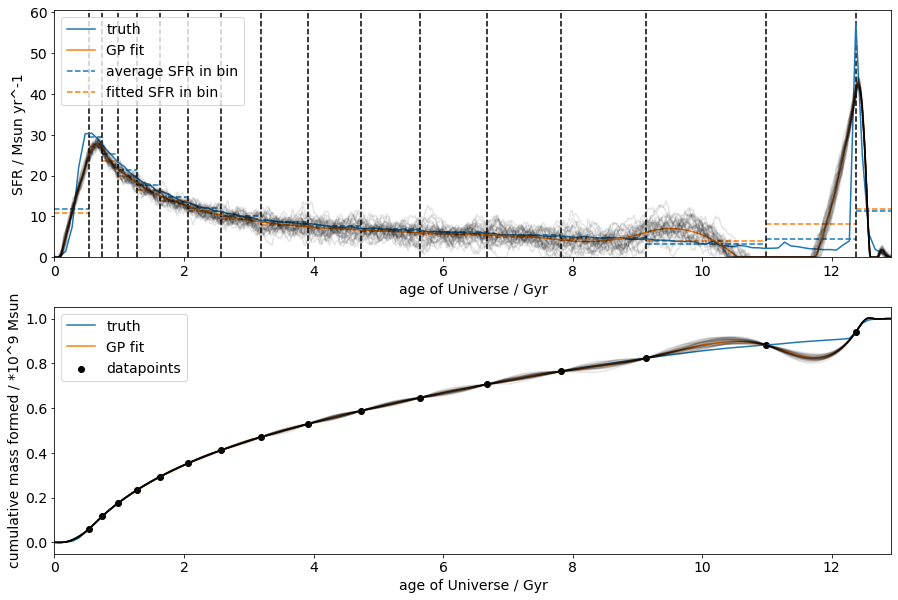

Iyer-only binning and fitting for 18 bins.
(binning) summed squared arror between averaged sfr and actual sfh = 395.420884568151
(fitted) summed squared arror between averaged sfr and actual sfh = 403.07100297276804


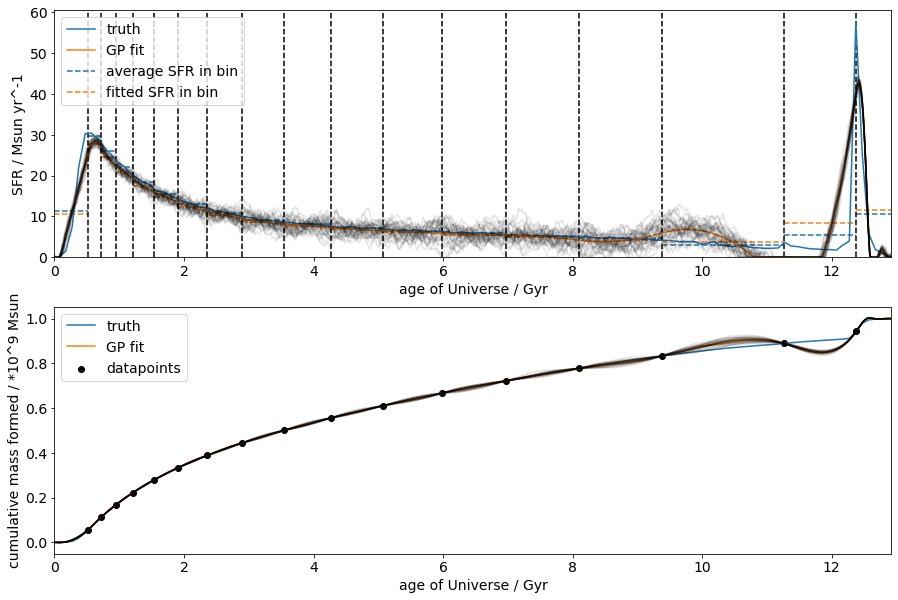

Iyer-only binning and fitting for 19 bins.
(binning) summed squared arror between averaged sfr and actual sfh = 388.2879369440822
(fitted) summed squared arror between averaged sfr and actual sfh = 392.5795133631648


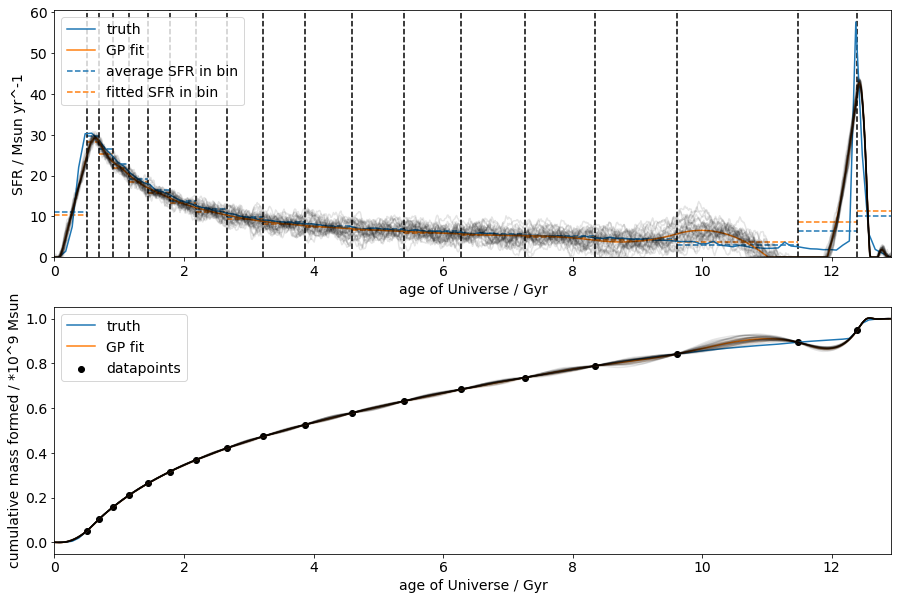

Iyer-only binning and fitting for 20 bins.
(binning) summed squared arror between averaged sfr and actual sfh = 376.5171844064551
(fitted) summed squared arror between averaged sfr and actual sfh = 381.80955087263703


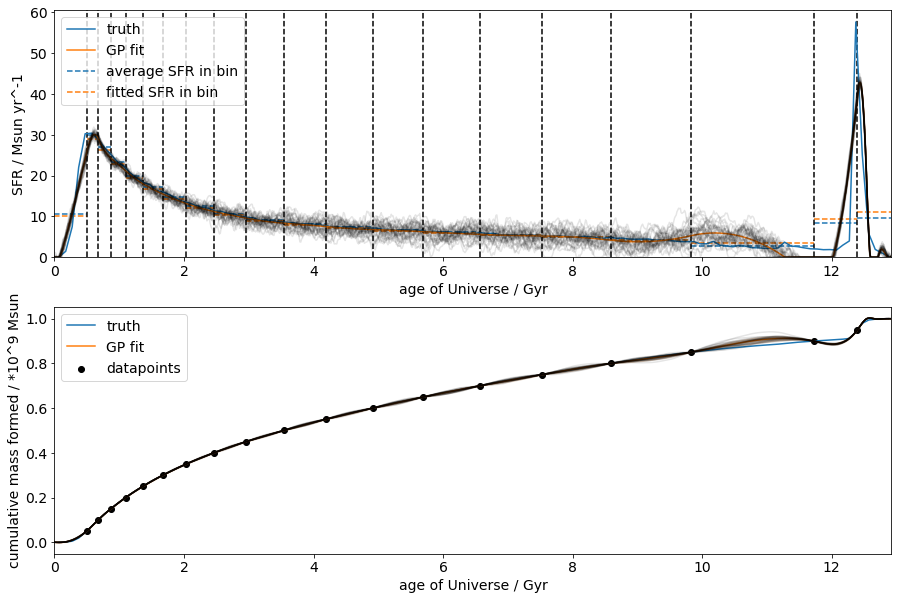

Iyer-only binning and fitting for 21 bins.
(binning) summed squared arror between averaged sfr and actual sfh = 342.7734709891277
(fitted) summed squared arror between averaged sfr and actual sfh = 353.09178465406535


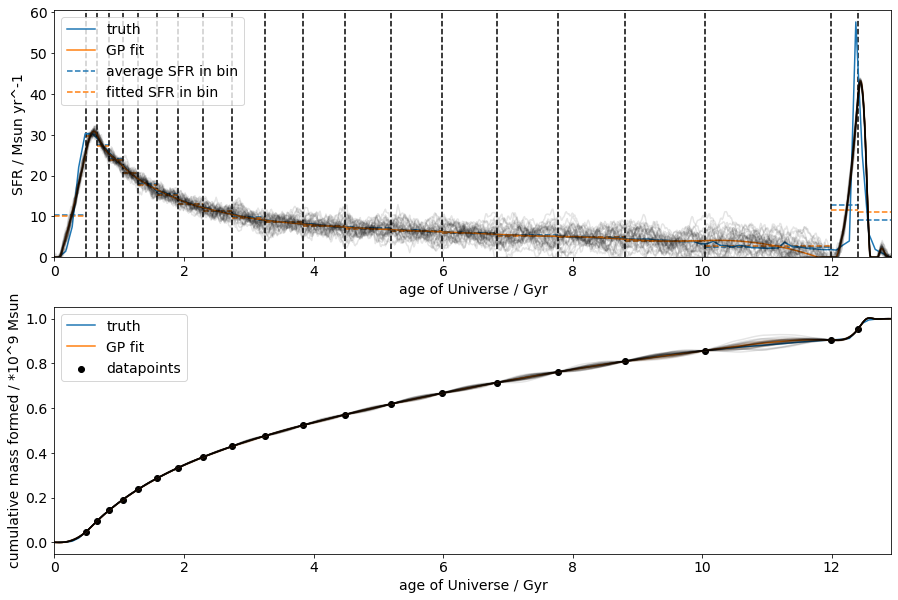

Iyer-only binning and fitting for 22 bins.
(binning) summed squared arror between averaged sfr and actual sfh = 265.7112396864937
(fitted) summed squared arror between averaged sfr and actual sfh = 280.1221271904973


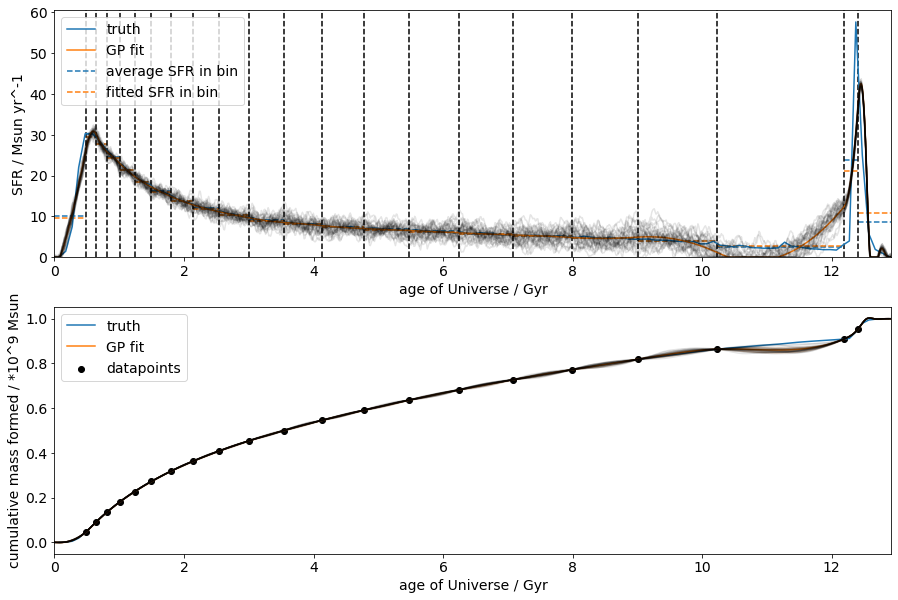

Iyer-only binning and fitting for 23 bins.
(binning) summed squared arror between averaged sfr and actual sfh = 153.20399898697434
(fitted) summed squared arror between averaged sfr and actual sfh = 198.18613582854033


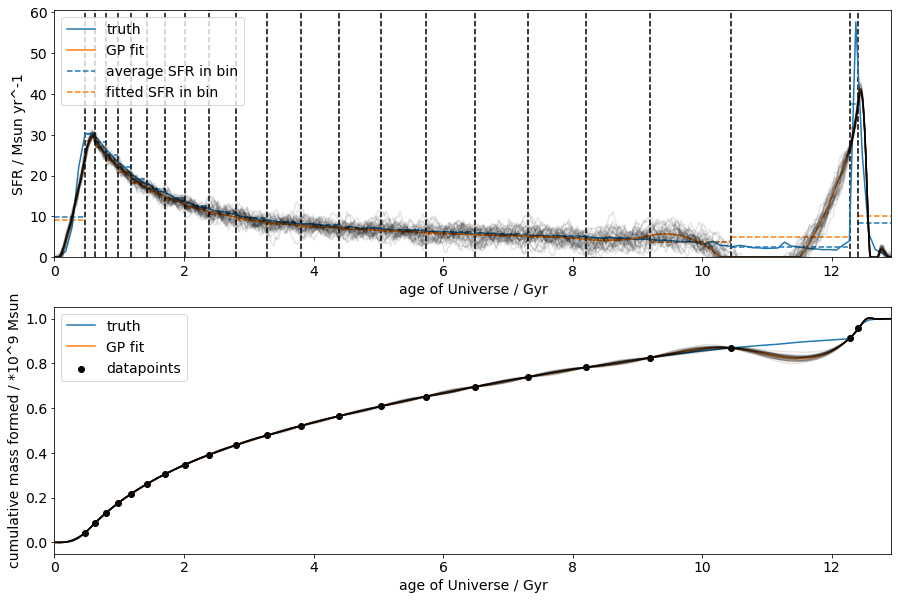

Iyer-only binning and fitting for 24 bins.
(binning) summed squared arror between averaged sfr and actual sfh = 99.4366183842666
(fitted) summed squared arror between averaged sfr and actual sfh = 151.91205826074057


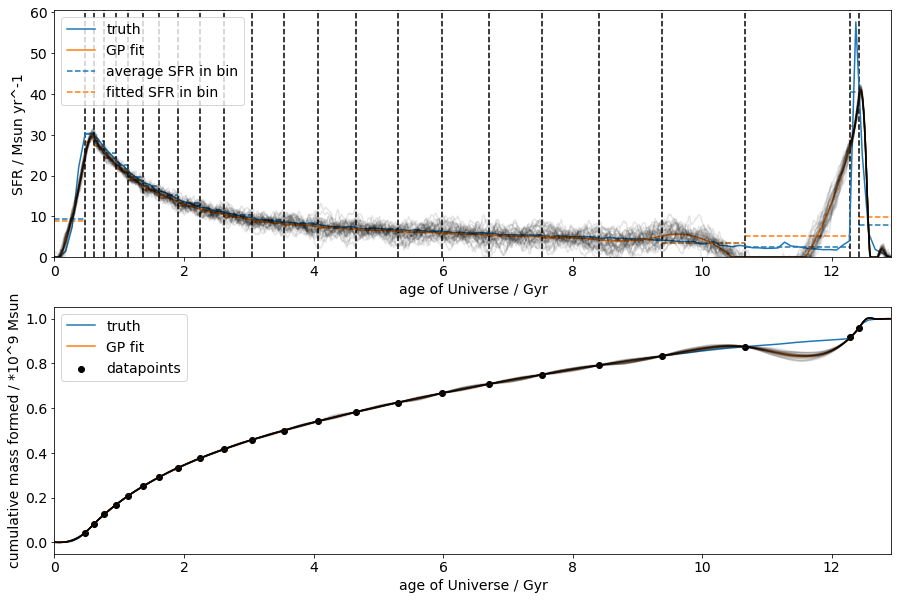

In [163]:
iyer_errs = []
for i in np.arange(2,25):
    iyer_errs.append(do_iyer_fitting(i))
iyer_errs = np.array(iyer_errs).T

### log time only binning from 2 to 24 bins

Log-time-only binning and fitting for 2 bins.
(binning) summed squared arror between averaged sfr and actual sfh = 751.53707612739
(fitted) summed squared arror between averaged sfr and actual sfh = 751.6097712535491


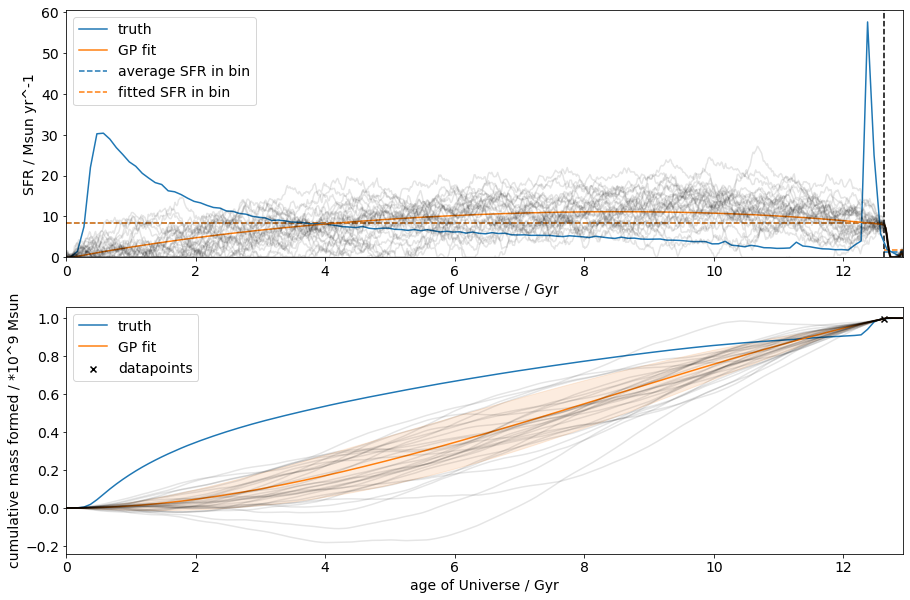

Log-time-only binning and fitting for 3 bins.
(binning) summed squared arror between averaged sfr and actual sfh = 748.777433657473
(fitted) summed squared arror between averaged sfr and actual sfh = 748.8538333225979


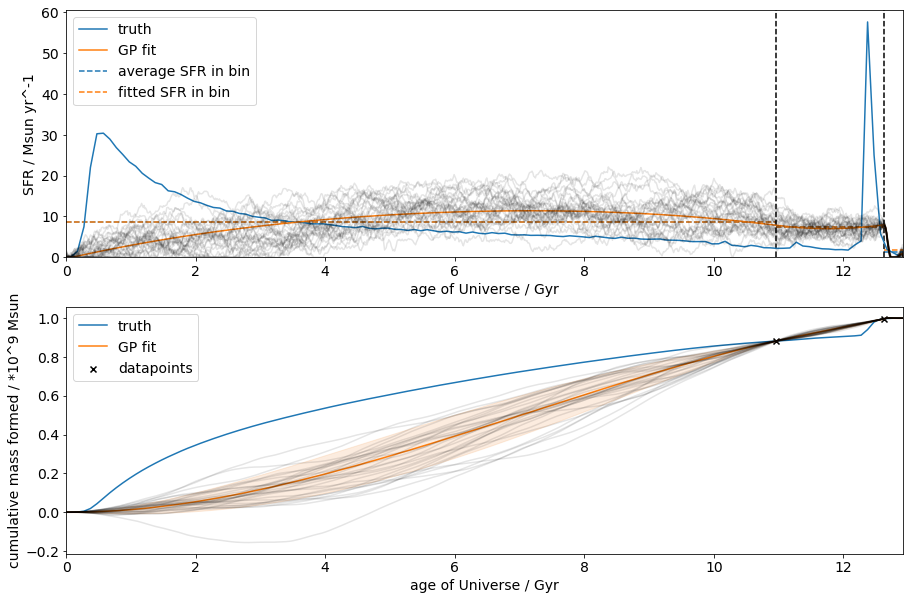

Log-time-only binning and fitting for 4 bins.
(binning) summed squared arror between averaged sfr and actual sfh = 649.9636945611986
(fitted) summed squared arror between averaged sfr and actual sfh = 650.063649401905


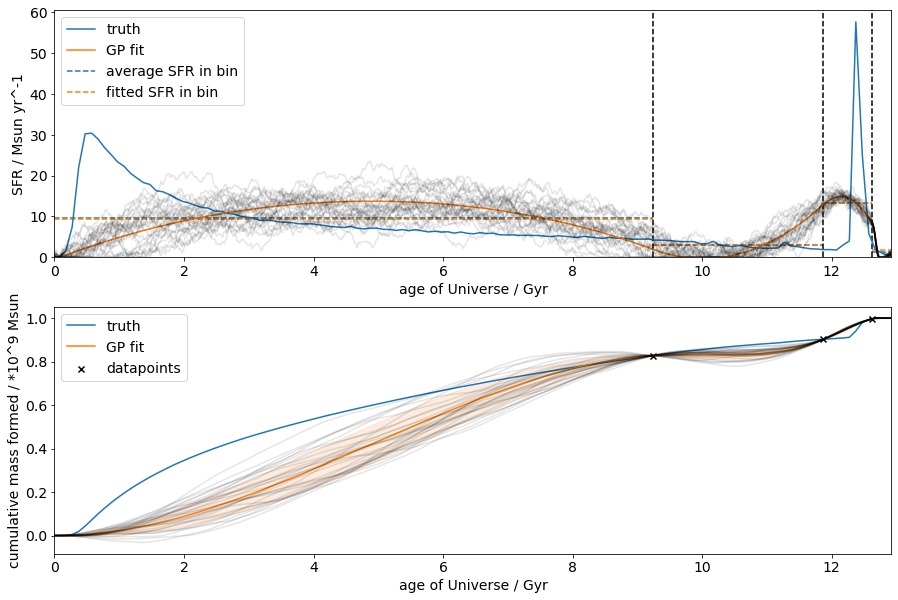

Log-time-only binning and fitting for 5 bins.
(binning) summed squared arror between averaged sfr and actual sfh = 559.0650687953369
(fitted) summed squared arror between averaged sfr and actual sfh = 563.7403568958882


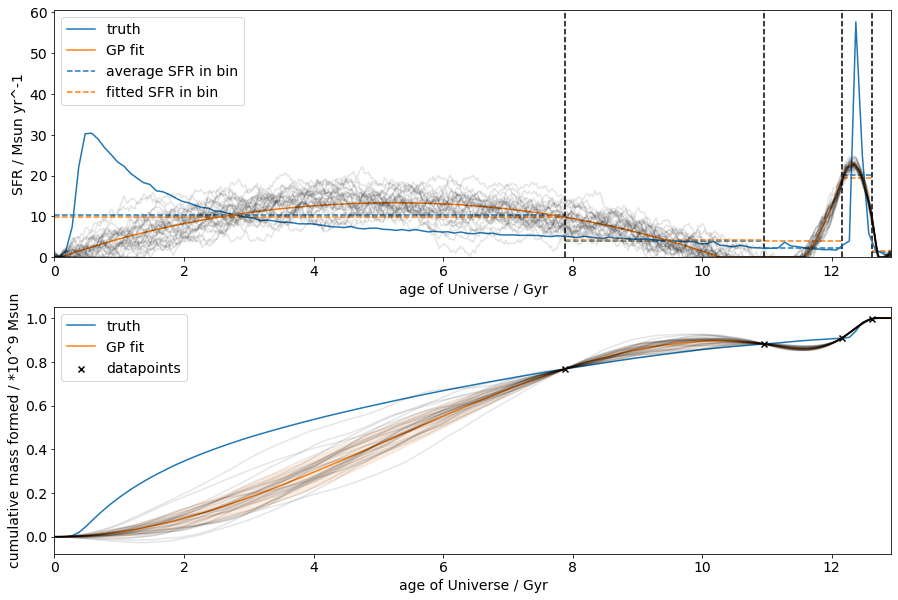

Log-time-only binning and fitting for 6 bins.
(binning) summed squared arror between averaged sfr and actual sfh = 446.478080508885
(fitted) summed squared arror between averaged sfr and actual sfh = 453.8235510578067


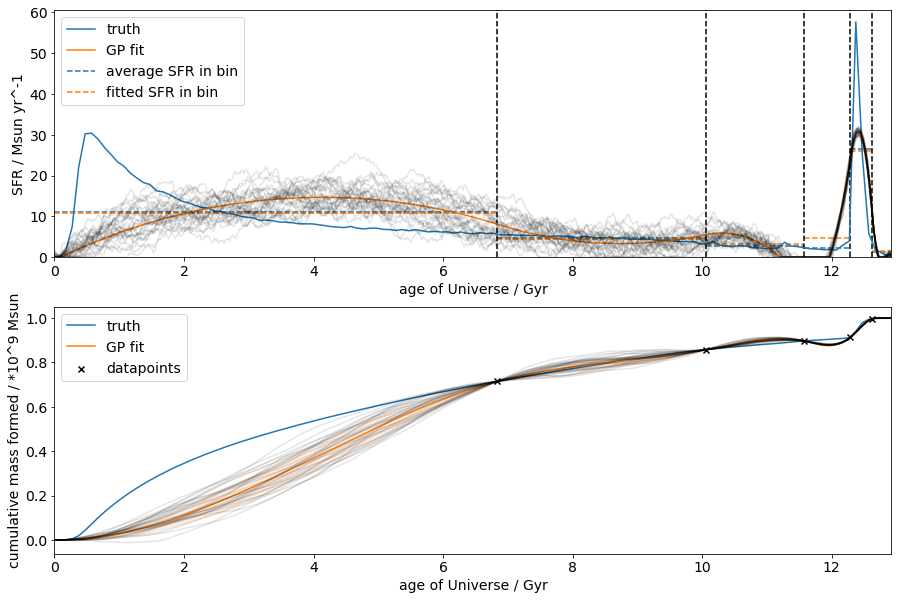

Log-time-only binning and fitting for 7 bins.
(binning) summed squared arror between averaged sfr and actual sfh = 434.5996643507446
(fitted) summed squared arror between averaged sfr and actual sfh = 433.34018757471006


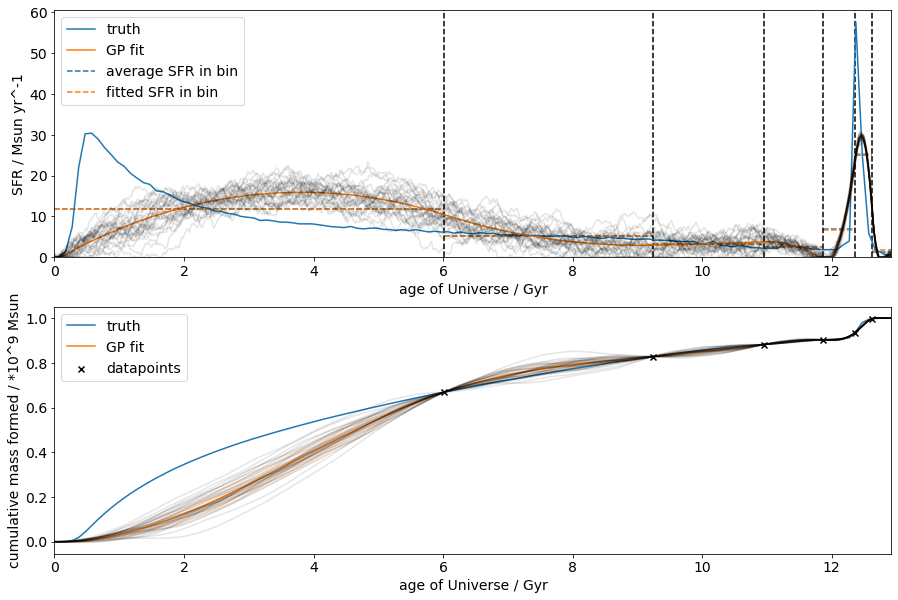

Log-time-only binning and fitting for 8 bins.
(binning) summed squared arror between averaged sfr and actual sfh = 507.03473951341465
(fitted) summed squared arror between averaged sfr and actual sfh = 507.8373499610933


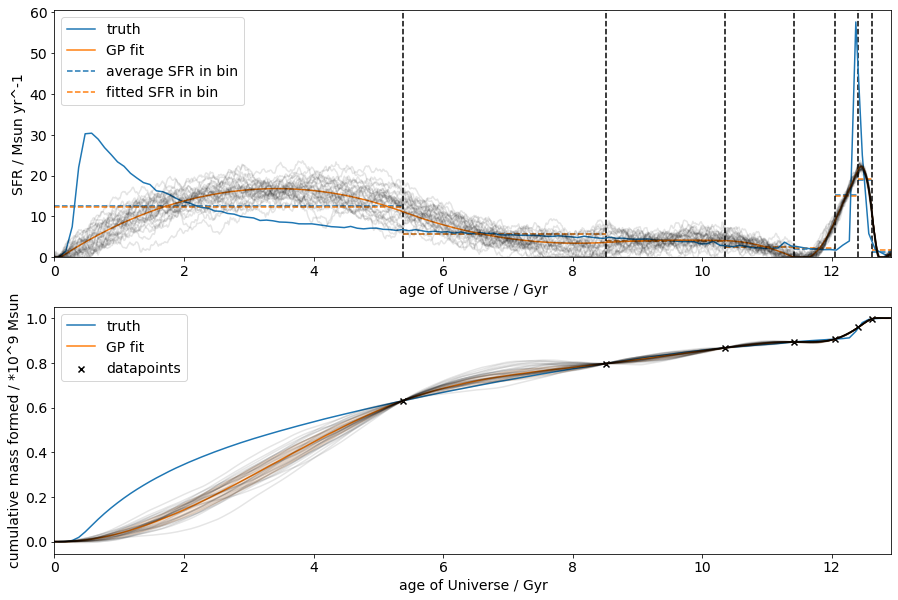

Log-time-only binning and fitting for 9 bins.
(binning) summed squared arror between averaged sfr and actual sfh = 454.1821831639989
(fitted) summed squared arror between averaged sfr and actual sfh = 454.9292795970485


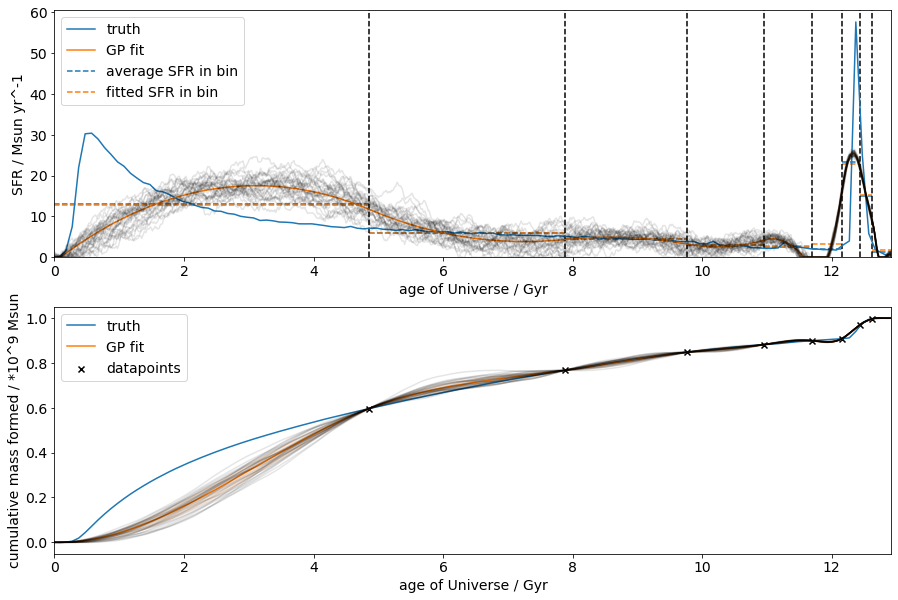

Log-time-only binning and fitting for 10 bins.
(binning) summed squared arror between averaged sfr and actual sfh = 387.2538211738193
(fitted) summed squared arror between averaged sfr and actual sfh = 389.0207484338315


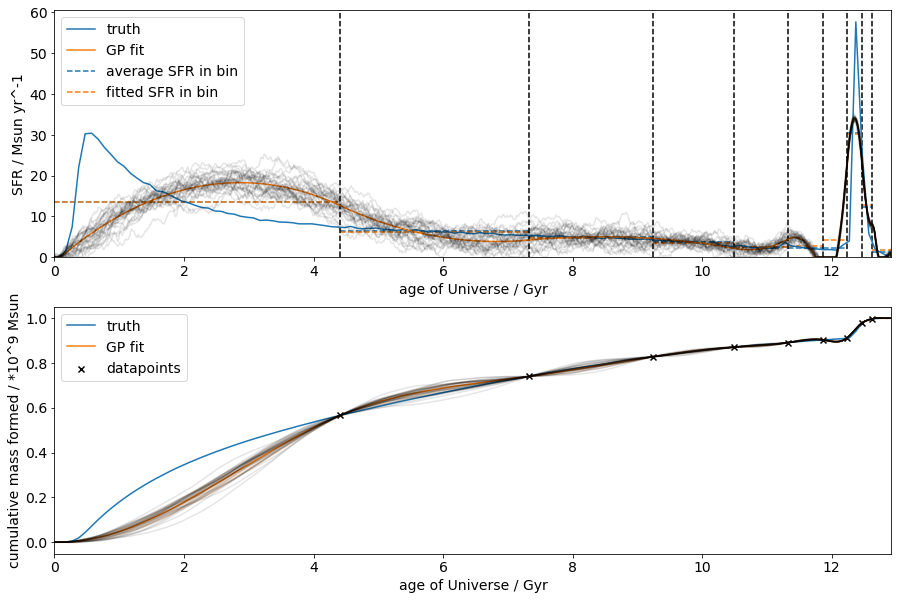

Log-time-only binning and fitting for 11 bins.
(binning) summed squared arror between averaged sfr and actual sfh = 265.3154354120283
(fitted) summed squared arror between averaged sfr and actual sfh = 269.29847924505805


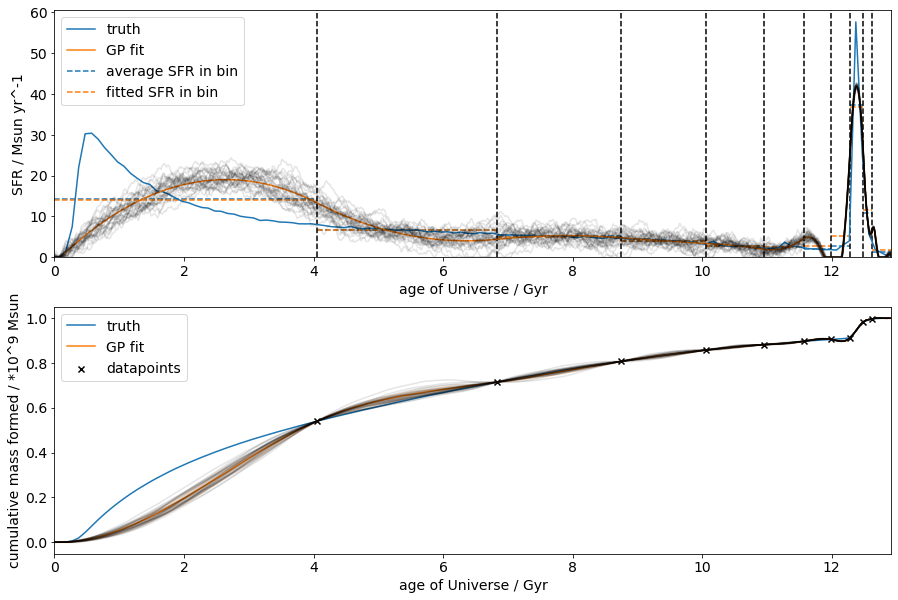

Log-time-only binning and fitting for 12 bins.
(binning) summed squared arror between averaged sfr and actual sfh = 250.70379085937765
(fitted) summed squared arror between averaged sfr and actual sfh = 252.61607308577985


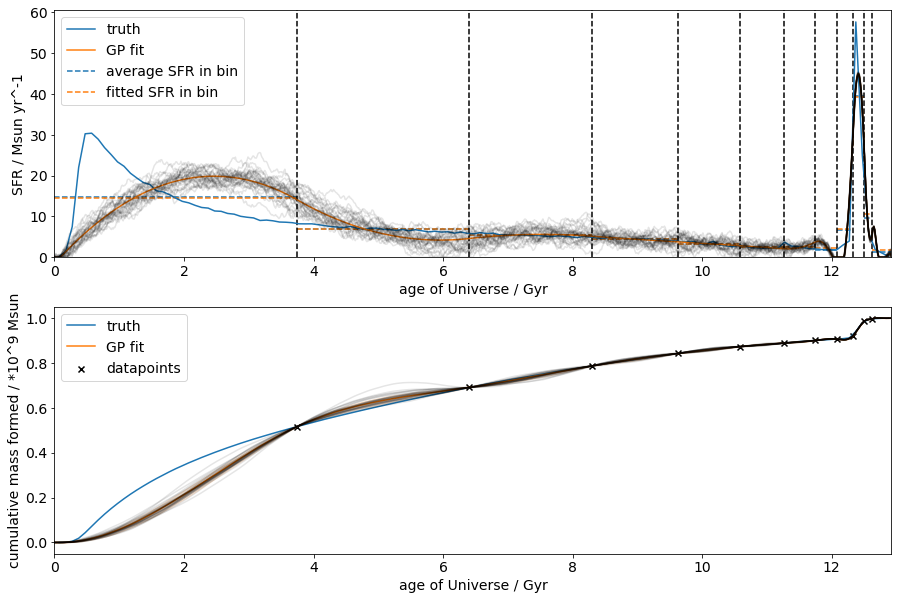

Log-time-only binning and fitting for 13 bins.
(binning) summed squared arror between averaged sfr and actual sfh = 262.9354434029433
(fitted) summed squared arror between averaged sfr and actual sfh = 259.745101652954


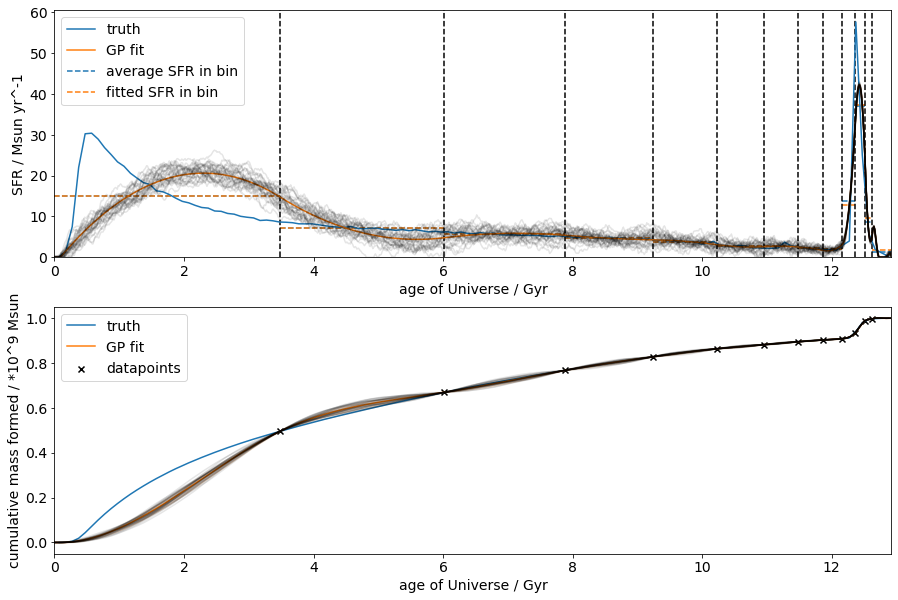

Log-time-only binning and fitting for 14 bins.
(binning) summed squared arror between averaged sfr and actual sfh = 332.8398119593244
(fitted) summed squared arror between averaged sfr and actual sfh = 337.3179347669179


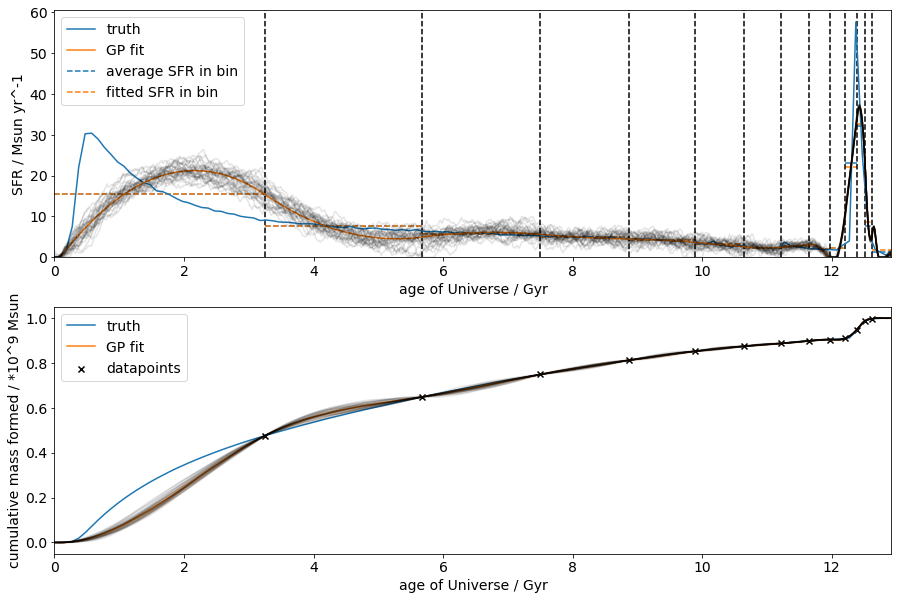

Log-time-only binning and fitting for 15 bins.
(binning) summed squared arror between averaged sfr and actual sfh = 307.34635487633363
(fitted) summed squared arror between averaged sfr and actual sfh = 308.6018421944999


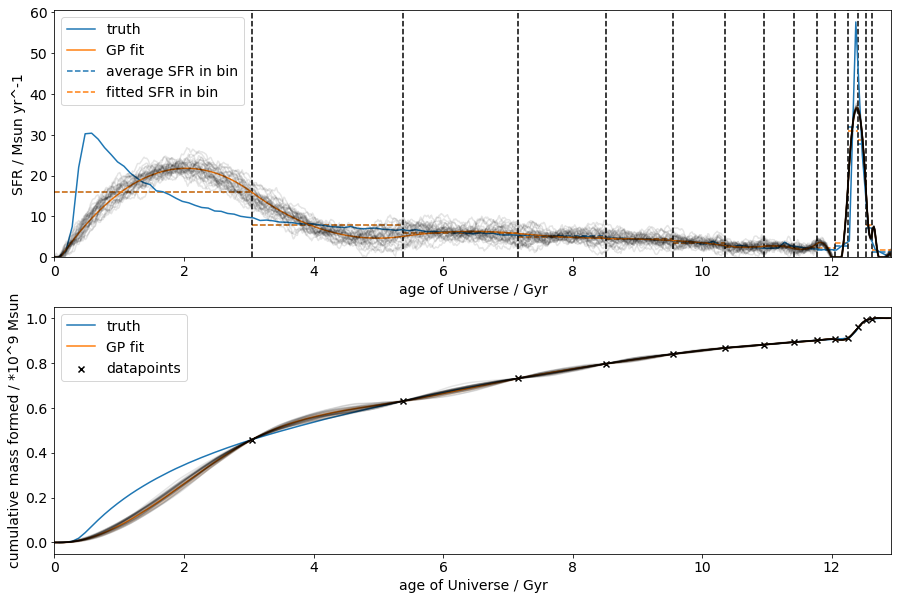

Log-time-only binning and fitting for 16 bins.
(binning) summed squared arror between averaged sfr and actual sfh = 184.88637381283792
(fitted) summed squared arror between averaged sfr and actual sfh = 189.32125028803304


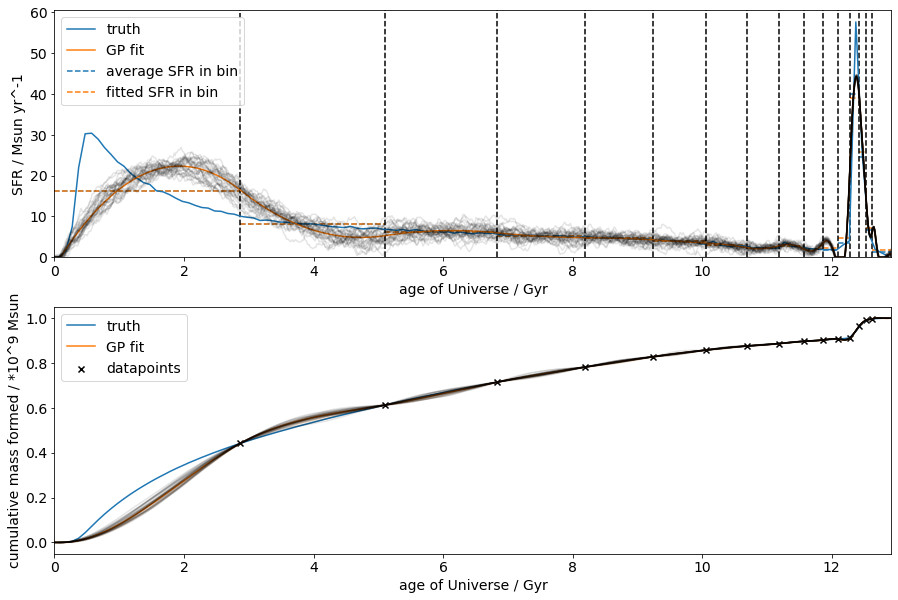

Log-time-only binning and fitting for 17 bins.
(binning) summed squared arror between averaged sfr and actual sfh = 169.6186163850908
(fitted) summed squared arror between averaged sfr and actual sfh = 171.14132439124643


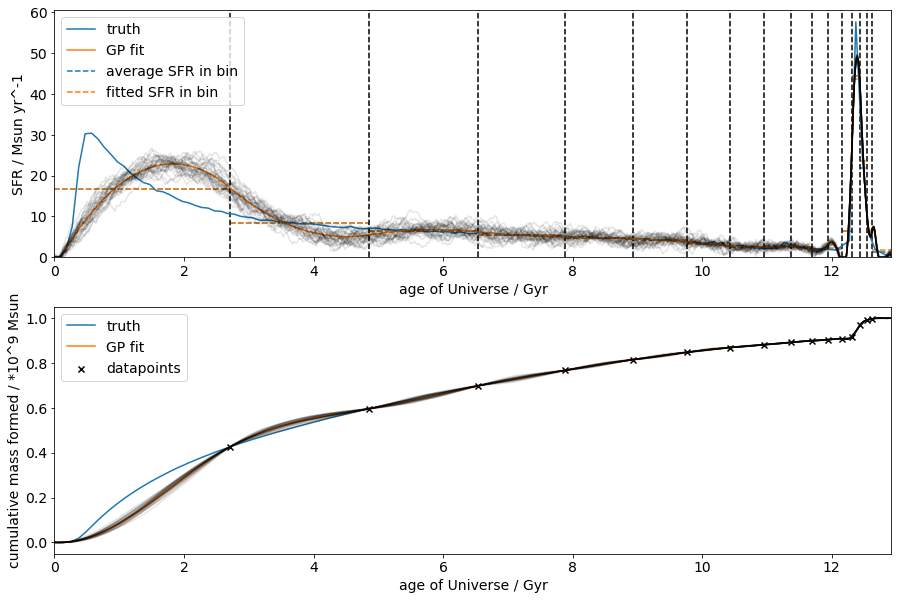

Log-time-only binning and fitting for 18 bins.
(binning) summed squared arror between averaged sfr and actual sfh = 166.3978166053053
(fitted) summed squared arror between averaged sfr and actual sfh = 163.81840035976876


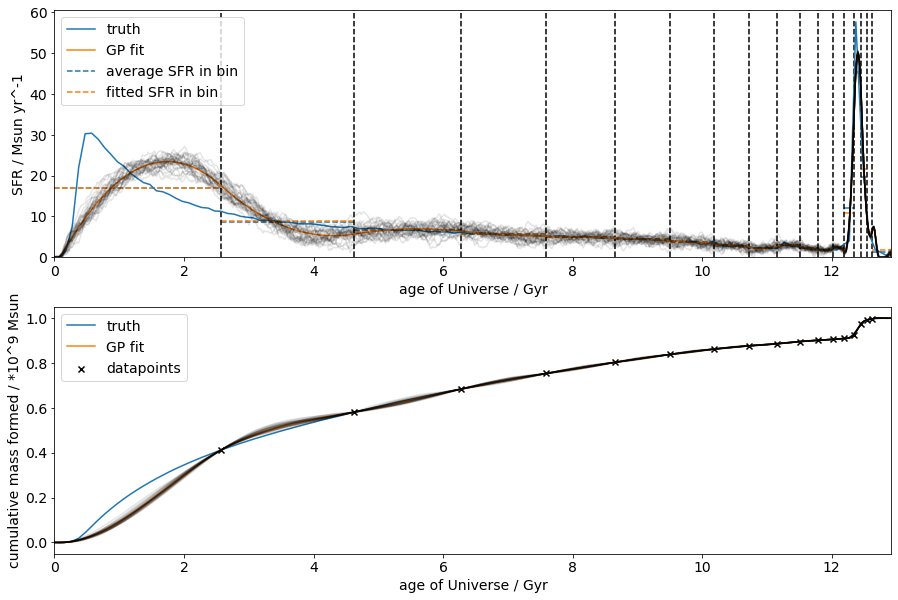

Log-time-only binning and fitting for 19 bins.
(binning) summed squared arror between averaged sfr and actual sfh = 188.15355664477488
(fitted) summed squared arror between averaged sfr and actual sfh = 181.49861385357866


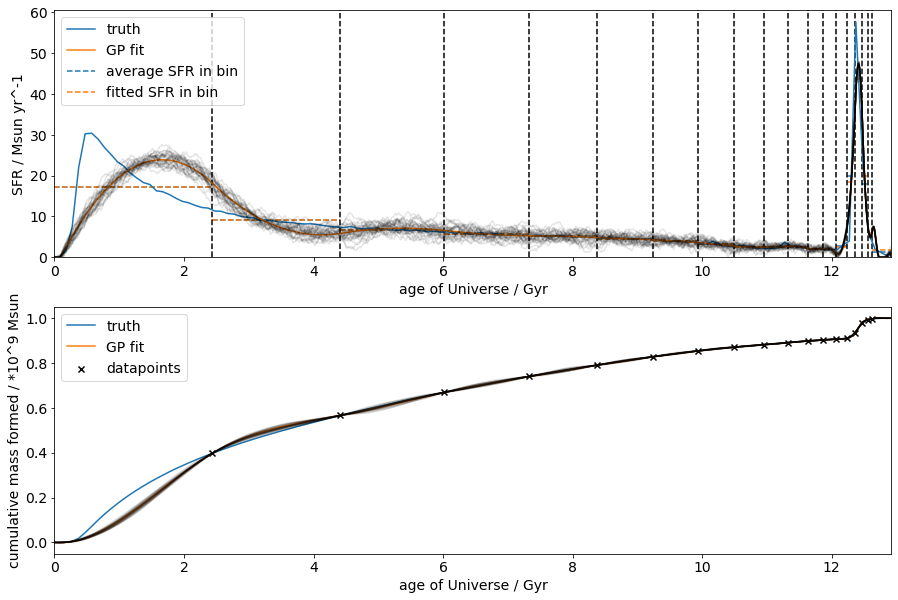

Log-time-only binning and fitting for 20 bins.
(binning) summed squared arror between averaged sfr and actual sfh = 299.92766729208
(fitted) summed squared arror between averaged sfr and actual sfh = 302.9017702627506


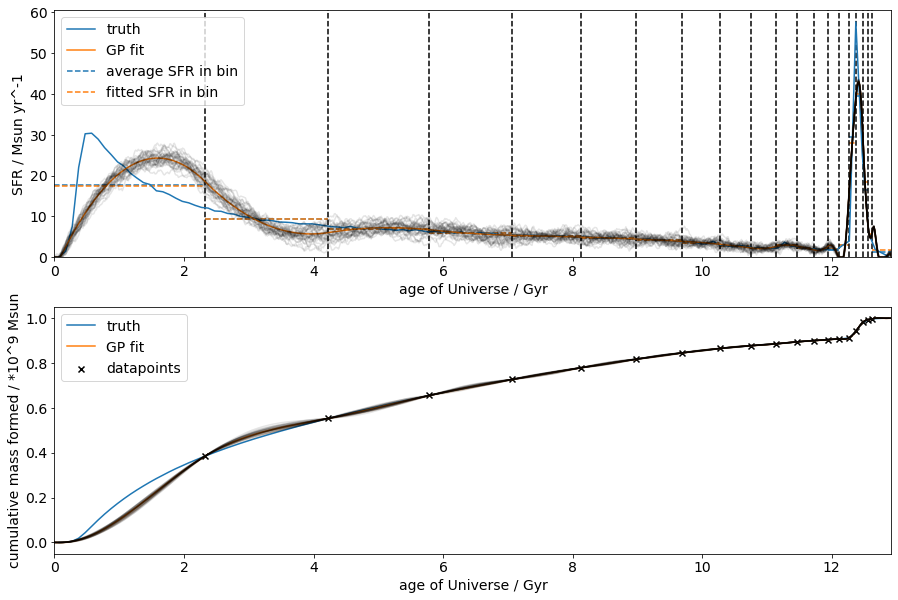

Log-time-only binning and fitting for 21 bins.
(binning) summed squared arror between averaged sfr and actual sfh = 179.3460673372607
(fitted) summed squared arror between averaged sfr and actual sfh = 188.39183880986184


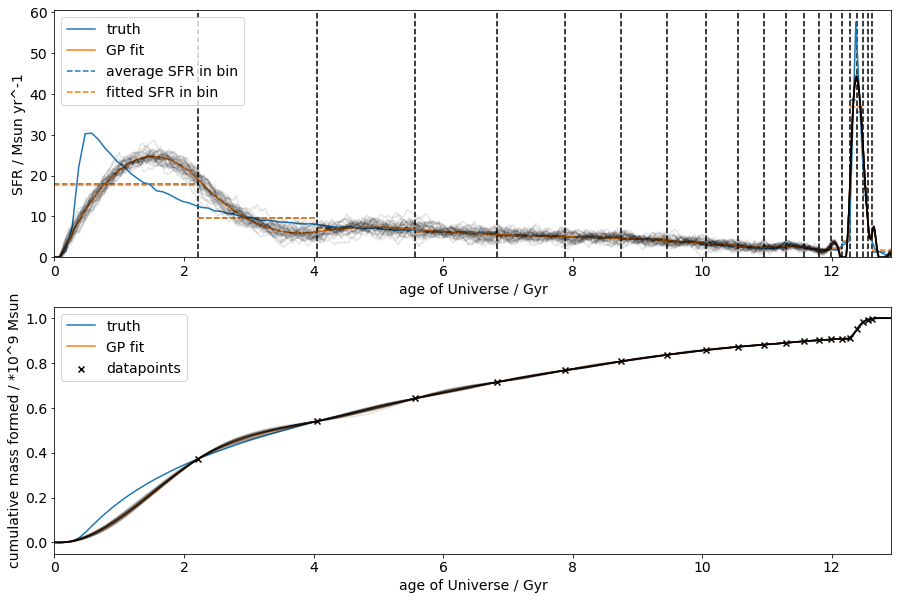

Log-time-only binning and fitting for 22 bins.
(binning) summed squared arror between averaged sfr and actual sfh = 151.44905508543332
(fitted) summed squared arror between averaged sfr and actual sfh = 158.16611381475997


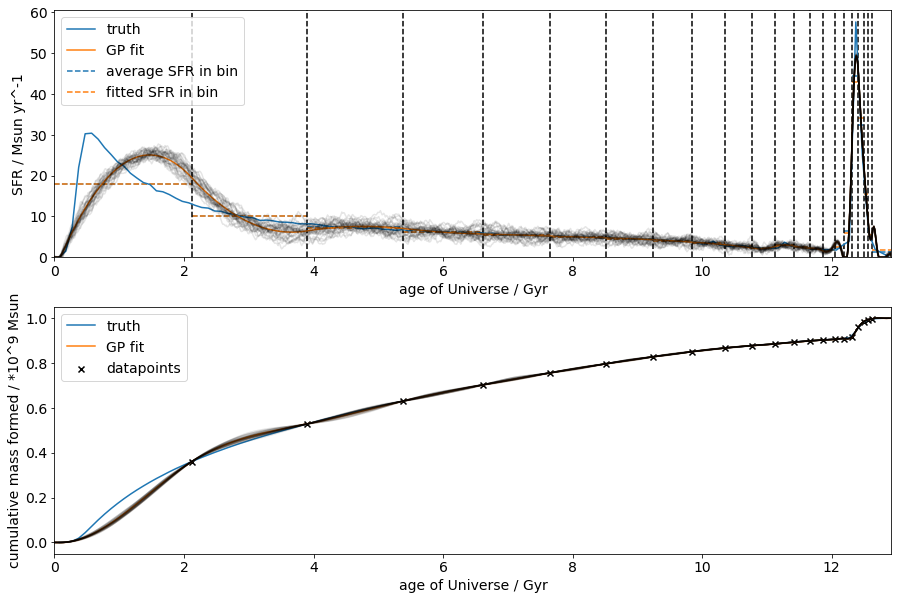

Log-time-only binning and fitting for 23 bins.
(binning) summed squared arror between averaged sfr and actual sfh = 142.50239114637165
(fitted) summed squared arror between averaged sfr and actual sfh = 145.26622913419908


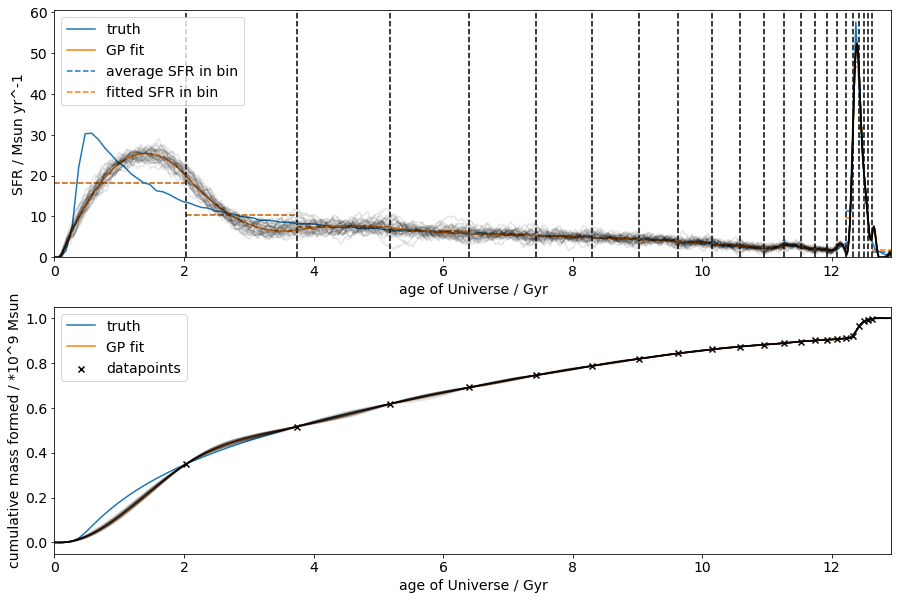

Log-time-only binning and fitting for 24 bins.
(binning) summed squared arror between averaged sfr and actual sfh = 150.83024488657583
(fitted) summed squared arror between averaged sfr and actual sfh = 149.00603551957815


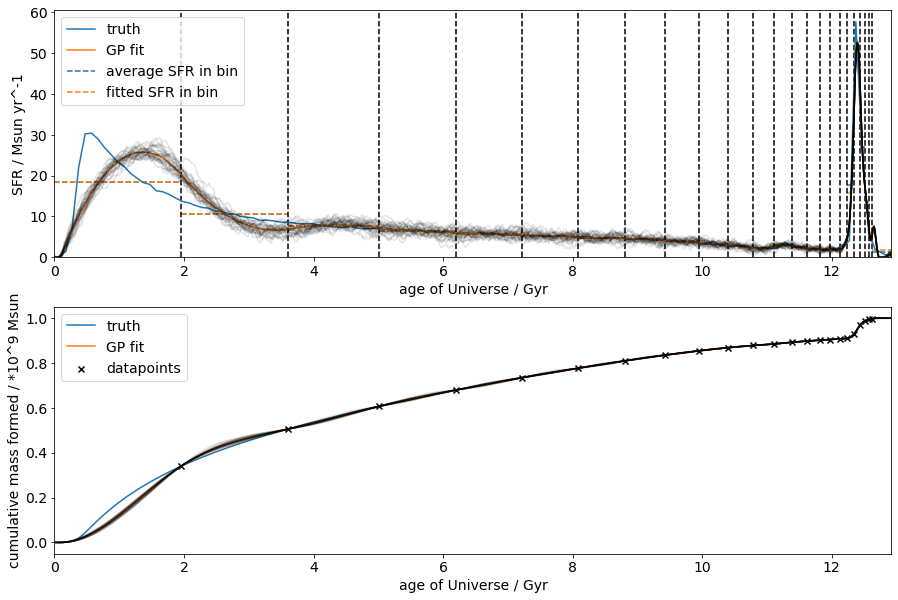

In [164]:
lt_errs = []
for i in np.arange(2,25):
    lt_errs.append(do_lt_fitting(i))
lt_errs = np.array(lt_errs).T

### iyer then log time binning from a total of 3 to 24 bins
There are many combinations to mix and match the number of bins in each method here. I chose to do two demonstrations: <br>
1. going from 3 to 24 total bins but keeping the number of bins in each scheme roughly equal (when odd number, I give Iyer one more bin)
2. fixing total Nbins at 10, but going from 2 to 9 Iyer bins

Iyer-then-log-time binning and fitting for 2 and then 2 bins.
(binning) summed squared arror between averaged sfr and actual sfh = 524.0526264087683
(fitted) summed squared arror between averaged sfr and actual sfh = 524.2242599617551


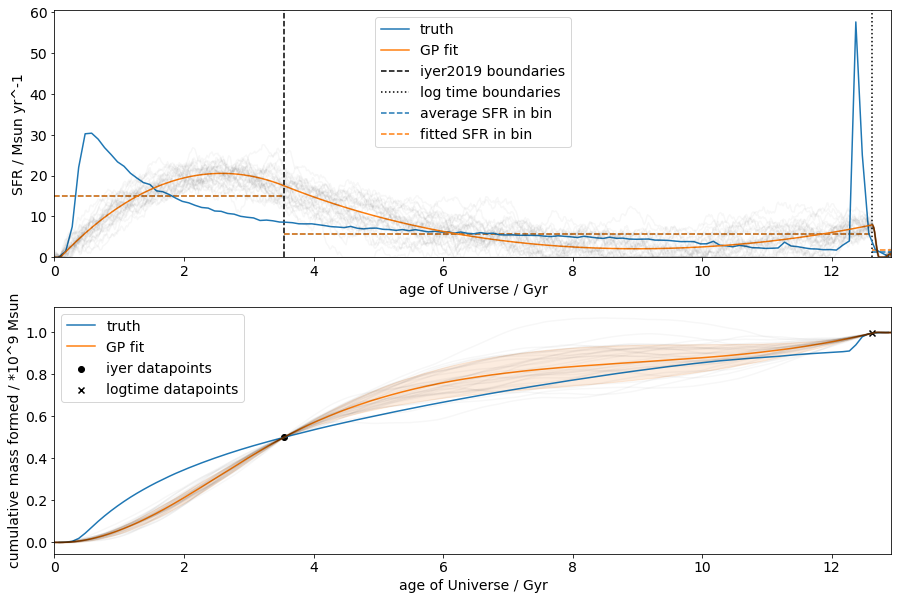

Iyer-then-log-time binning and fitting for 3 and then 2 bins.
(binning) summed squared arror between averaged sfr and actual sfh = 468.5749113094028
(fitted) summed squared arror between averaged sfr and actual sfh = 468.9004611269599


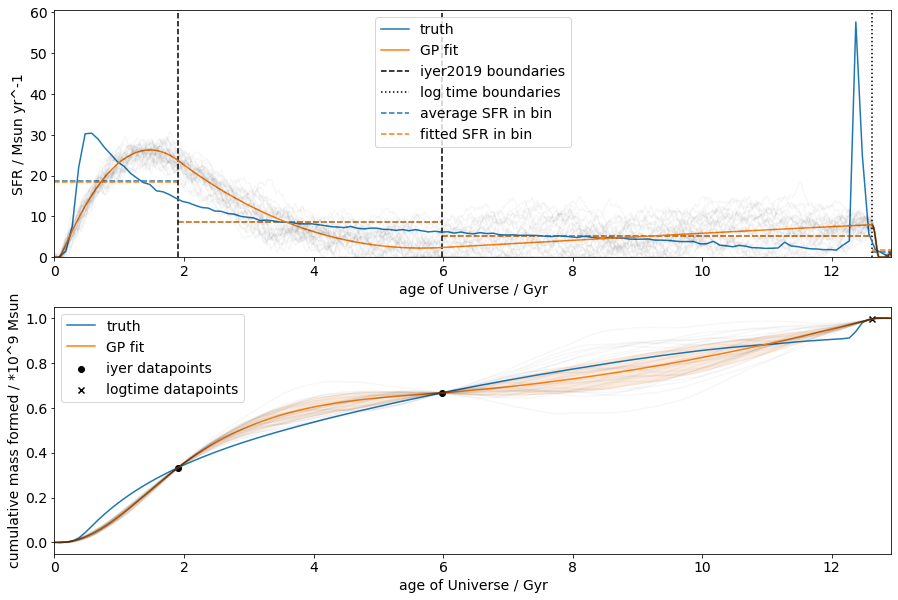

Iyer-then-log-time binning and fitting for 3 and then 3 bins.
(binning) summed squared arror between averaged sfr and actual sfh = 442.0231515822042
(fitted) summed squared arror between averaged sfr and actual sfh = 442.3492842252525


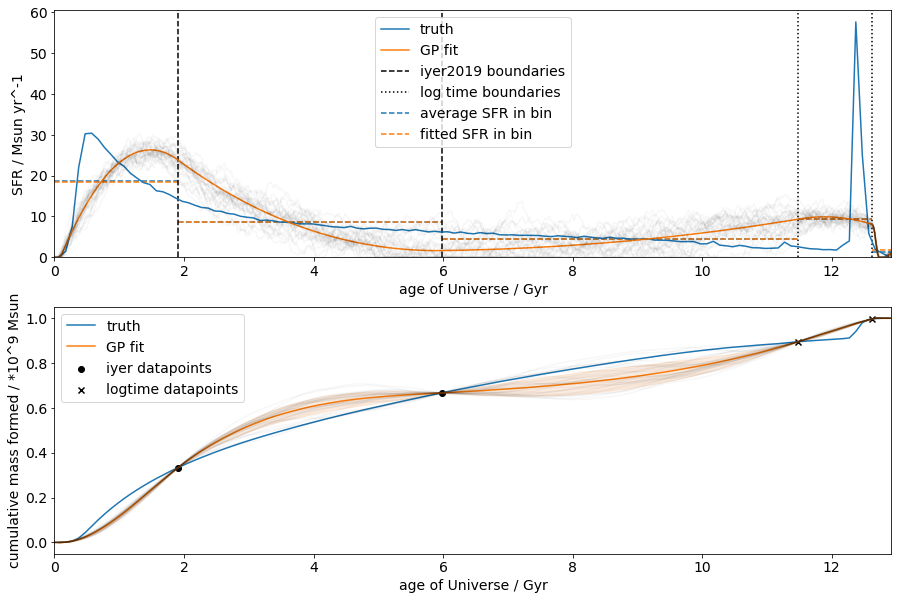

Iyer-then-log-time binning and fitting for 4 and then 3 bins.
(binning) summed squared arror between averaged sfr and actual sfh = 429.0692569588786
(fitted) summed squared arror between averaged sfr and actual sfh = 429.4621941890597


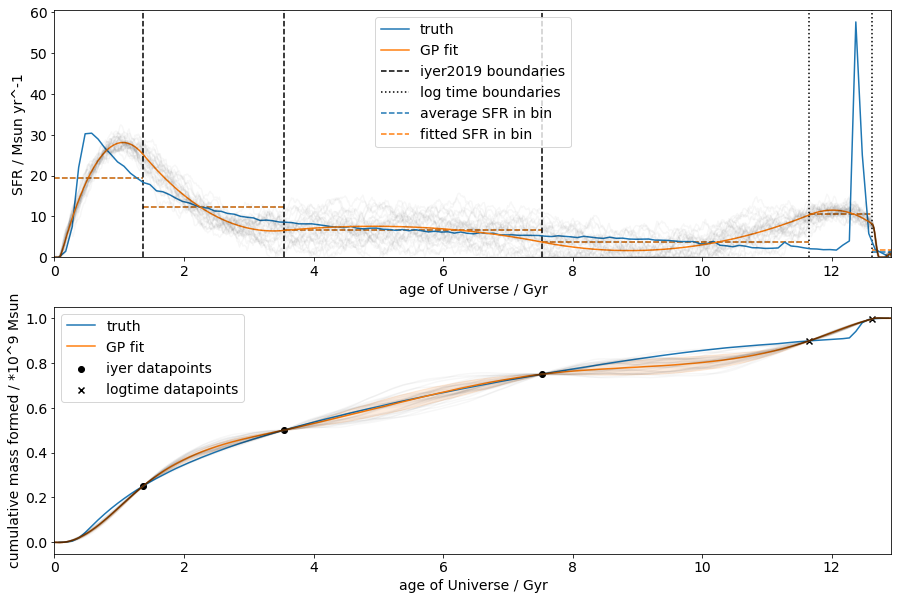

Iyer-then-log-time binning and fitting for 4 and then 4 bins.
(binning) summed squared arror between averaged sfr and actual sfh = 353.76720030269144
(fitted) summed squared arror between averaged sfr and actual sfh = 359.95085984605197


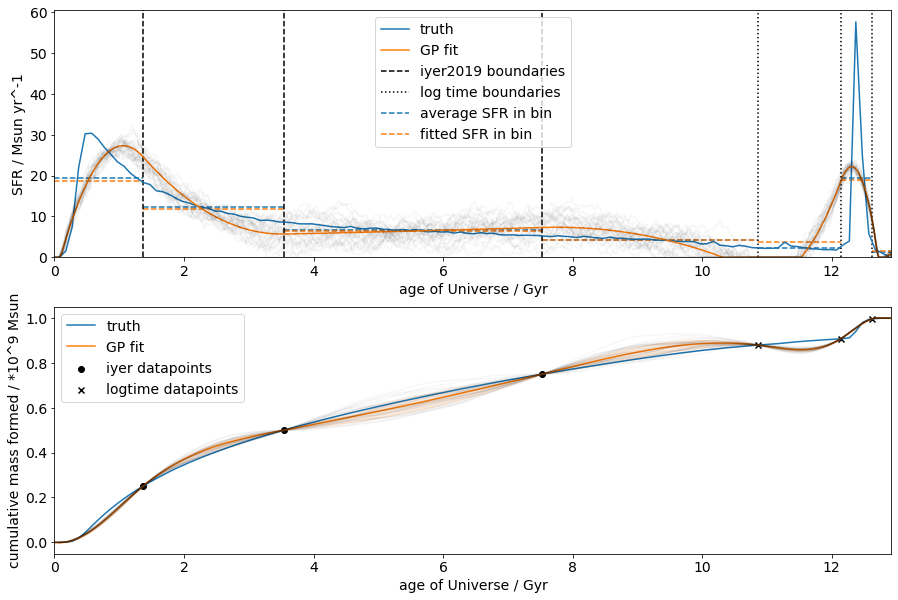

Iyer-then-log-time binning and fitting for 5 and then 4 bins.
(binning) summed squared arror between averaged sfr and actual sfh = 315.05421851632923
(fitted) summed squared arror between averaged sfr and actual sfh = 322.4265030317717


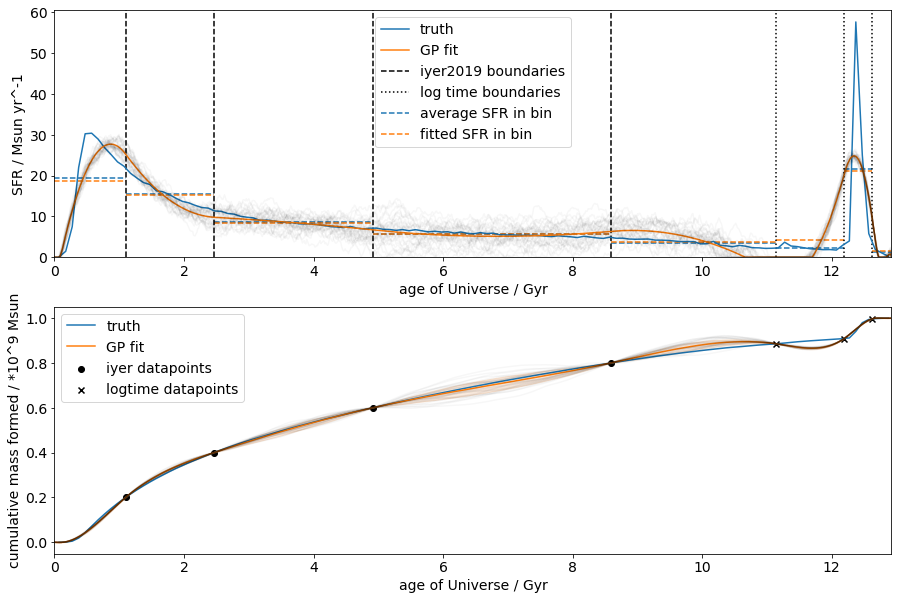

Iyer-then-log-time binning and fitting for 5 and then 5 bins.
(binning) summed squared arror between averaged sfr and actual sfh = 269.21002952563015
(fitted) summed squared arror between averaged sfr and actual sfh = 273.44295299943144


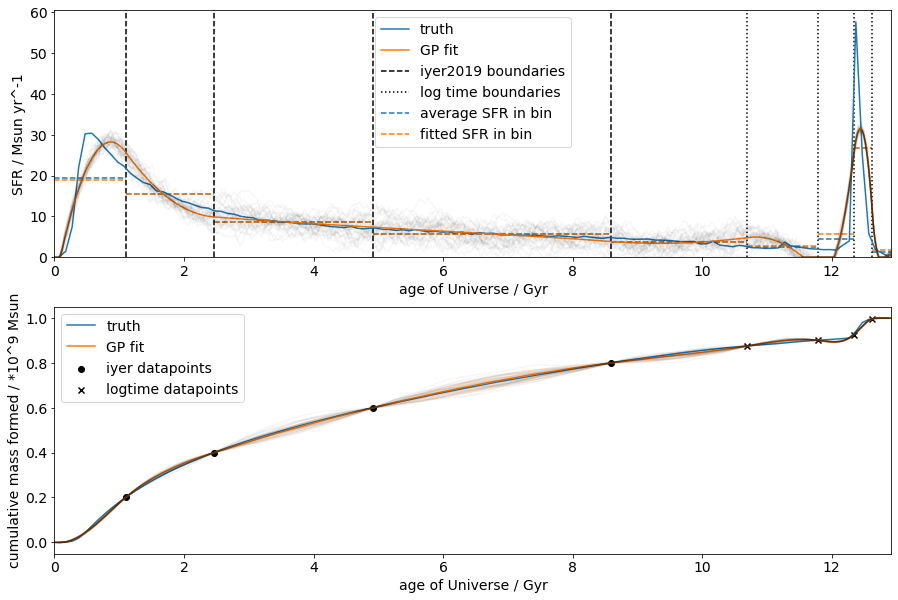

Iyer-then-log-time binning and fitting for 6 and then 5 bins.
(binning) summed squared arror between averaged sfr and actual sfh = 279.9333481481393
(fitted) summed squared arror between averaged sfr and actual sfh = 278.3605605672043


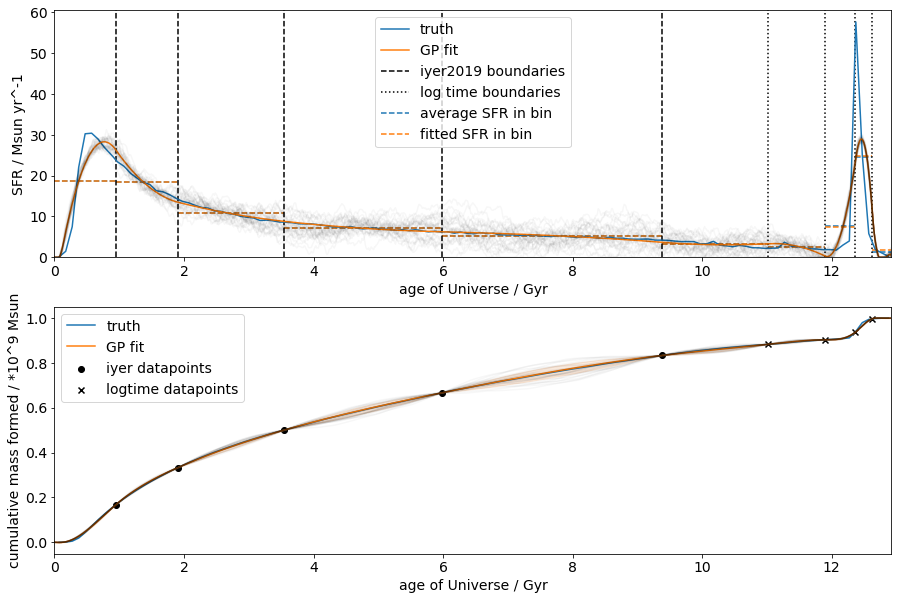

Iyer-then-log-time binning and fitting for 6 and then 6 bins.
(binning) summed squared arror between averaged sfr and actual sfh = 338.84857262003925
(fitted) summed squared arror between averaged sfr and actual sfh = 340.3410681754789


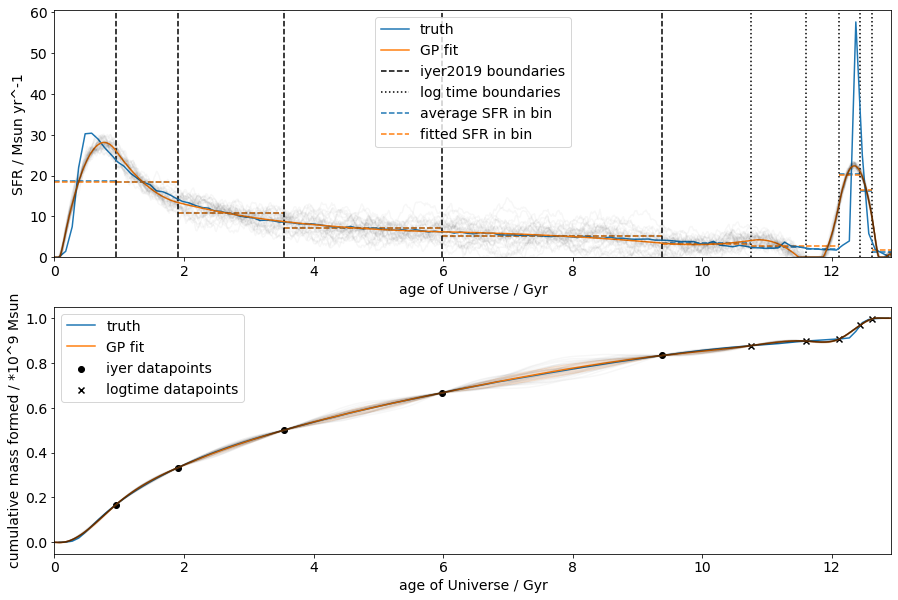

Iyer-then-log-time binning and fitting for 7 and then 6 bins.
(binning) summed squared arror between averaged sfr and actual sfh = 287.9176520759141
(fitted) summed squared arror between averaged sfr and actual sfh = 290.37407544885855


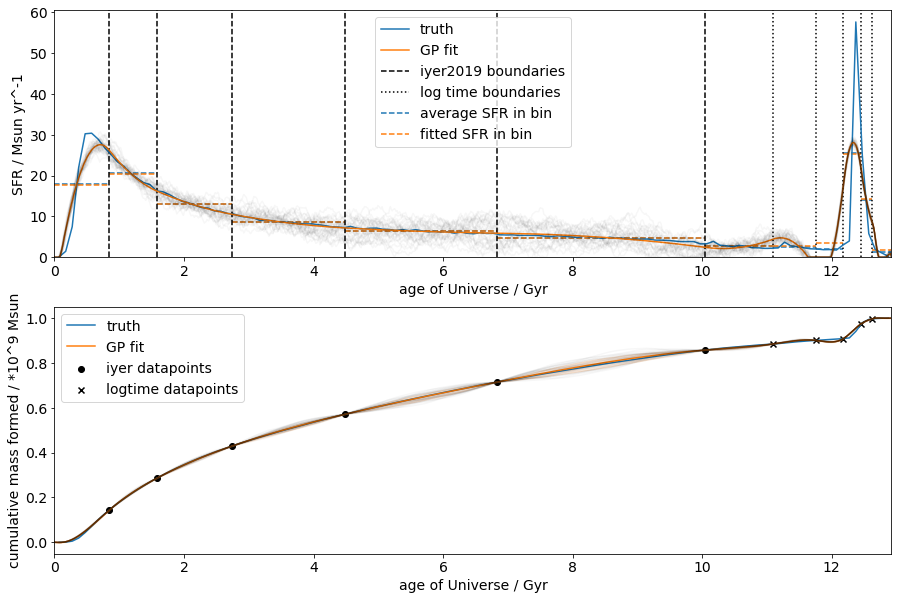

Iyer-then-log-time binning and fitting for 7 and then 7 bins.
(binning) summed squared arror between averaged sfr and actual sfh = 178.93643268916287
(fitted) summed squared arror between averaged sfr and actual sfh = 183.28171298485967


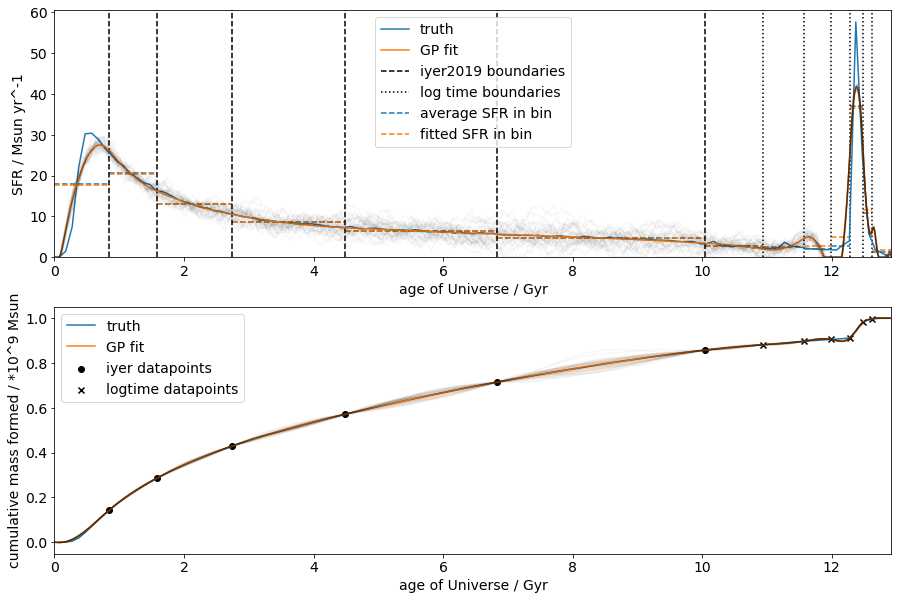

Iyer-then-log-time binning and fitting for 8 and then 7 bins.
(binning) summed squared arror between averaged sfr and actual sfh = 170.2065257723646
(fitted) summed squared arror between averaged sfr and actual sfh = 171.50797089648012


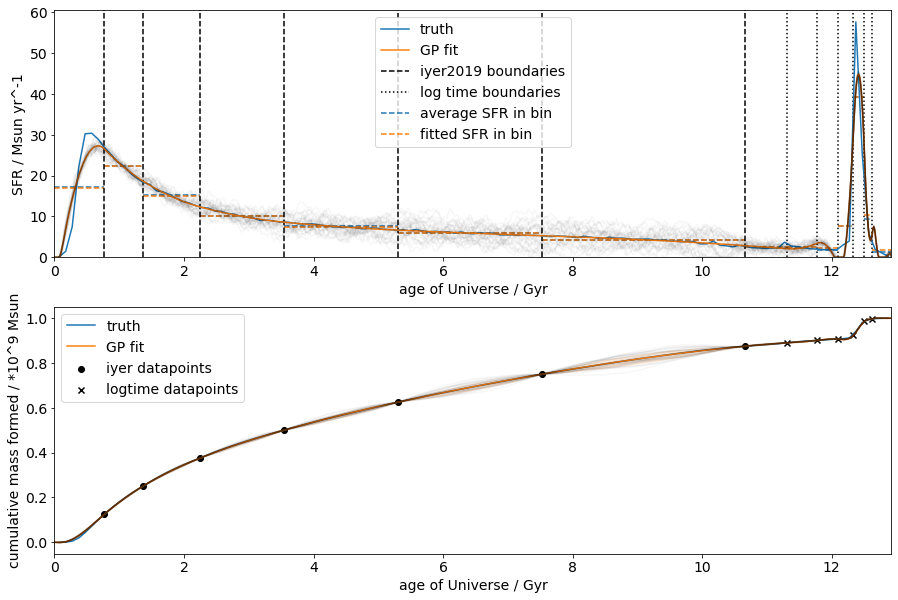

Iyer-then-log-time binning and fitting for 8 and then 8 bins.
(binning) summed squared arror between averaged sfr and actual sfh = 272.1098978846727
(fitted) summed squared arror between averaged sfr and actual sfh = 276.6231018820353


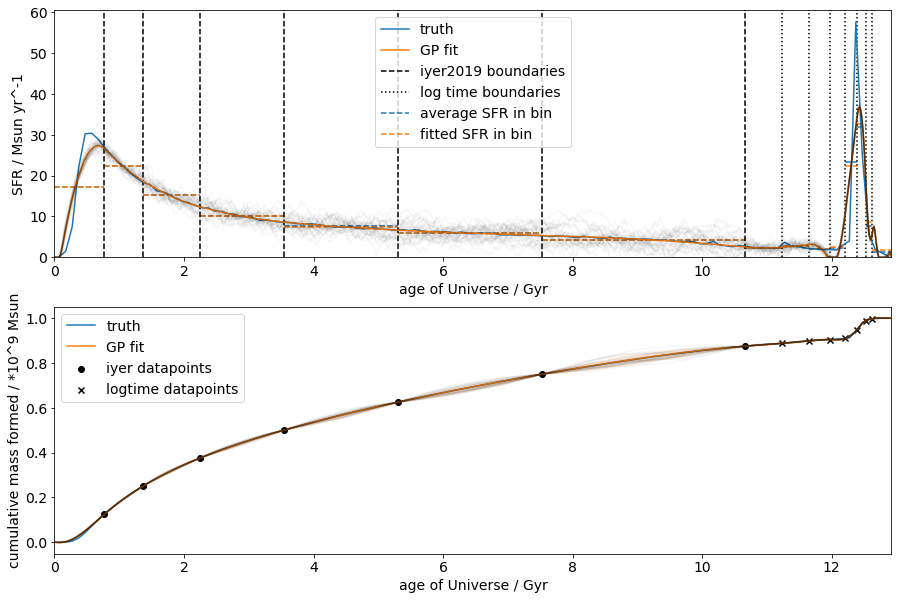

Iyer-then-log-time binning and fitting for 9 and then 8 bins.
(binning) summed squared arror between averaged sfr and actual sfh = 134.89400929338515
(fitted) summed squared arror between averaged sfr and actual sfh = 138.9026627911128


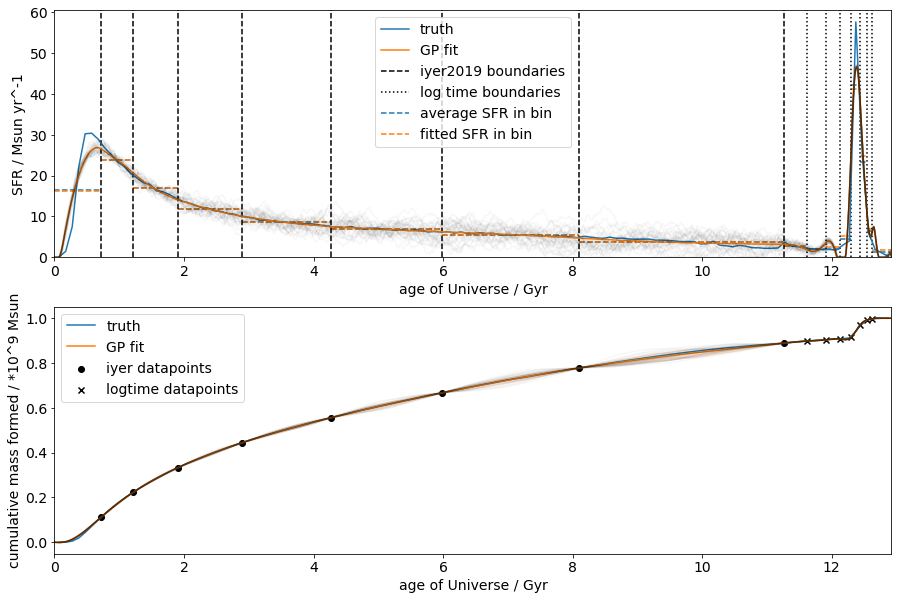

Iyer-then-log-time binning and fitting for 9 and then 9 bins.
(binning) summed squared arror between averaged sfr and actual sfh = 147.9339645916234
(fitted) summed squared arror between averaged sfr and actual sfh = 143.3981014189978


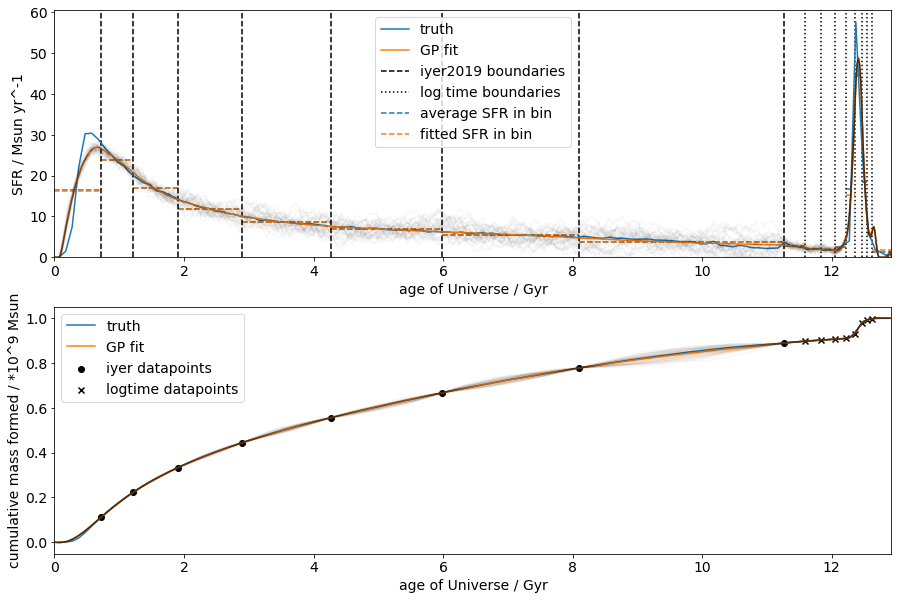

Iyer-then-log-time binning and fitting for 10 and then 9 bins.
(binning) summed squared arror between averaged sfr and actual sfh = 128.85965515861955
(fitted) summed squared arror between averaged sfr and actual sfh = 133.30030963067088


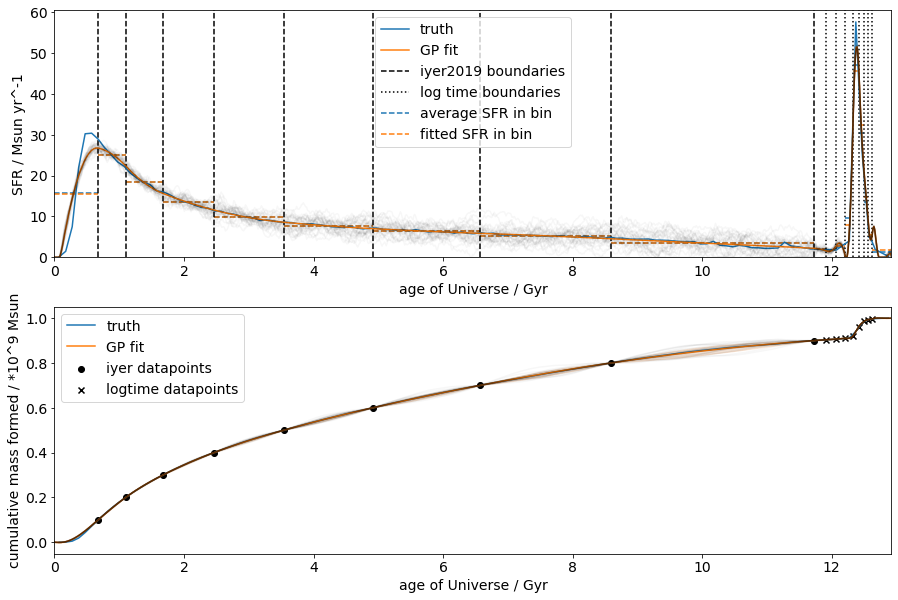

Iyer-then-log-time binning and fitting for 10 and then 10 bins.
(binning) summed squared arror between averaged sfr and actual sfh = 124.32834198351702
(fitted) summed squared arror between averaged sfr and actual sfh = 124.94059723907024


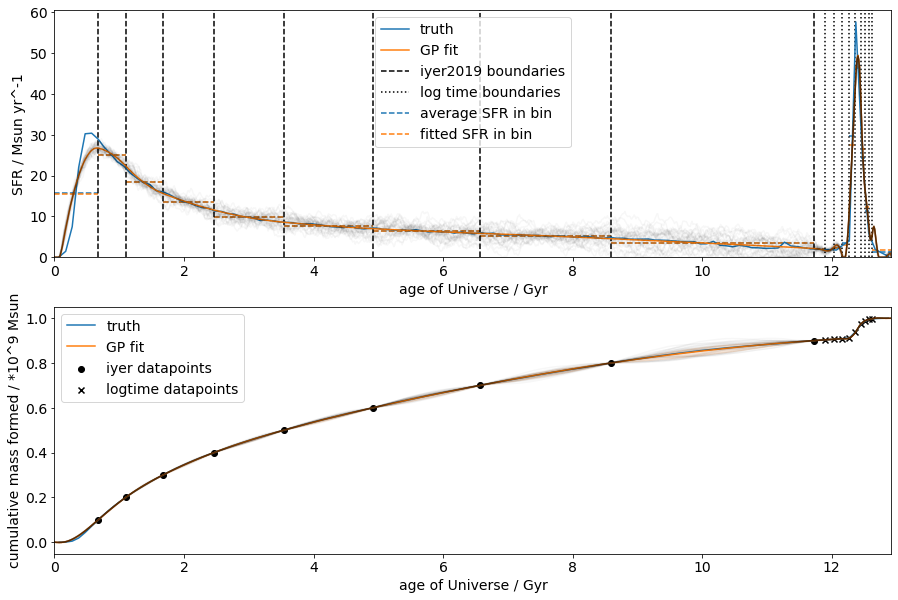

Iyer-then-log-time binning and fitting for 11 and then 10 bins.
(binning) summed squared arror between averaged sfr and actual sfh = 124.75958823499522
(fitted) summed squared arror between averaged sfr and actual sfh = 133.0854297617908


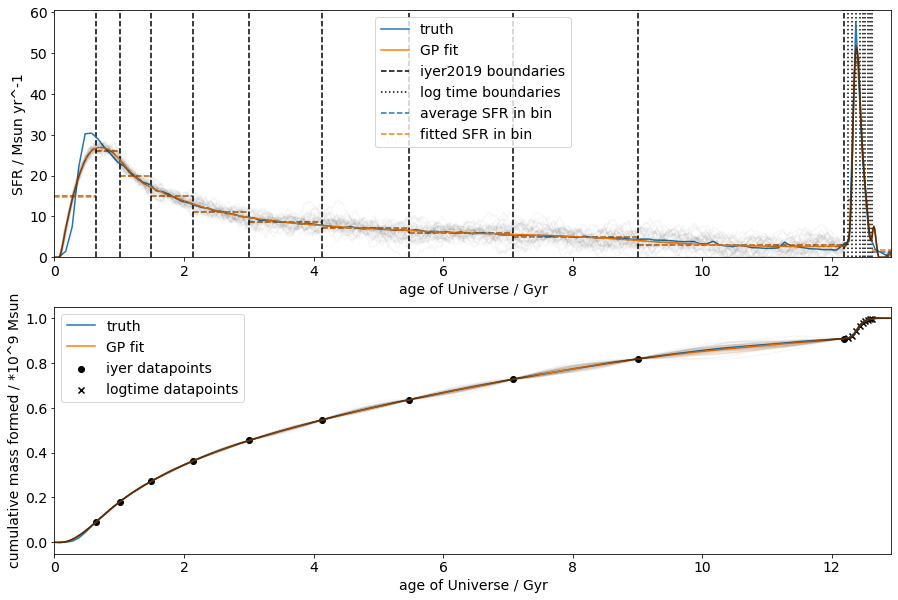

Iyer-then-log-time binning and fitting for 11 and then 11 bins.
(binning) summed squared arror between averaged sfr and actual sfh = 101.21805828291454
(fitted) summed squared arror between averaged sfr and actual sfh = 100.81981664603975


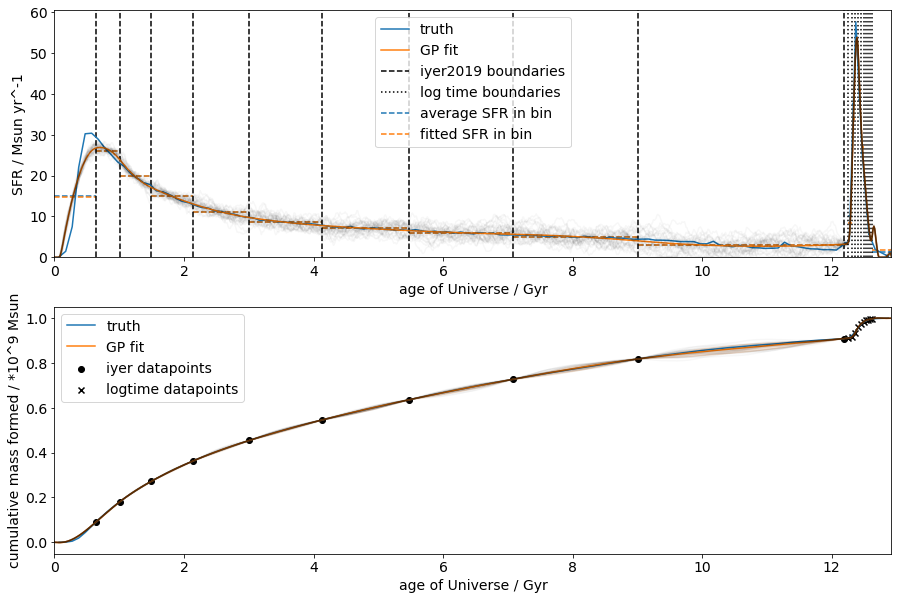

Iyer-then-log-time binning and fitting for 12 and then 11 bins.
(binning) summed squared arror between averaged sfr and actual sfh = 103.38244056142352
(fitted) summed squared arror between averaged sfr and actual sfh = 114.92168465372812


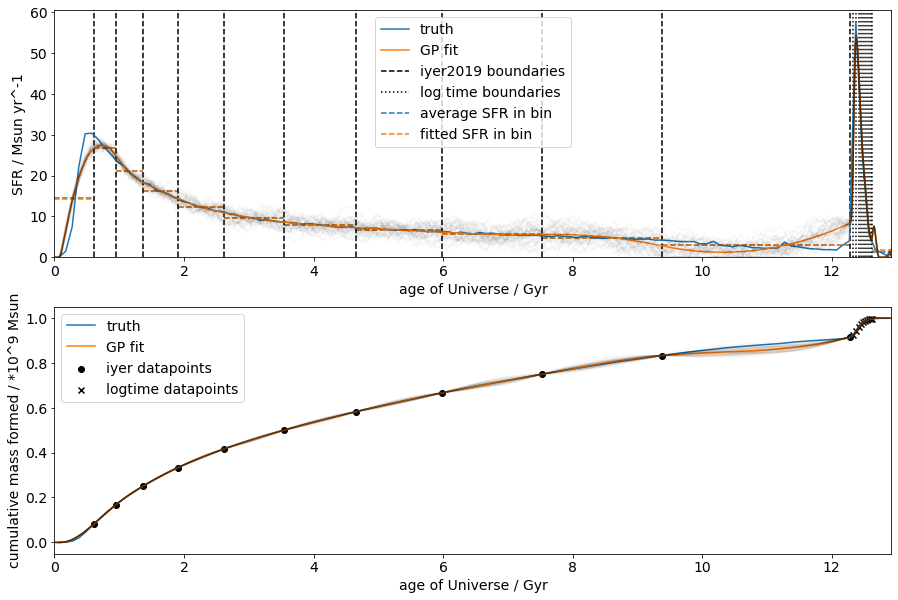

Iyer-then-log-time binning and fitting for 12 and then 12 bins.
(binning) summed squared arror between averaged sfr and actual sfh = 97.76951109312921
(fitted) summed squared arror between averaged sfr and actual sfh = 97.88210411403205


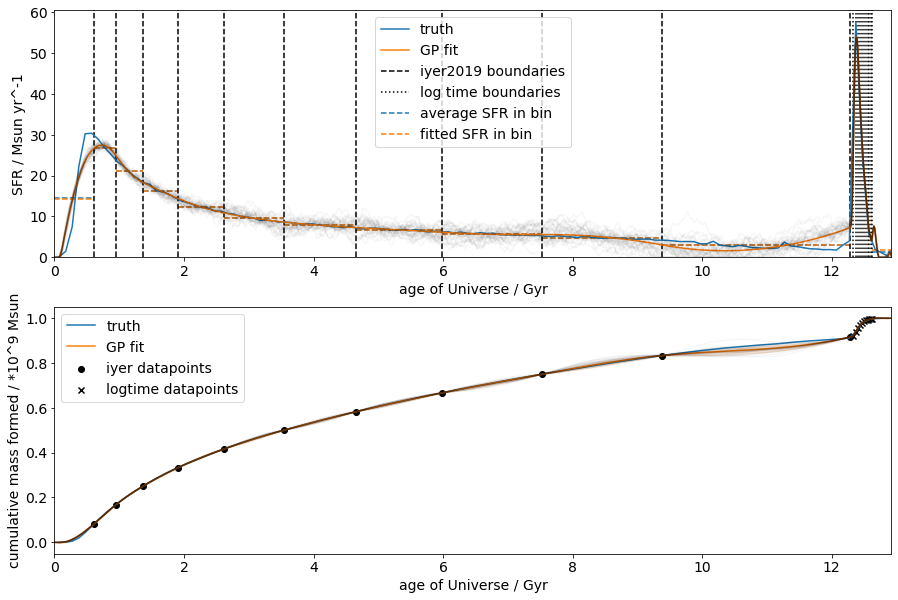

Iyer-then-log-time binning and fitting for 13 and then 12 bins.
(binning) summed squared arror between averaged sfr and actual sfh = 98.0120891331828
(fitted) summed squared arror between averaged sfr and actual sfh = 108.24852884800457


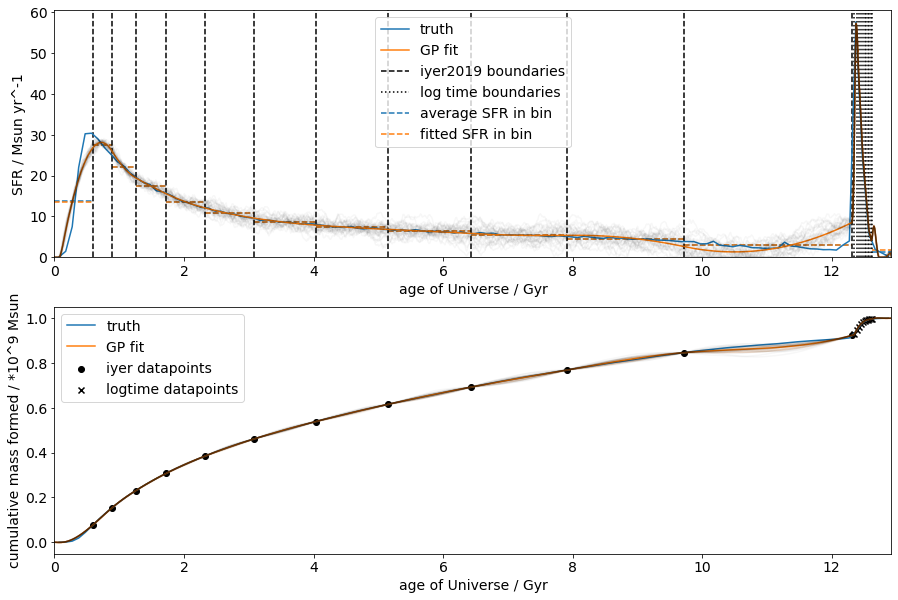

In [170]:
iyer_lt_errs = []
for i in np.arange(3,25):
    Nlt = int((i+1)/2)
    Niyer = i+1-Nlt
    iyer_lt_errs.append(do_iyer_lt_fitting([Niyer,Nlt]))
iyer_lt_errs = np.array(iyer_lt_errs).T

Iyer-then-log-time binning and fitting for 2 and then 9 bins.
(binning) summed squared arror between averaged sfr and actual sfh = 350.38999447128526
(fitted) summed squared arror between averaged sfr and actual sfh = 352.27971704364387


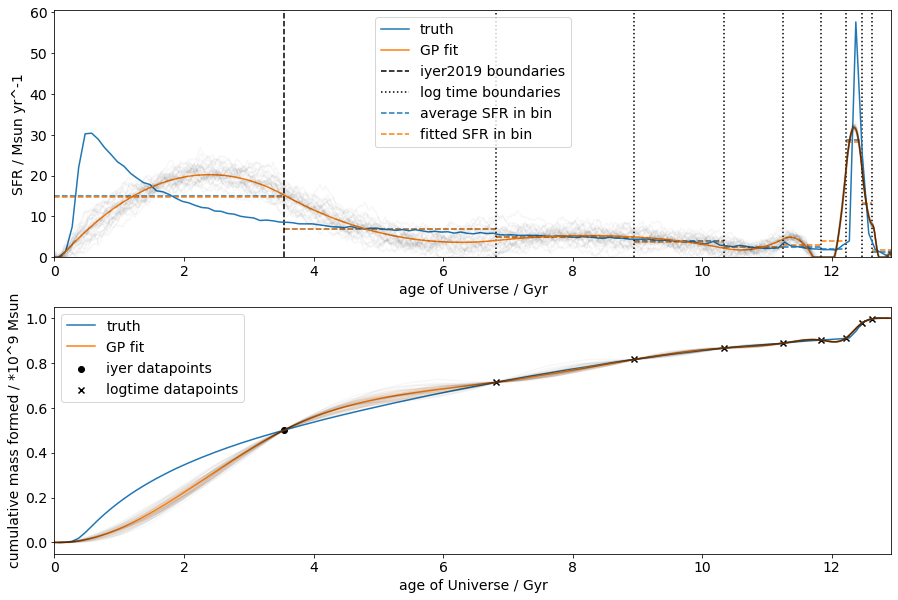

Iyer-then-log-time binning and fitting for 3 and then 8 bins.
(binning) summed squared arror between averaged sfr and actual sfh = 304.2470175108538
(fitted) summed squared arror between averaged sfr and actual sfh = 306.62354017287043


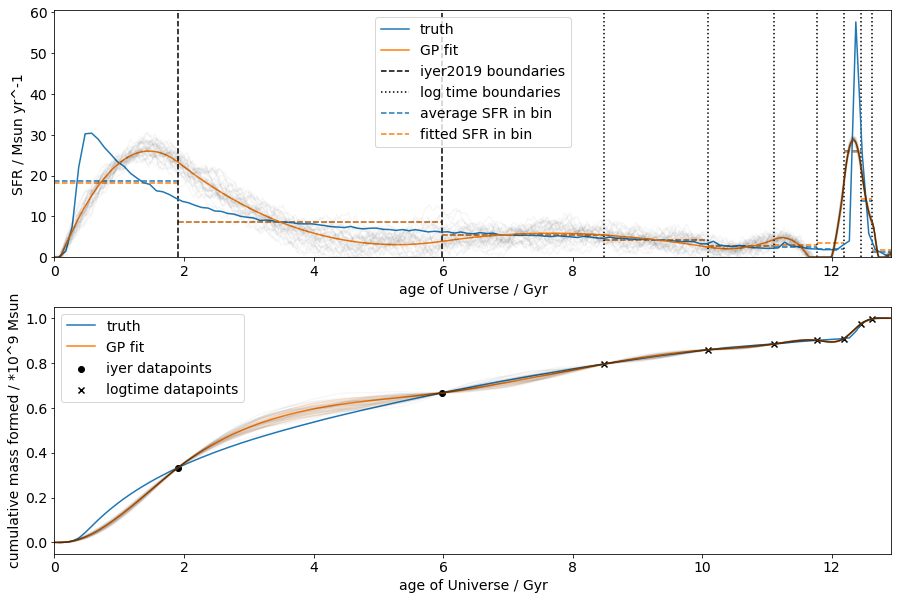

Iyer-then-log-time binning and fitting for 4 and then 7 bins.
(binning) summed squared arror between averaged sfr and actual sfh = 347.41672467608714
(fitted) summed squared arror between averaged sfr and actual sfh = 348.8648089720248


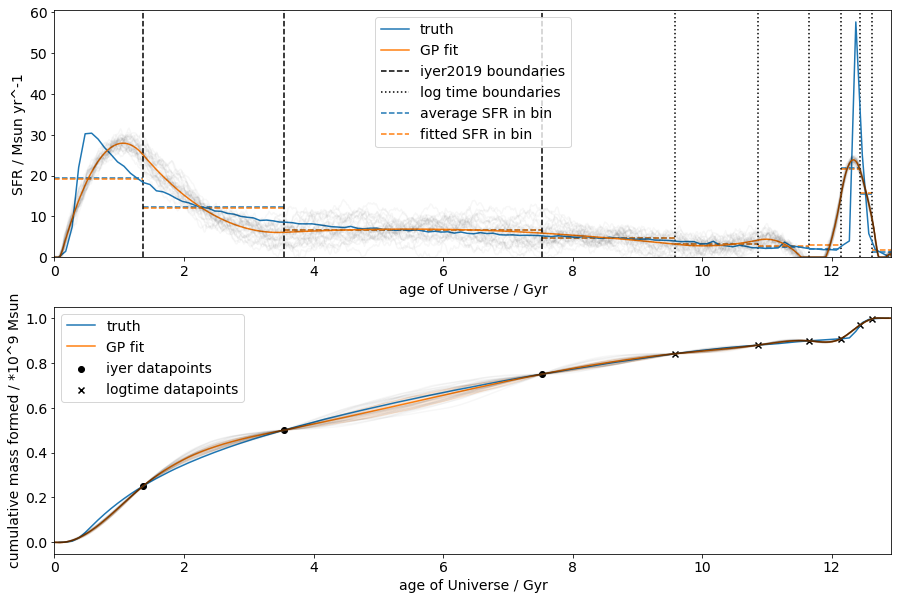

Iyer-then-log-time binning and fitting for 5 and then 6 bins.
(binning) summed squared arror between averaged sfr and actual sfh = 372.5857042357912
(fitted) summed squared arror between averaged sfr and actual sfh = 373.7332577923286


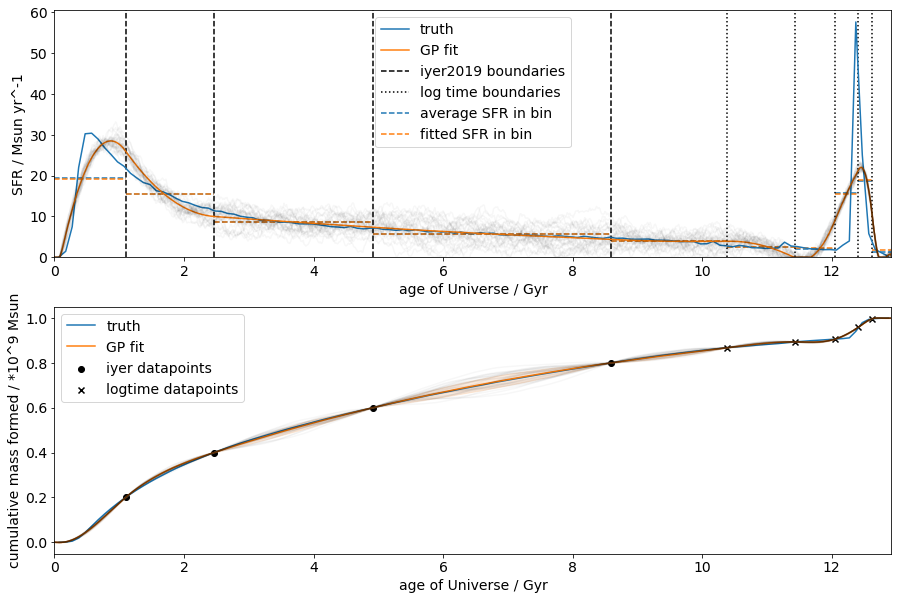

Iyer-then-log-time binning and fitting for 6 and then 5 bins.
(binning) summed squared arror between averaged sfr and actual sfh = 279.9333481481393
(fitted) summed squared arror between averaged sfr and actual sfh = 278.3605605672043


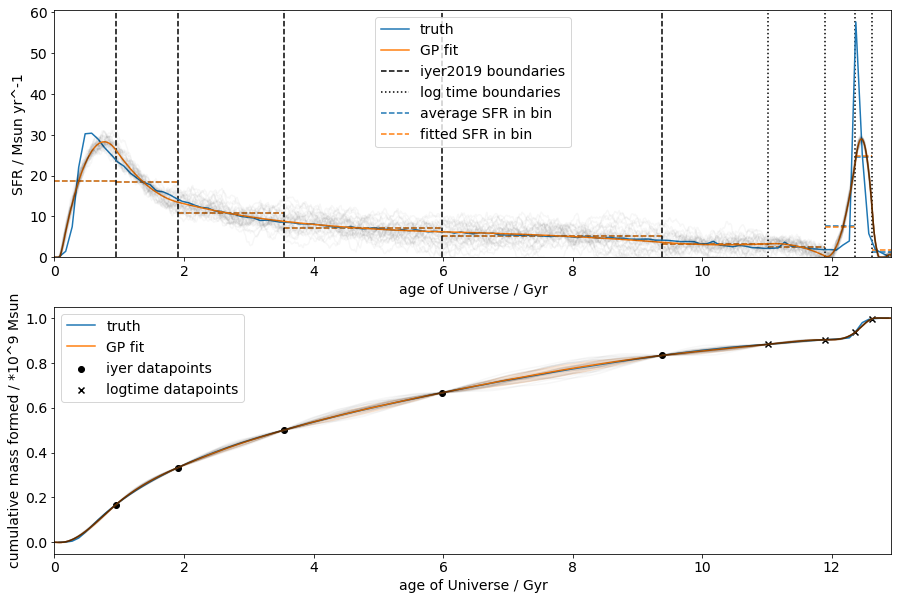

Iyer-then-log-time binning and fitting for 7 and then 4 bins.
(binning) summed squared arror between averaged sfr and actual sfh = 260.166366251571
(fitted) summed squared arror between averaged sfr and actual sfh = 268.63198531541275


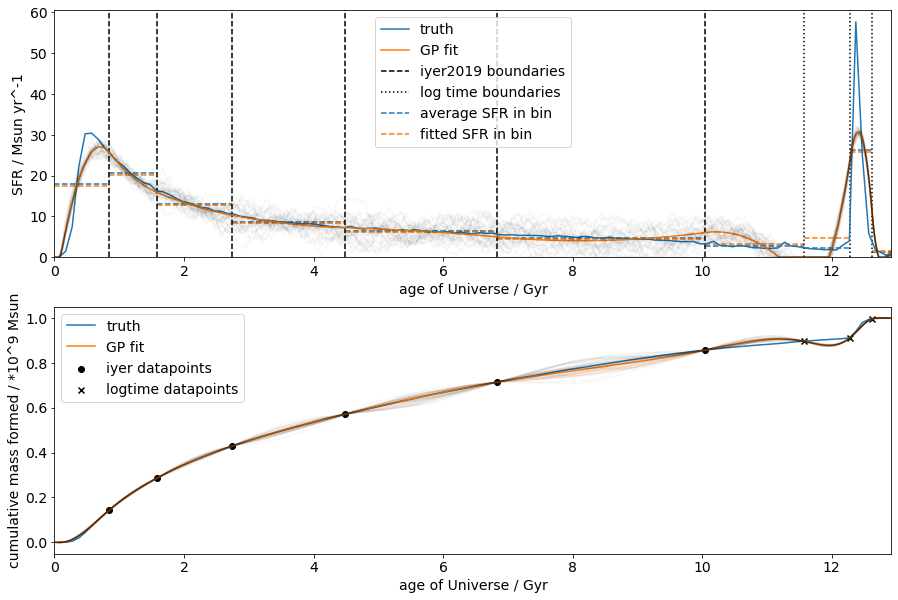

Iyer-then-log-time binning and fitting for 8 and then 3 bins.
(binning) summed squared arror between averaged sfr and actual sfh = 330.8545084419842
(fitted) summed squared arror between averaged sfr and actual sfh = 335.6595098333817


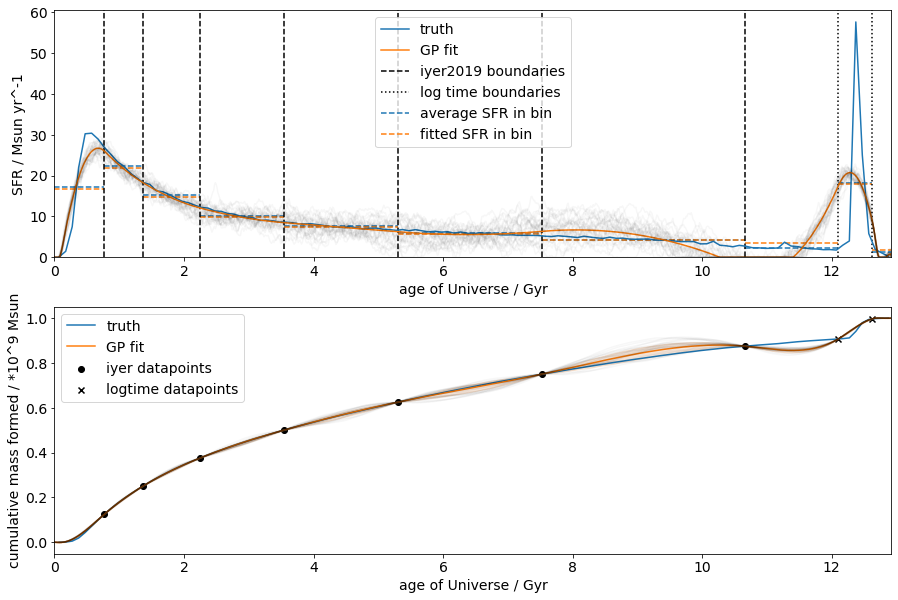

Iyer-then-log-time binning and fitting for 9 and then 2 bins.
(binning) summed squared arror between averaged sfr and actual sfh = 420.02588957631684
(fitted) summed squared arror between averaged sfr and actual sfh = 420.6178664215032


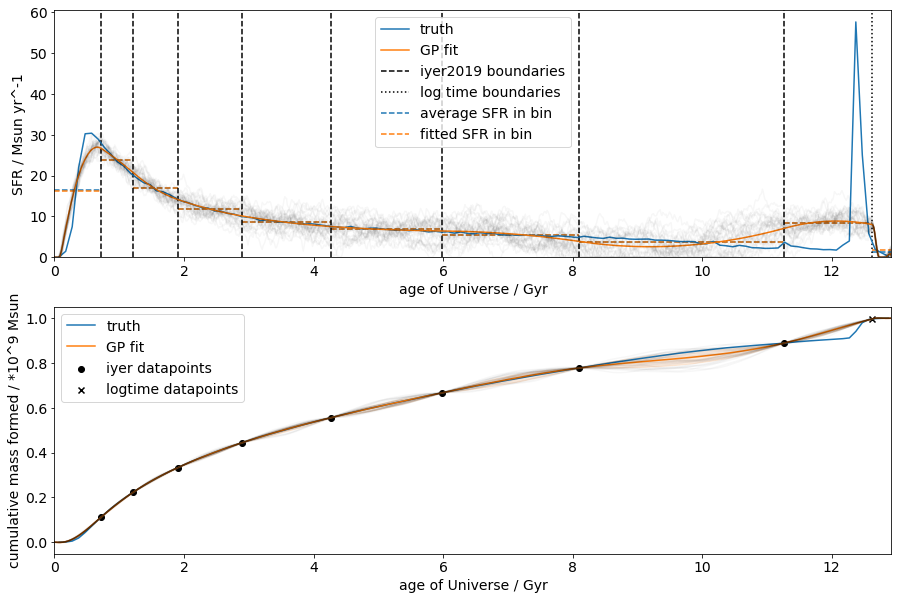

In [160]:
for i in np.arange(2,10):
    a = do_iyer_lt_fitting([i,11-i])

### iyer then iyer binning from a total of 3 to 24 bins
There are many combinations to mix and match the number of bins in each method here. I chose to do two demonstrations: <br>
1. going from 3 to 24 total bins but keeping the number of bins in each scheme roughly equal (when odd number, I give the first layer of binning one more bin)
2. fixing total Nbins at 10, but going from 2 to 9 first layer bins

Iyer-then-log-time binning and fitting for 2 and then 2 bins.
[0.27385026] [0.58451142]
(binning) summed squared arror between averaged sfr and actual sfh = 522.4839357657119
(fitted) summed squared arror between averaged sfr and actual sfh = 522.5498304751085


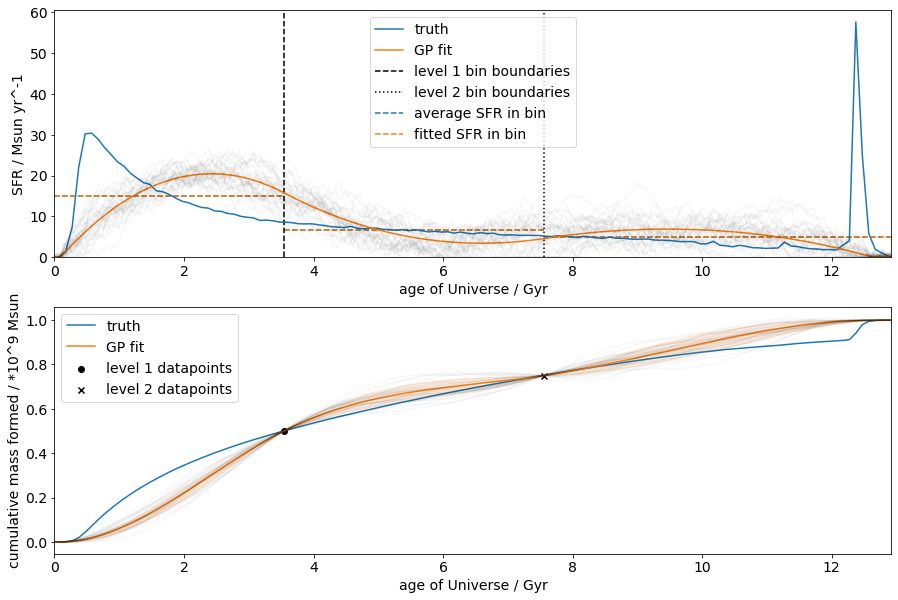

Iyer-then-log-time binning and fitting for 3 and then 2 bins.
[0.14754982 0.46263317] [0.73116863]
(binning) summed squared arror between averaged sfr and actual sfh = 472.4810567633201
(fitted) summed squared arror between averaged sfr and actual sfh = 472.72191034064883


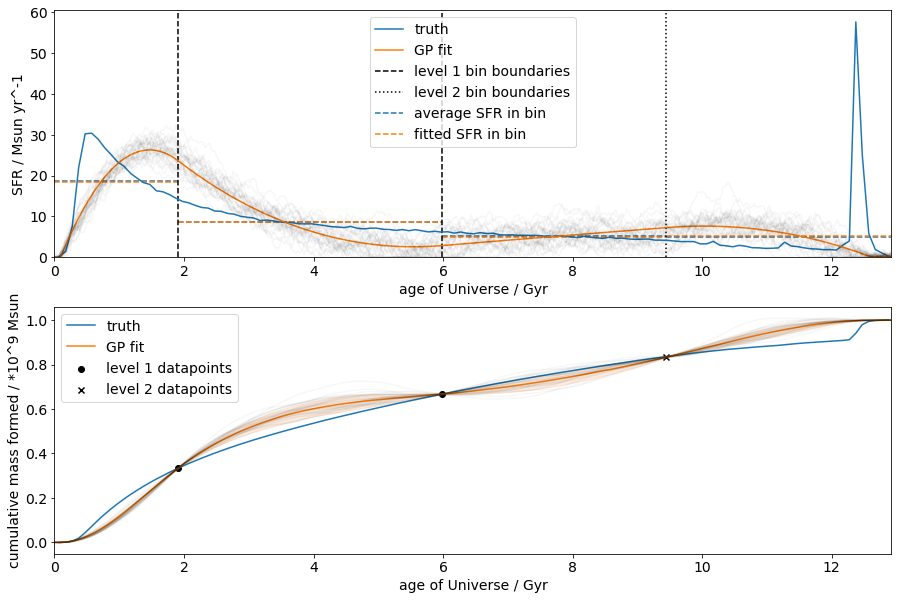

Iyer-then-log-time binning and fitting for 3 and then 3 bins.
[0.14754982 0.46263317] [0.63309122 0.87649075]
(binning) summed squared arror between averaged sfr and actual sfh = 457.1140492969957
(fitted) summed squared arror between averaged sfr and actual sfh = 457.3321549613356


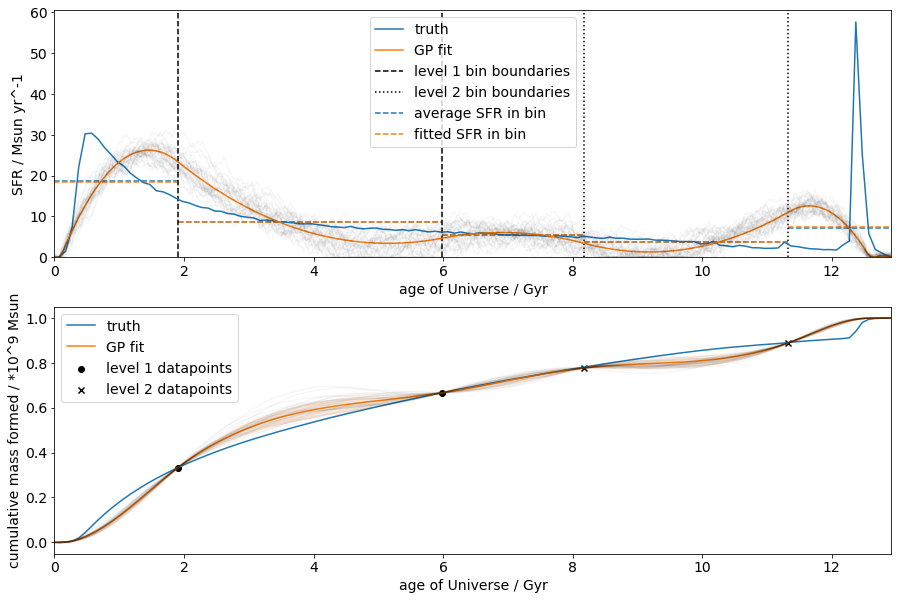

Iyer-then-log-time binning and fitting for 4 and then 3 bins.
[0.10551834 0.27385026 0.58230328] [0.72882932 0.95120313]
(binning) summed squared arror between averaged sfr and actual sfh = 382.88494147173583
(fitted) summed squared arror between averaged sfr and actual sfh = 458.9685276220784


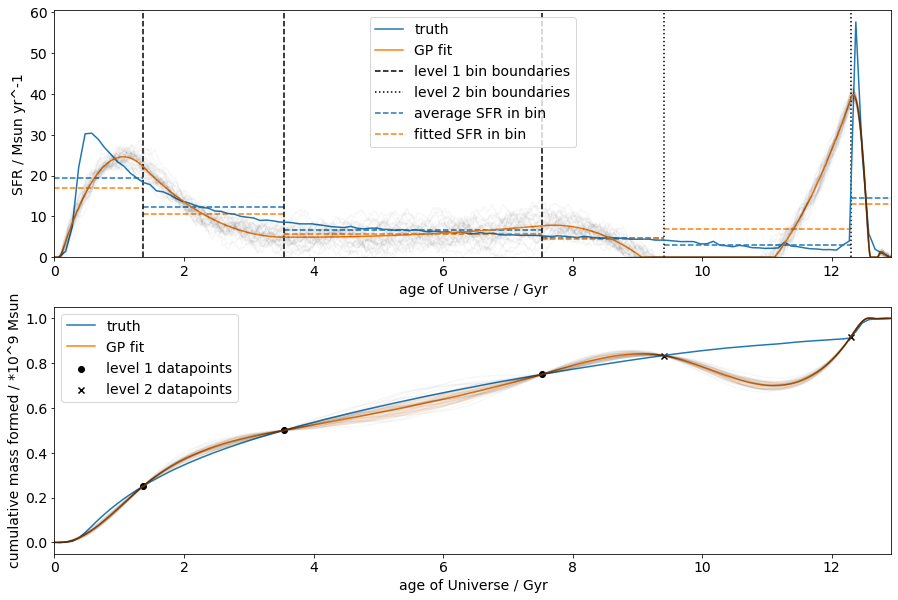

Iyer-then-log-time binning and fitting for 4 and then 4 bins.
[0.10551834 0.27385026 0.58230328] [0.68983211 0.82847313 0.95670401]
(binning) summed squared arror between averaged sfr and actual sfh = 394.08891038916425
(fitted) summed squared arror between averaged sfr and actual sfh = 451.14823690765456


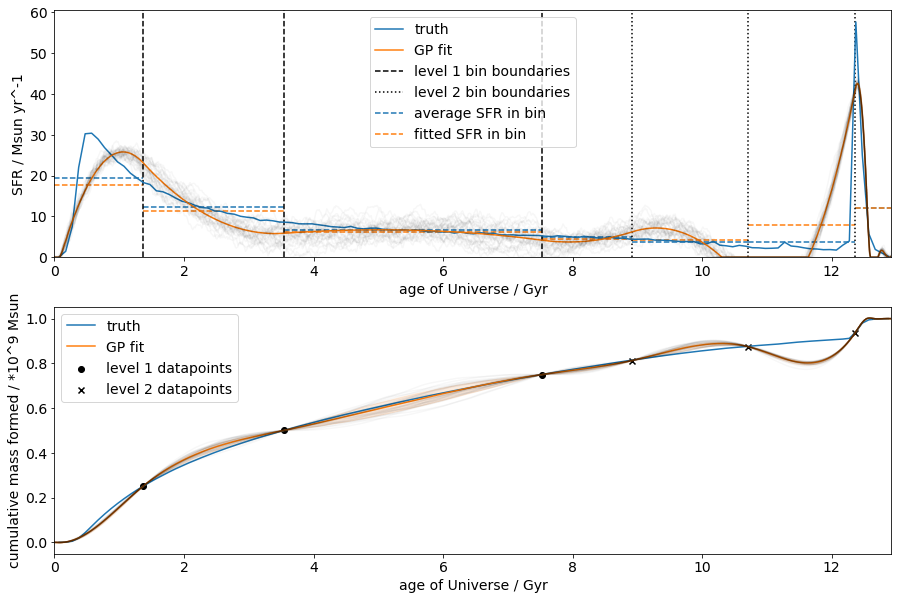

Iyer-then-log-time binning and fitting for 5 and then 4 bins.
[0.08499271 0.19045612 0.38006954 0.66455328] [0.76650358 0.91492052 0.95944894]
(binning) summed squared arror between averaged sfr and actual sfh = 425.46196678506226
(fitted) summed squared arror between averaged sfr and actual sfh = 432.3628339508655


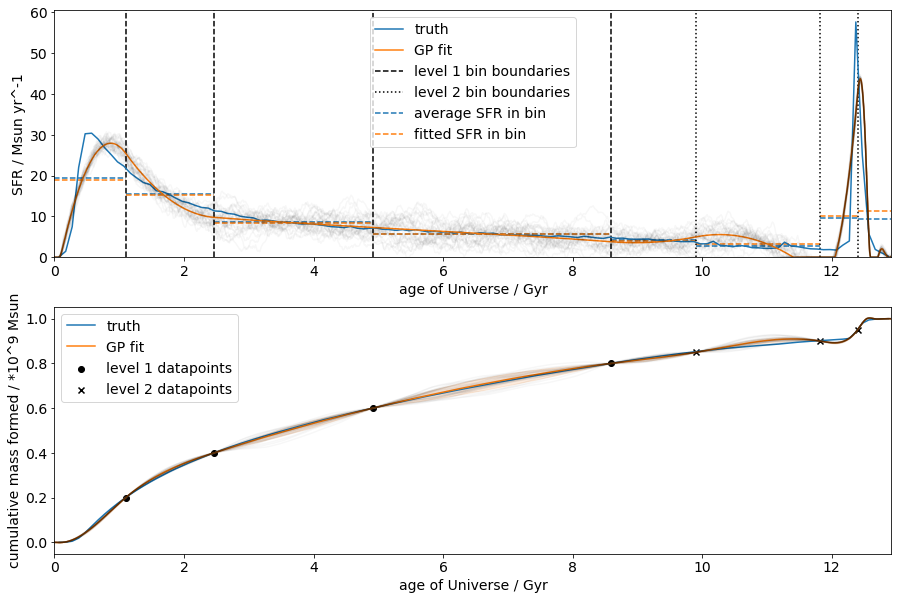

Iyer-then-log-time binning and fitting for 5 and then 5 bins.
[0.08499271 0.19045612 0.38006954 0.66455328] [0.74541446 0.84989903 0.95228998 0.96139792]
(binning) summed squared arror between averaged sfr and actual sfh = 186.64076050599022
(fitted) summed squared arror between averaged sfr and actual sfh = 244.20468102092613


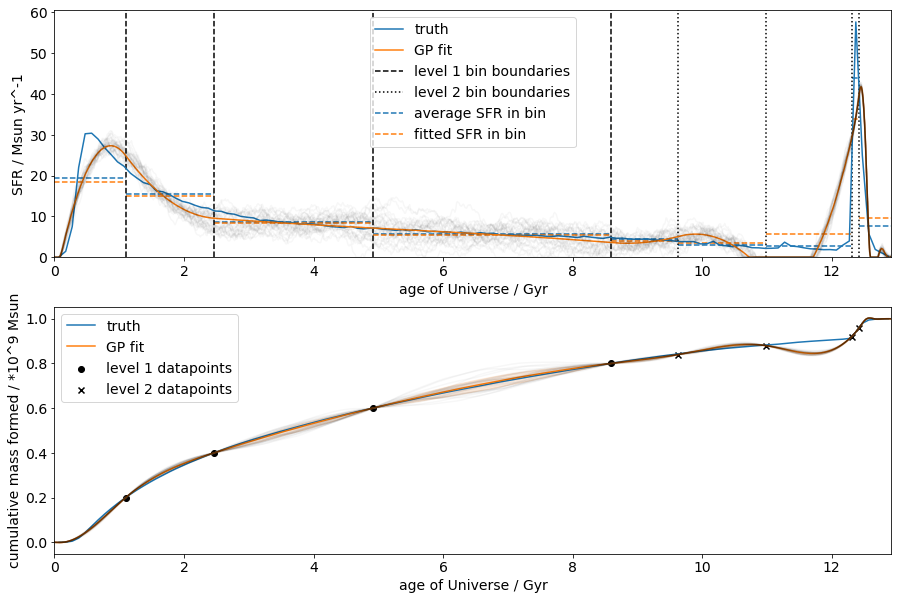

Iyer-then-log-time binning and fitting for 6 and then 5 bins.
[0.07302856 0.14754982 0.27385026 0.46263317 0.72568312] [0.80888645 0.91625542 0.95583219 0.96271816]
(binning) summed squared arror between averaged sfr and actual sfh = 181.06671531479077
(fitted) summed squared arror between averaged sfr and actual sfh = 219.64125378849846


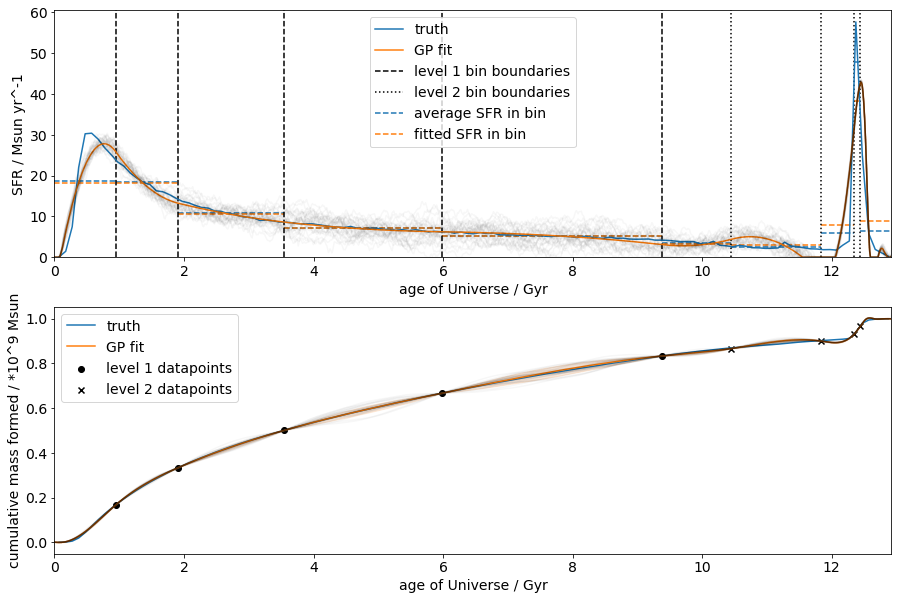

Iyer-then-log-time binning and fitting for 6 and then 6 bins.
[0.07302856 0.14754982 0.27385026 0.46263317 0.72568312] [0.79332865 0.8781116  0.95148858 0.95840102 0.96379744]
(binning) summed squared arror between averaged sfr and actual sfh = 199.25935846210788
(fitted) summed squared arror between averaged sfr and actual sfh = 246.02443854371012


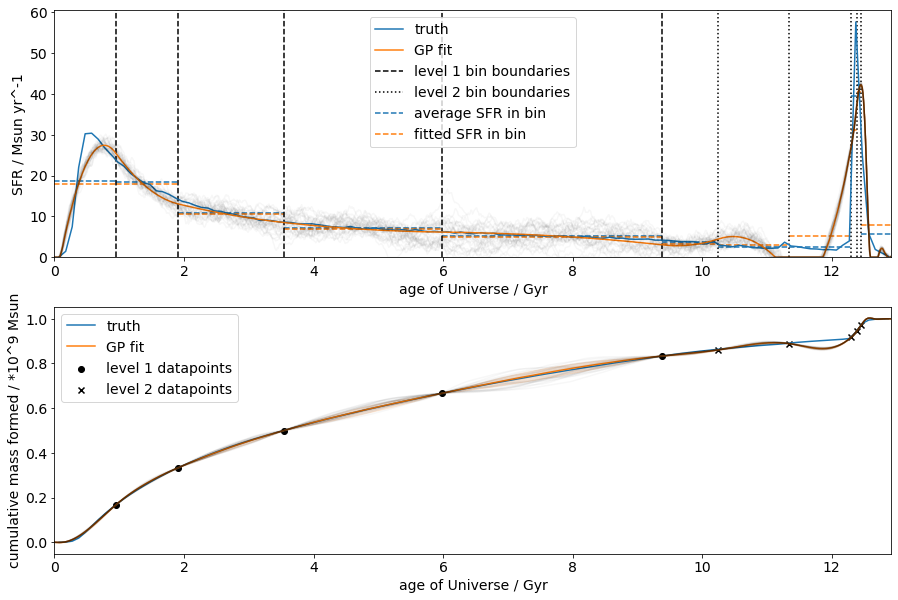

Iyer-then-log-time binning and fitting for 7 and then 6 bins.
[0.06514575 0.12220359 0.21167938 0.34745289 0.52820364 0.77668552] [0.84833464 0.93057839 0.95431398 0.95980511 0.96449949]
(binning) summed squared arror between averaged sfr and actual sfh = 172.92868428657593
(fitted) summed squared arror between averaged sfr and actual sfh = 223.24735074130624


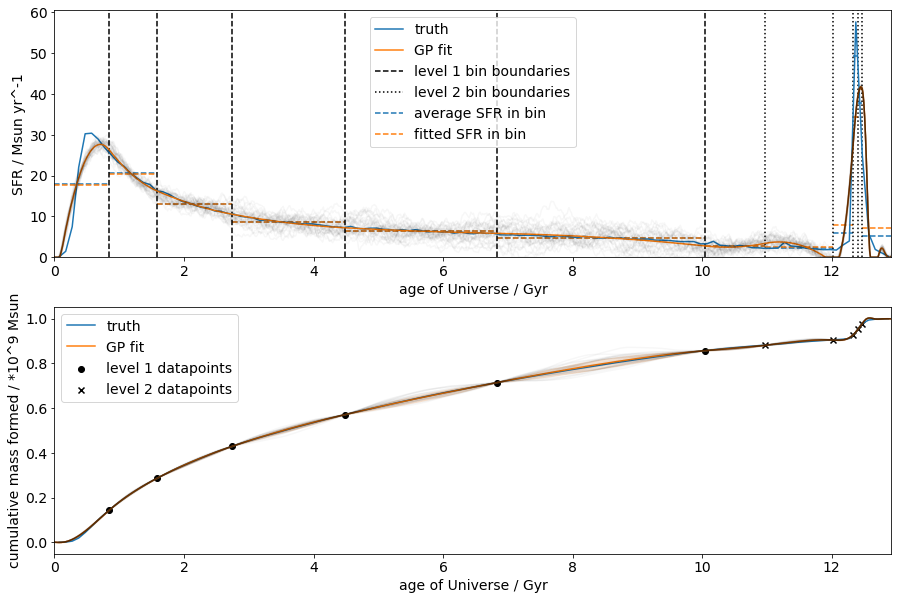

Iyer-then-log-time binning and fitting for 7 and then 7 bins.
[0.06514575 0.12220359 0.21167938 0.34745289 0.52820364 0.77668552] [0.83619504 0.90212536 0.95161502 0.95701293 0.96114636 0.96517011]
(binning) summed squared arror between averaged sfr and actual sfh = 169.11930308807052
(fitted) summed squared arror between averaged sfr and actual sfh = 202.68957453439833


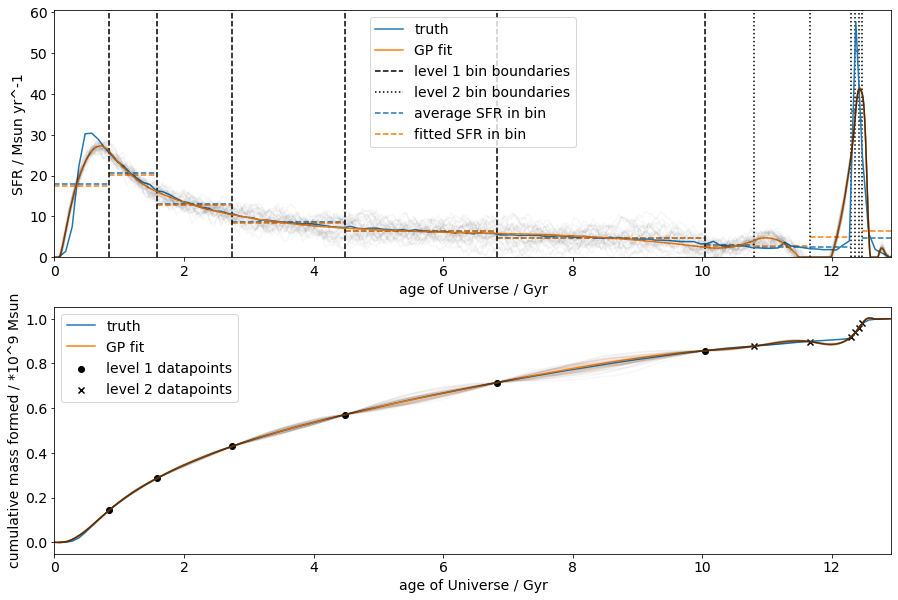

Iyer-then-log-time binning and fitting for 8 and then 7 bins.
[0.05953122 0.10551834 0.17334383 0.27385026 0.40993927 0.58230328
 0.82472641] [0.88329491 0.94771626 0.954226   0.95858232 0.96211951 0.96645564]
(binning) summed squared arror between averaged sfr and actual sfh = 135.201835742992
(fitted) summed squared arror between averaged sfr and actual sfh = 227.1540885036884


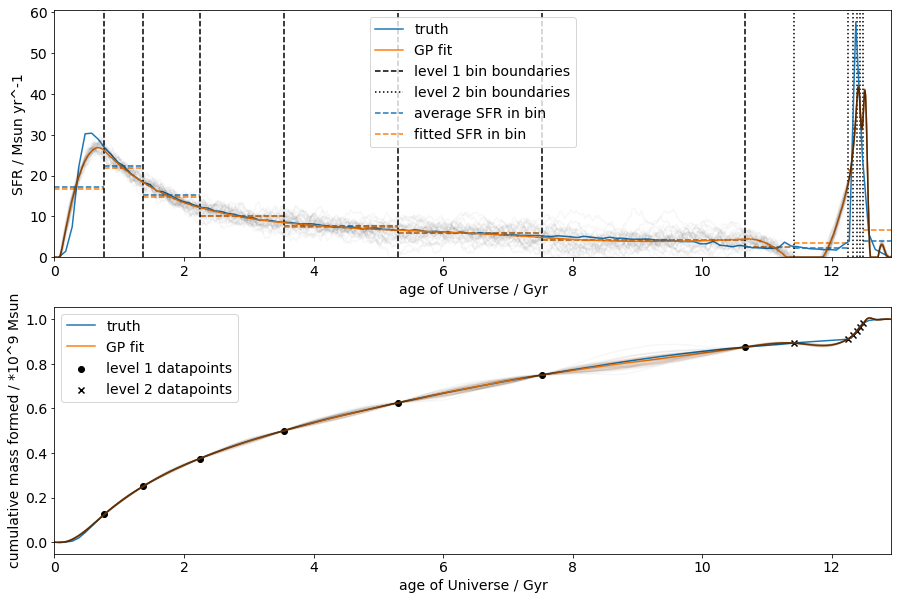

Iyer-then-log-time binning and fitting for 8 and then 8 bins.
[0.05953122 0.10551834 0.17334383 0.27385026 0.40993927 0.58230328
 0.82472641] [0.87709404 0.93502491 0.95244656 0.95659858 0.95990877 0.9630038
 0.96764079]
(binning) summed squared arror between averaged sfr and actual sfh = 115.8206184317195
(fitted) summed squared arror between averaged sfr and actual sfh = 167.47257419141943


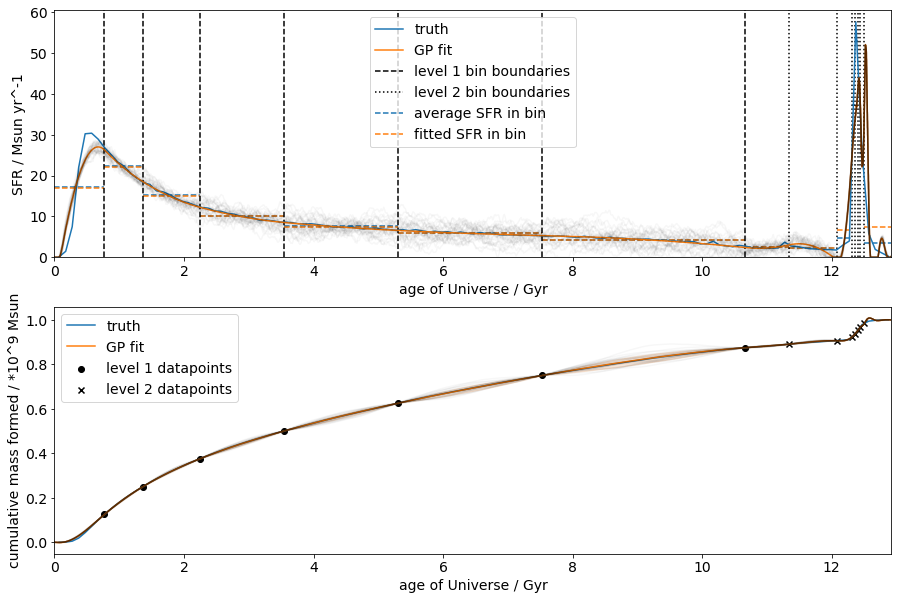

Iyer-then-log-time binning and fitting for 9 and then 8 bins.
[0.05544107 0.09370385 0.14754982 0.22430927 0.32985395 0.46263317
 0.62699864 0.87173639] [0.91934596 0.95103399 0.95472943 0.95817511 0.9609298  0.96368449
 0.96855306]
(binning) summed squared arror between averaged sfr and actual sfh = 118.98002902337394
(fitted) summed squared arror between averaged sfr and actual sfh = 202.1679418570895


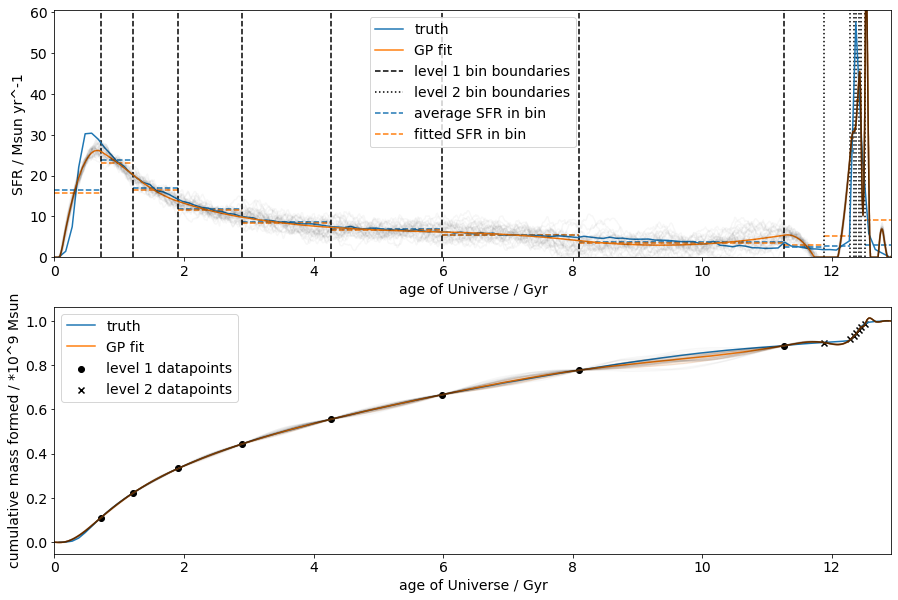

Iyer-then-log-time binning and fitting for 9 and then 9 bins.
[0.05544107 0.09370385 0.14754982 0.22430927 0.32985395 0.46263317
 0.62699864 0.87173639] [0.91281296 0.95021278 0.95349762 0.95678246 0.95939941 0.96184803
 0.96429664 0.96937348]
(binning) summed squared arror between averaged sfr and actual sfh = 115.46828491969198
(fitted) summed squared arror between averaged sfr and actual sfh = 230.84886979480683


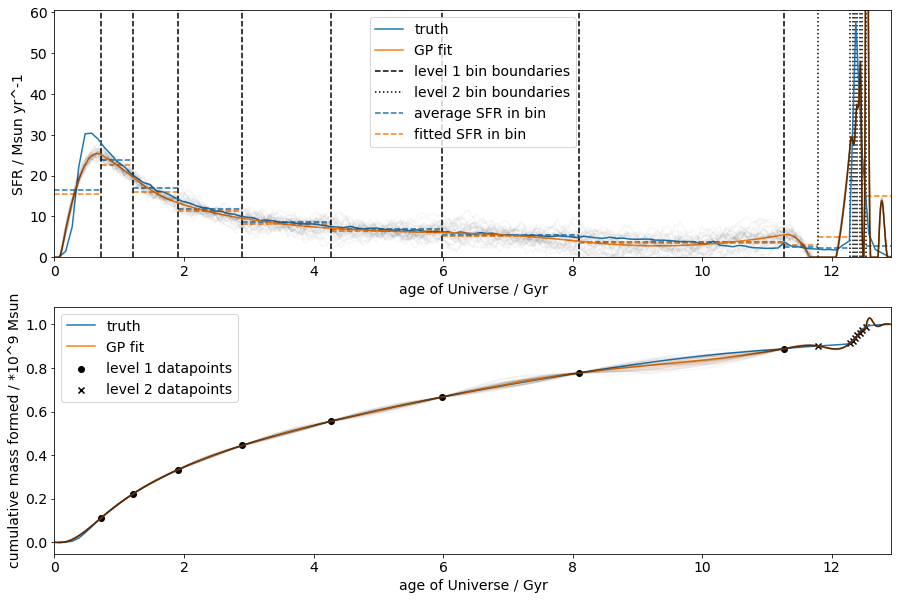

Iyer-then-log-time binning and fitting for 10 and then 9 bins.
[0.05216894 0.08499271 0.12946485 0.19045612 0.27385026 0.38006954
 0.50816096 0.66455328 0.90700363] [0.94974725 0.95267967 0.9556121  0.9582643  0.96045021 0.96263613
 0.96482204 0.97007763]
(binning) summed squared arror between averaged sfr and actual sfh = 119.00931261470043
(fitted) summed squared arror between averaged sfr and actual sfh = 198.62735643052255


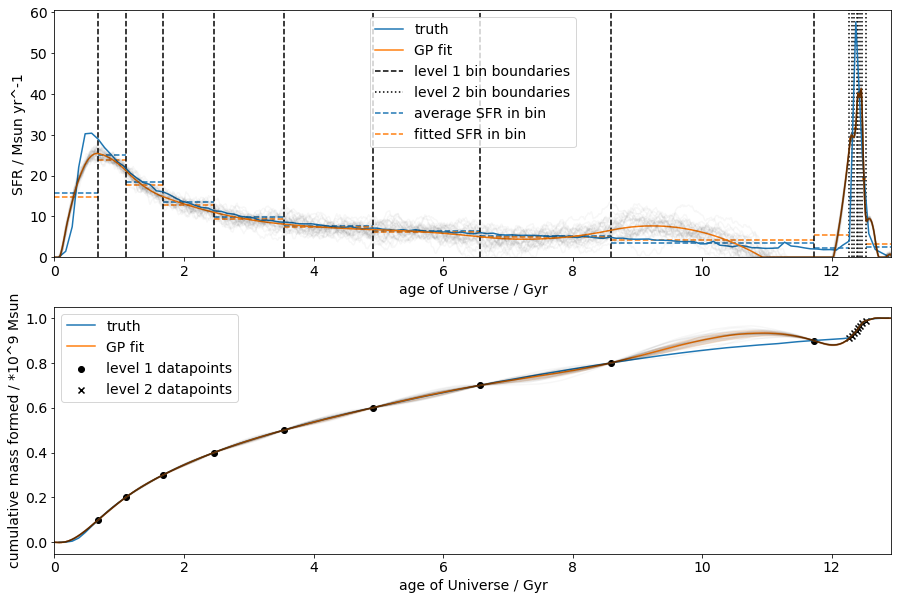

Iyer-then-log-time binning and fitting for 10 and then 10 bins.
[0.05216894 0.08499271 0.12946485 0.19045612 0.27385026 0.38006954
 0.50816096 0.66455328 0.90700363] [0.94747943 0.95209319 0.95473237 0.95737155 0.95935725 0.96132458
 0.9632919  0.96539026 0.97066355]
(binning) summed squared arror between averaged sfr and actual sfh = 117.6935660486607
(fitted) summed squared arror between averaged sfr and actual sfh = 188.29698095028107


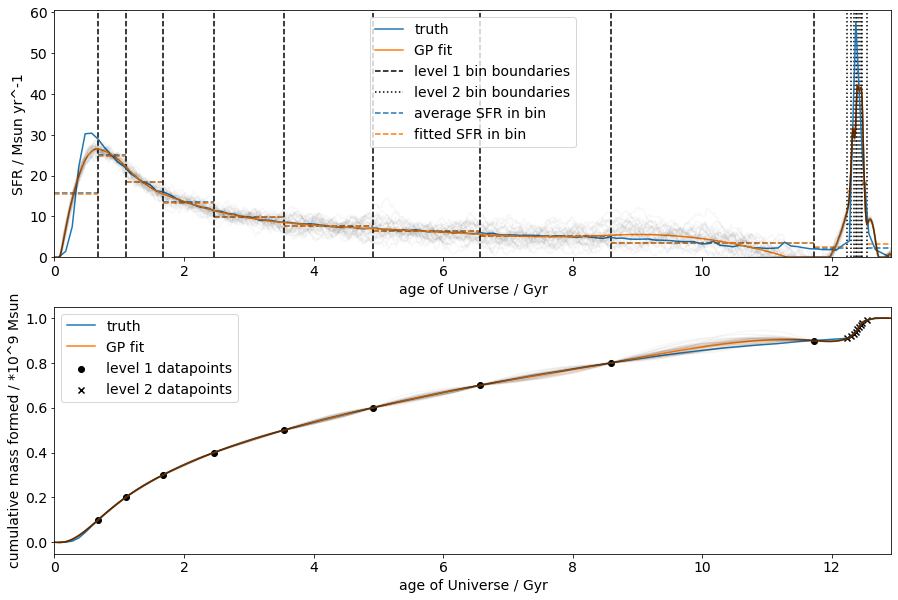

Iyer-then-log-time binning and fitting for 11 and then 10 bins.
[0.04965072 0.07833405 0.11592634 0.16595041 0.23272401 0.31909901
 0.42394662 0.54750742 0.69703365 0.94321563] [0.95205629 0.95440633 0.95675637 0.95868314 0.96043493 0.96218672
 0.96393851 0.96654572 0.97124128]
(binning) summed squared arror between averaged sfr and actual sfh = 97.1606325120819
(fitted) summed squared arror between averaged sfr and actual sfh = 146.598453781094


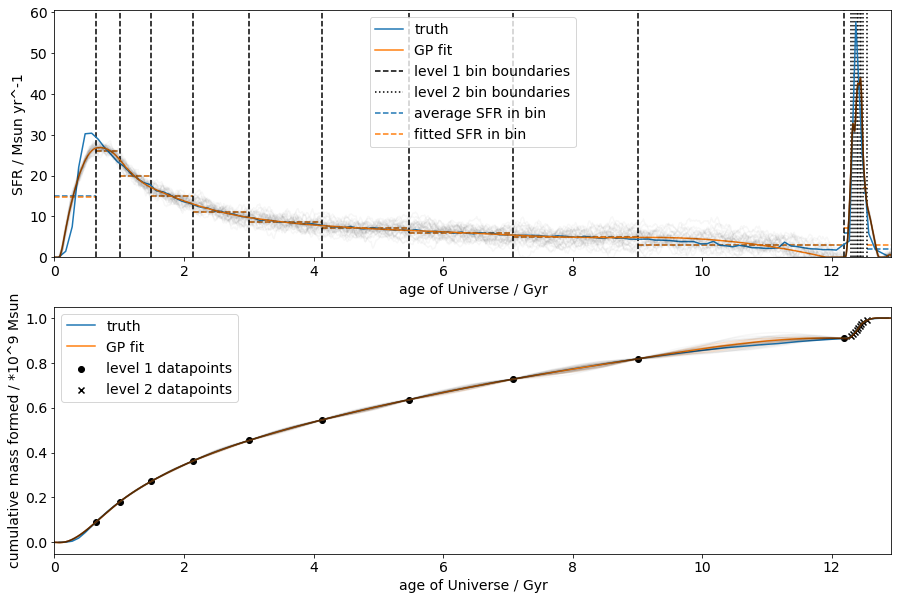

Iyer-then-log-time binning and fitting for 11 and then 11 bins.
[0.04965072 0.07833405 0.11592634 0.16595041 0.23272401 0.31909901
 0.42394662 0.54750742 0.69703365 0.94321563] [0.95184265 0.95397905 0.95611545 0.95804613 0.95963866 0.9612312
 0.96282373 0.96441627 0.96739946 0.97166815]
(binning) summed squared arror between averaged sfr and actual sfh = 97.97133772847491
(fitted) summed squared arror between averaged sfr and actual sfh = 155.3670049291271


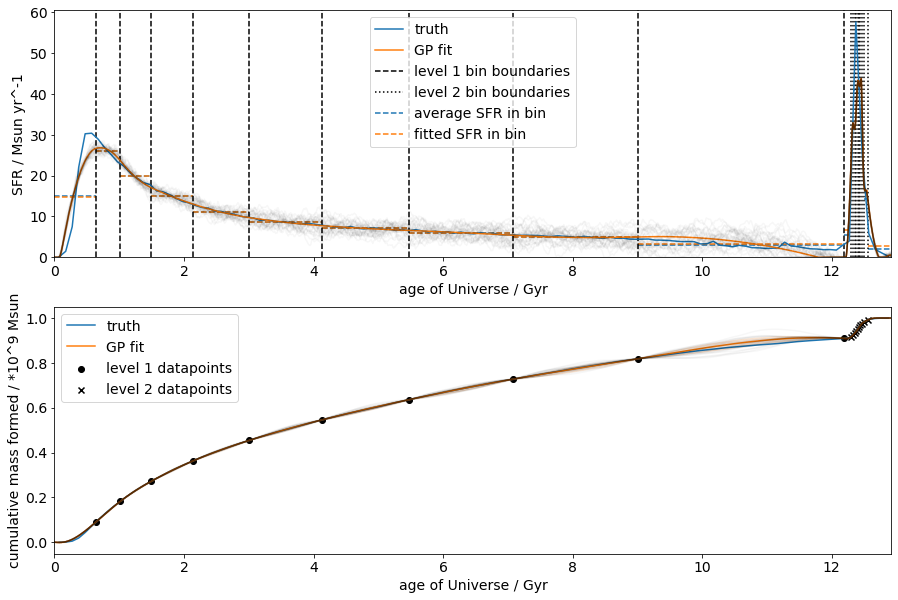

Iyer-then-log-time binning and fitting for 12 and then 11 bins.
[0.04755284 0.07302856 0.10551834 0.14754982 0.20263499 0.27385026
 0.36070767 0.46263317 0.58230328 0.72568312 0.95099067] [0.95851194 0.95958013 0.96064832 0.96171652 0.96278471 0.9638529
 0.9649211  0.96734716 0.97021039 0.97353769]
(binning) summed squared arror between averaged sfr and actual sfh = 133.78984398189115
(fitted) summed squared arror between averaged sfr and actual sfh = 368.40099462557373


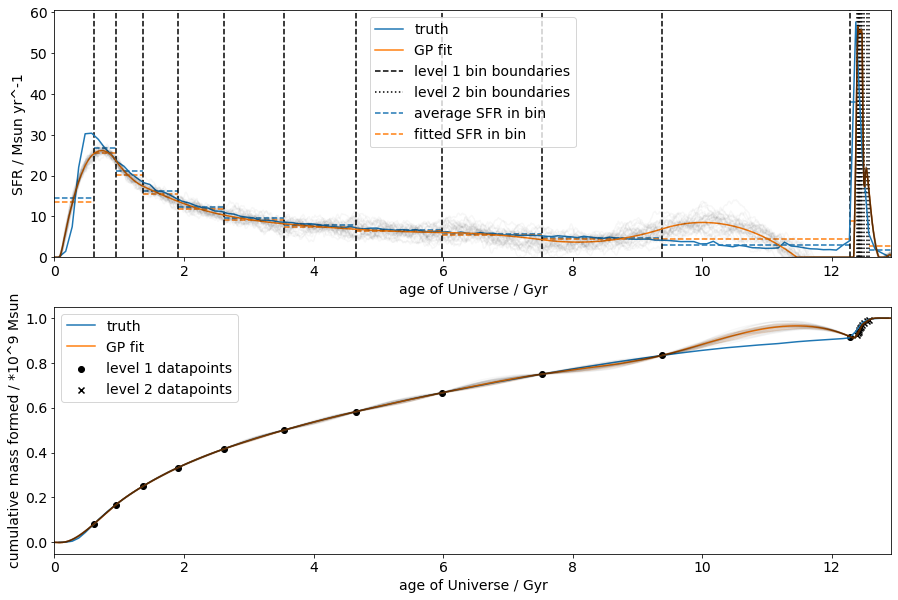

Iyer-then-log-time binning and fitting for 12 and then 12 bins.
[0.04755284 0.07302856 0.10551834 0.14754982 0.20263499 0.27385026
 0.36070767 0.46263317 0.58230328 0.72568312 0.95099067] [0.95842292 0.9594021  0.96038128 0.96136045 0.96233963 0.96331881
 0.96429798 0.96543834 0.96806297 0.9706876  0.97449125]
(binning) summed squared arror between averaged sfr and actual sfh = 133.59461279599026
(fitted) summed squared arror between averaged sfr and actual sfh = 428.02035712598615


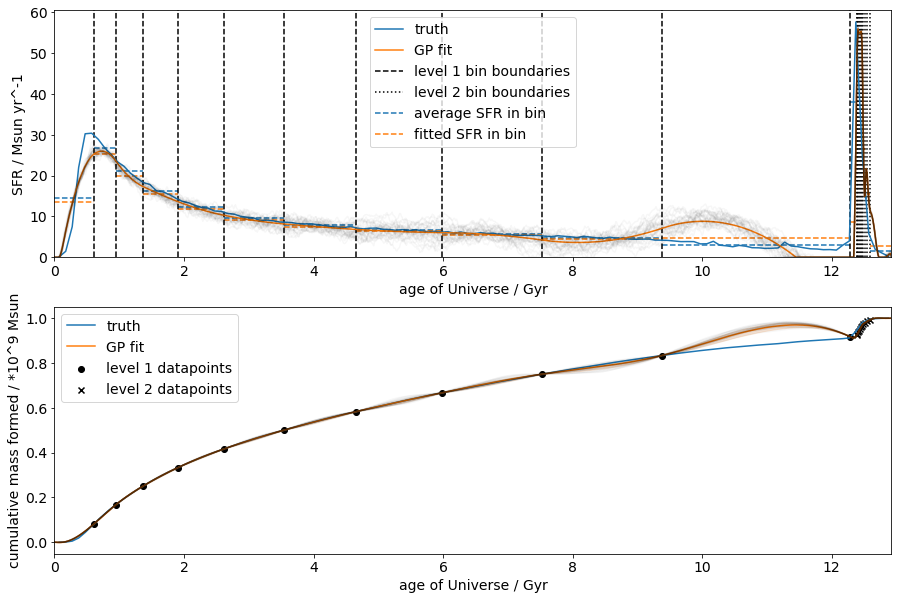

Iyer-then-log-time binning and fitting for 13 and then 12 bins.
[0.04577771 0.06868785 0.09721714 0.1334873  0.1797893  0.2386648
 0.31189172 0.39817791 0.49739299 0.61289412 0.75193109 0.95269959] [0.95842292 0.9594021  0.96038128 0.96136045 0.96233963 0.96331881
 0.96429798 0.96543834 0.96806297 0.9706876  0.97449125]
(binning) summed squared arror between averaged sfr and actual sfh = 115.13058170340686
(fitted) summed squared arror between averaged sfr and actual sfh = 409.36930894226197


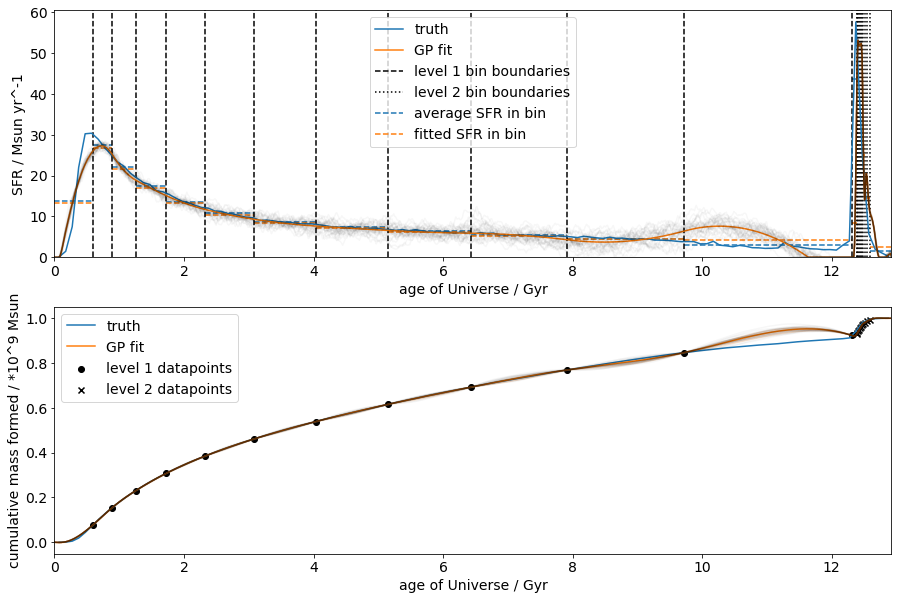

In [166]:
iyer_iyer_errs = []
for i in np.arange(3,25):
    N2 = int((i+1)/2)
    N1 = i+1-N2
    iyer_iyer_errs.append(do_iyer_iyer_fitting([N1,N2]))
iyer_iyer_errs = np.array(iyer_iyer_errs).T

Iyer-then-log-time binning and fitting for 2 and then 9 bins.
[0.27385026] [0.33259958 0.39567602 0.46512114 0.54228744 0.62906392 0.72754047
 0.87337527 0.95821591]
(binning) summed squared arror between averaged sfr and actual sfh = 511.1747406844005
(fitted) summed squared arror between averaged sfr and actual sfh = 517.8678599338244


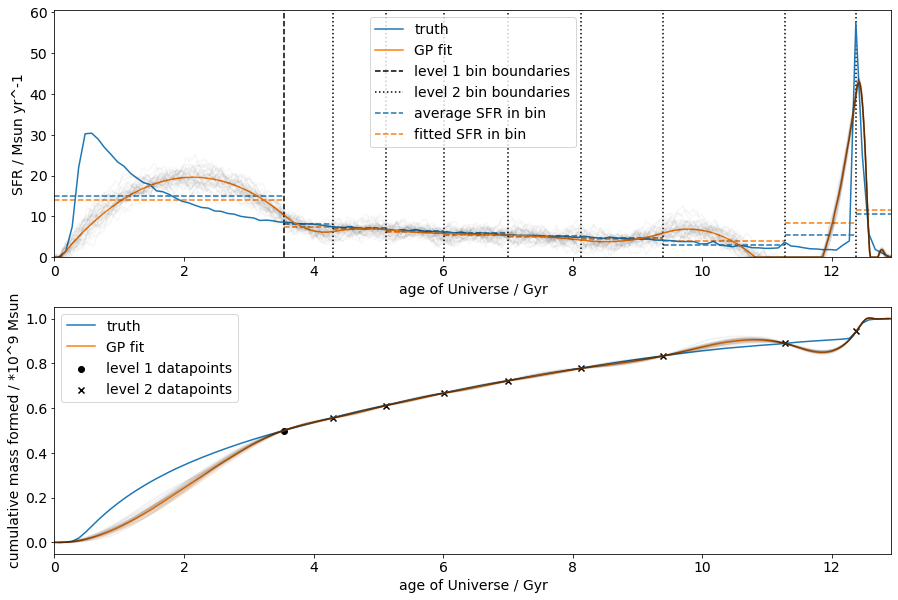

Iyer-then-log-time binning and fitting for 3 and then 8 bins.
[0.14754982 0.46263317] [0.52663614 0.58889508 0.65620169 0.73116863 0.83135771 0.95136111
 0.96105172]
(binning) summed squared arror between averaged sfr and actual sfh = 203.284151428793
(fitted) summed squared arror between averaged sfr and actual sfh = 258.5094648523154


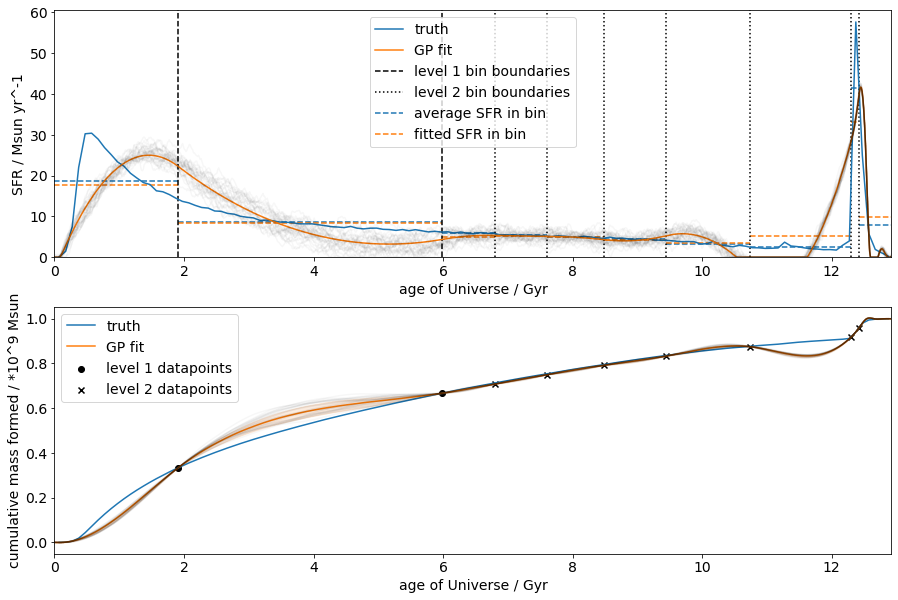

Iyer-then-log-time binning and fitting for 4 and then 7 bins.
[0.10551834 0.27385026 0.58230328] [0.64344085 0.70620573 0.78003593 0.88536842 0.95434649 0.96216442]
(binning) summed squared arror between averaged sfr and actual sfh = 185.87032767078998
(fitted) summed squared arror between averaged sfr and actual sfh = 241.97945943495256


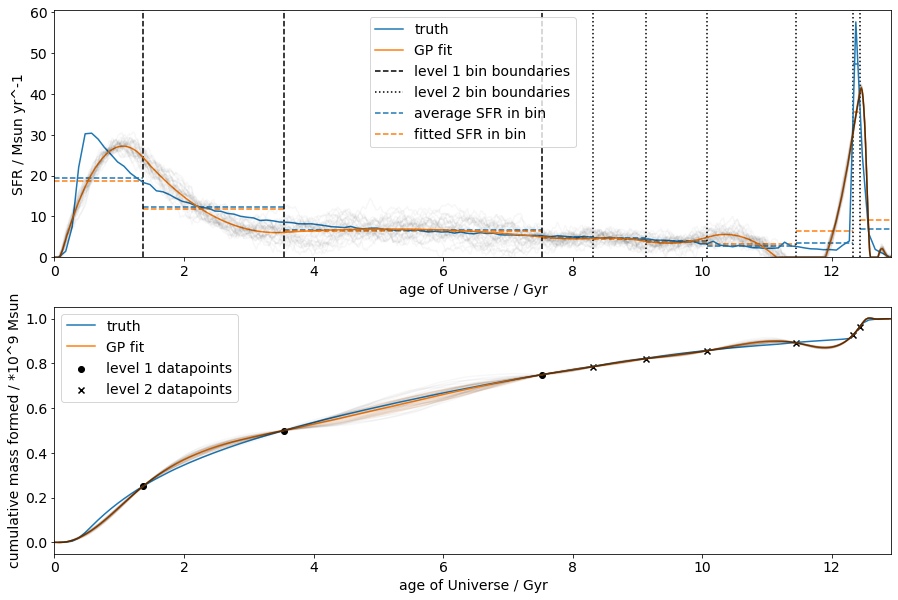

Iyer-then-log-time binning and fitting for 5 and then 6 bins.
[0.08499271 0.19045612 0.38006954 0.66455328] [0.73201772 0.80760375 0.91492052 0.95577609 0.96269725]
(binning) summed squared arror between averaged sfr and actual sfh = 182.70302169167928
(fitted) summed squared arror between averaged sfr and actual sfh = 222.56258539129476


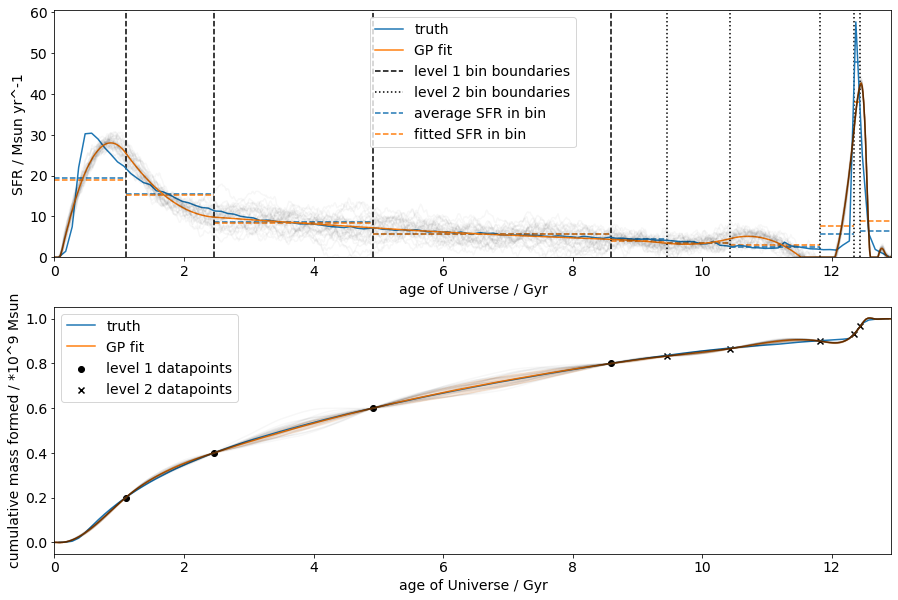

Iyer-then-log-time binning and fitting for 6 and then 5 bins.
[0.07302856 0.14754982 0.27385026 0.46263317 0.72568312] [0.80888645 0.91625542 0.95583219 0.96271816]
(binning) summed squared arror between averaged sfr and actual sfh = 181.06671531479077
(fitted) summed squared arror between averaged sfr and actual sfh = 219.64125378849846


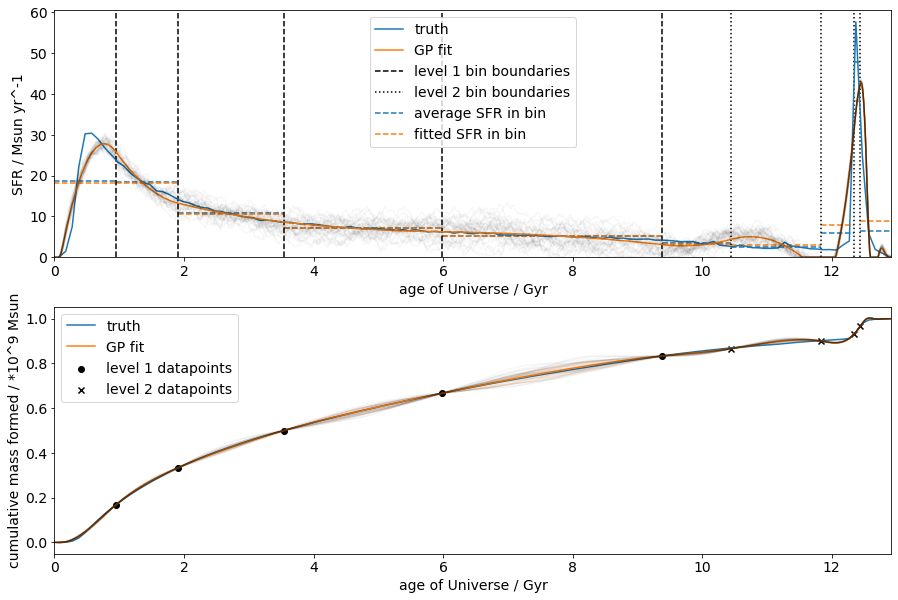

Iyer-then-log-time binning and fitting for 7 and then 4 bins.
[0.06514575 0.12220359 0.21167938 0.34745289 0.52820364 0.77668552] [0.88480889 0.95431398 0.9621523 ]
(binning) summed squared arror between averaged sfr and actual sfh = 172.44079456987194
(fitted) summed squared arror between averaged sfr and actual sfh = 228.44174408390836


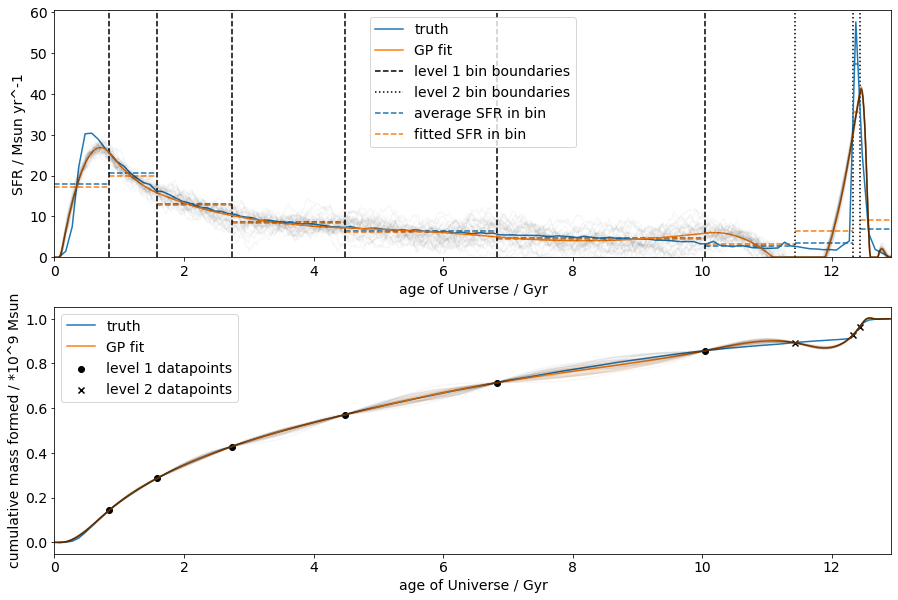

Iyer-then-log-time binning and fitting for 8 and then 3 bins.
[0.05953122 0.10551834 0.17334383 0.27385026 0.40993927 0.58230328
 0.82472641] [0.95106255 0.96094044]
(binning) summed squared arror between averaged sfr and actual sfh = 181.47254775163856
(fitted) summed squared arror between averaged sfr and actual sfh = 243.01971162541312


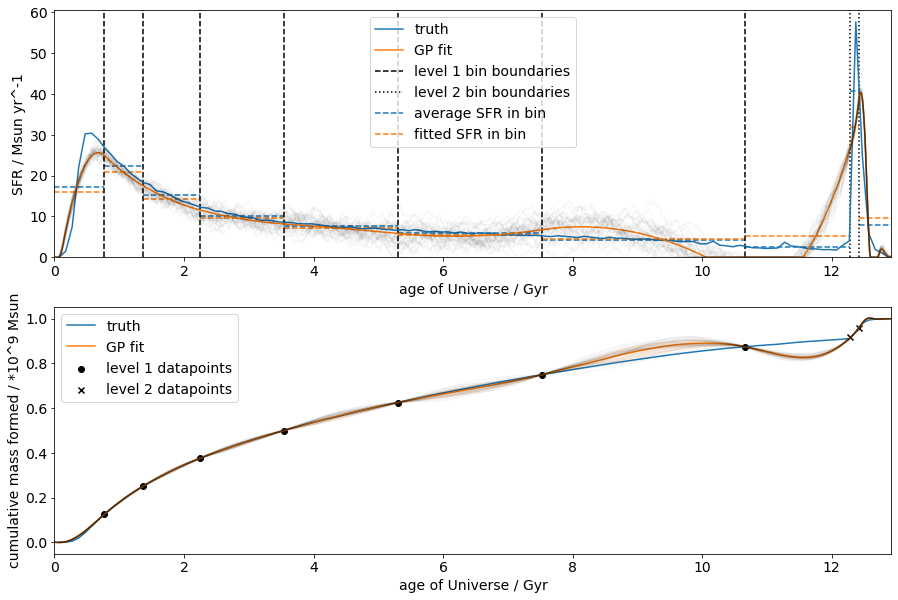

Iyer-then-log-time binning and fitting for 9 and then 2 bins.
[0.05544107 0.09370385 0.14754982 0.22430927 0.32985395 0.46263317
 0.62699864 0.87173639] [0.95817511]
(binning) summed squared arror between averaged sfr and actual sfh = 438.4810074049394
(fitted) summed squared arror between averaged sfr and actual sfh = 449.80154851659563


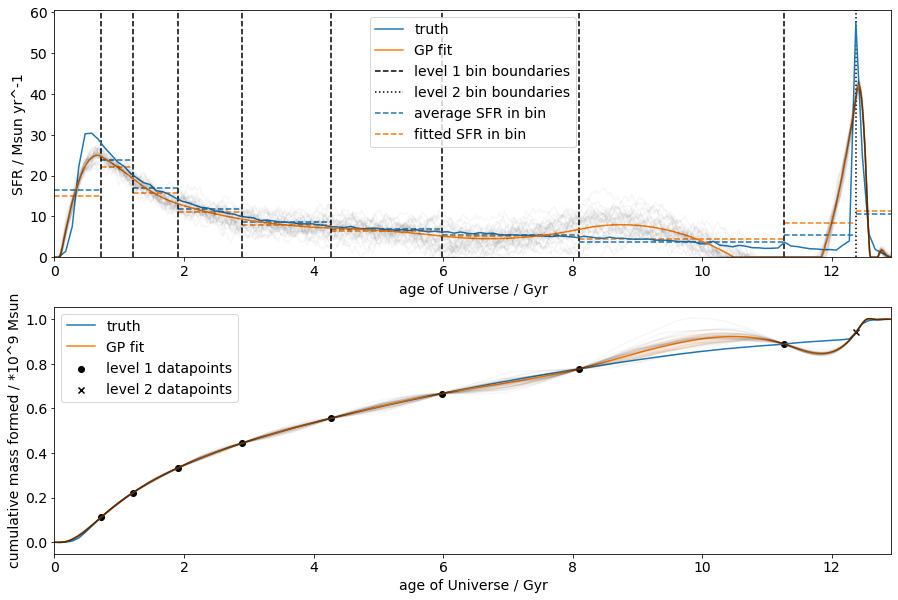

In [162]:
for i in np.arange(2,10):
    a = do_iyer_iyer_fitting([i,11-i])

# Section 3: "area-error" comparison
Cross compare the error statistic of various binning methods with varying number of bins

### First, plotting total number of bins vs the error statistic for the 4 methods above
Note: For the two combined schemes, I am sticking to the above distribution of bins, meaning keeping the number of bins in each level roughly equal (when odd number, I give the first level one more bin)

Text(0, 0.5, '(fitting) "area error" statistic')

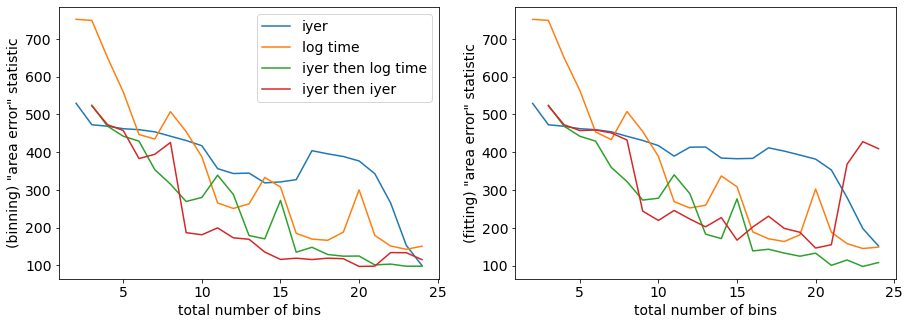

In [171]:
fig, ax = plt.subplots(1,2,figsize=[15,5])
ax[0].plot(np.arange(2,25), iyer_errs[0], label='iyer')
ax[0].plot(np.arange(2,25), lt_errs[0], label='log time')
ax[0].plot(np.arange(3,25), iyer_lt_errs[0], label='iyer then log time')
ax[0].plot(np.arange(3,25), iyer_iyer_errs[0], label='iyer then iyer')
ax[0].legend()
ax[0].set_xlabel('total number of bins')
ax[0].set_ylabel('(binning) "area error" statistic')

ax[1].plot(np.arange(2,25), iyer_errs[1], label='iyer')
ax[1].plot(np.arange(2,25), lt_errs[1], label='log time')
ax[1].plot(np.arange(3,25), iyer_lt_errs[1], label='iyer then log time')
ax[1].plot(np.arange(3,25), iyer_iyer_errs[1], label='iyer then iyer')
ax[1].set_xlabel('total number of bins')
ax[1].set_ylabel('(fitting) "area error" statistic')

### Next, how does the errors look like with different combinations of bins assigned to the two levels of binning?
Here, for the iyer then log time method, I am first plotting the same plot as above, but with dots for all possible combinations of number of bins in each total bin number from 3 to 24. The fraction of Iyer bins for each dot is shown via colour. The error trends from the two "single-level" binnings are overlaid for reference.<br>
The second plots shows the same thing but on a different arrangment of axis: x axis is the number of Iyer bins while y axis is that of log time, and the error value is shown with colour instead. I hope these two representation can help inference.

In [182]:
iyer_lt_errs2 = []
iyer_lt_bins2 = [[],[],[]]
for Ntotal in np.arange(3,25):
    for Niyer in np.arange(2,Ntotal):
        Nlt = Ntotal-Niyer+1
        iyer_lt_errs2.append(do_iyer_lt_fitting([Niyer,Nlt], vb=False))
        iyer_lt_bins2[0].append(Ntotal)
        iyer_lt_bins2[1].append(Niyer)
        iyer_lt_bins2[2].append(Nlt)
iyer_lt_errs2 = np.array(iyer_lt_errs2).T

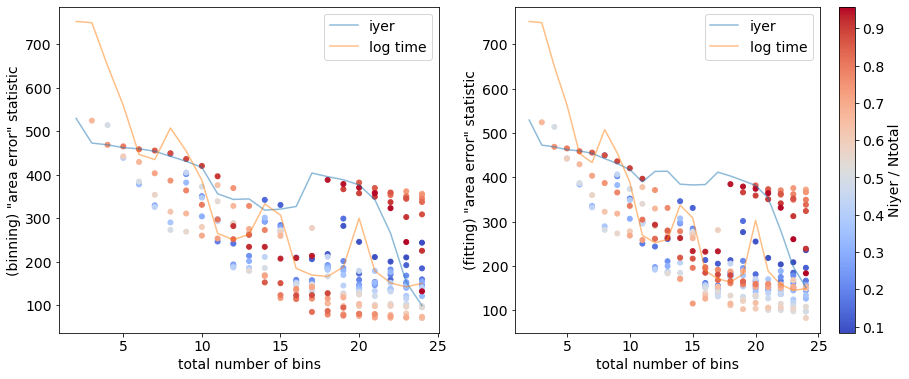

In [194]:
fig, ax = plt.subplots(1,2, figsize=[15,6])
ax[0].plot(np.arange(2,25), iyer_errs[0], label='iyer', alpha=0.5)
ax[0].plot(np.arange(2,25), lt_errs[0], label='log time', alpha=0.5)
s1 = ax[0].scatter(iyer_lt_bins2[0],iyer_lt_errs2[0],c=(np.array(iyer_lt_bins2[1])/np.array(iyer_lt_bins2[0])),
                s=25,cmap='coolwarm')
cbar = fig.colorbar(s1)
cbar.set_label('Niyer / Ntotal')
ax[0].set_xlabel('total number of bins')
ax[0].set_ylabel('(binning) "area error" statistic')
ax[0].legend()

ax[1].plot(np.arange(2,25), iyer_errs[1], label='iyer', alpha=0.5)
ax[1].plot(np.arange(2,25), lt_errs[1], label='log time', alpha=0.5)
s1 = ax[1].scatter(iyer_lt_bins2[0],iyer_lt_errs2[1],c=(np.array(iyer_lt_bins2[1])/np.array(iyer_lt_bins2[0])),
                s=25,cmap='coolwarm')
ax[1].set_xlabel('total number of bins')
ax[1].set_ylabel('(fitting) "area error" statistic')
ax[1].legend()
plt.show()

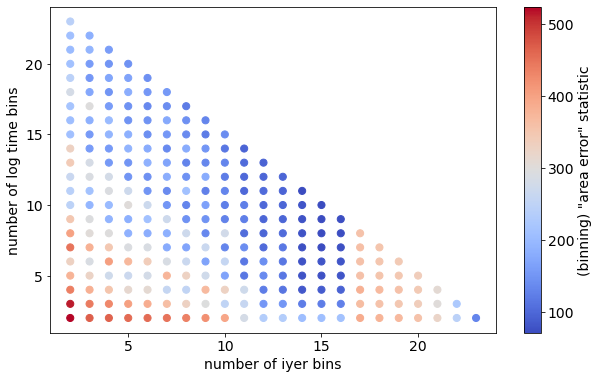

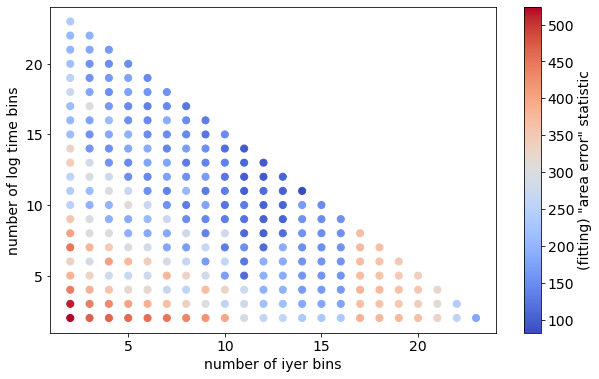

In [189]:
fig, ax = plt.subplots(1,1, figsize=[10,6])
s2 = ax.scatter(iyer_lt_bins2[1],iyer_lt_bins2[2],c=iyer_lt_errs2[0],s=50,cmap='coolwarm')
cbar = fig.colorbar(s2)
cbar.set_label('(binning) "area error" statistic')
ax.set_xlabel('number of iyer bins')
ax.set_ylabel('number of log time bins')
plt.show()

fig, ax = plt.subplots(1,1, figsize=[10,6])
s2 = ax.scatter(iyer_lt_bins2[1],iyer_lt_bins2[2],c=iyer_lt_errs2[1],s=50,cmap='coolwarm')
cbar = fig.colorbar(s2)
cbar.set_label('(fitting) "area error" statistic')
ax.set_xlabel('number of iyer bins')
ax.set_ylabel('number of log time bins')
plt.show()

Then, for the iyer then iyer method, with the same plots.

In [191]:
iyer_iyer_errs2 = []
iyer_iyer_bins2 = [[],[],[]]
for Ntotal in np.arange(3,25):
    for N1 in np.arange(2,Ntotal):
        N2 = Ntotal-N1+1
        iyer_iyer_errs2.append(do_iyer_iyer_fitting([N1,N2], vb=False))
        iyer_iyer_bins2[0].append(Ntotal)
        iyer_iyer_bins2[1].append(N1)
        iyer_iyer_bins2[2].append(N2)
iyer_iyer_errs2 = np.array(iyer_iyer_errs2).T

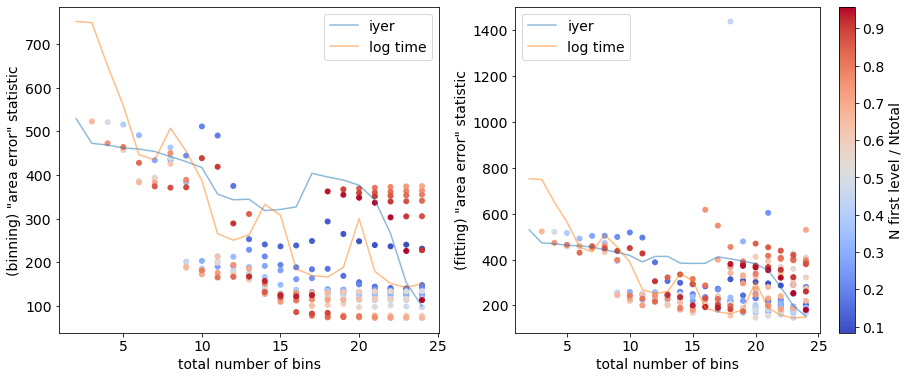

In [195]:
fig, ax = plt.subplots(1,2, figsize=[15,6])
ax[0].plot(np.arange(2,25), iyer_errs[0], label='iyer', alpha=0.5)
ax[0].plot(np.arange(2,25), lt_errs[0], label='log time', alpha=0.5)
s1 = ax[0].scatter(iyer_iyer_bins2[0],iyer_iyer_errs2[0],c=(np.array(iyer_iyer_bins2[1])/np.array(iyer_iyer_bins2[0])),
                s=25,cmap='coolwarm')
cbar = fig.colorbar(s1)
cbar.set_label('N first level / Ntotal')
ax[0].set_xlabel('total number of bins')
ax[0].set_ylabel('(binning) "area error" statistic')
ax[0].legend()

ax[1].plot(np.arange(2,25), iyer_errs[1], label='iyer', alpha=0.5)
ax[1].plot(np.arange(2,25), lt_errs[1], label='log time', alpha=0.5)
s1 = ax[1].scatter(iyer_iyer_bins2[0],iyer_iyer_errs2[1],c=(np.array(iyer_iyer_bins2[1])/np.array(iyer_iyer_bins2[0])),
                s=25,cmap='coolwarm')
ax[1].set_xlabel('total number of bins')
ax[1].set_ylabel('(fitting) "area error" statistic')
ax[1].legend()
plt.show()

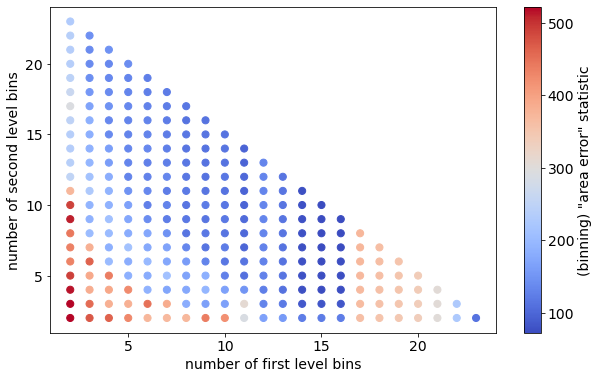

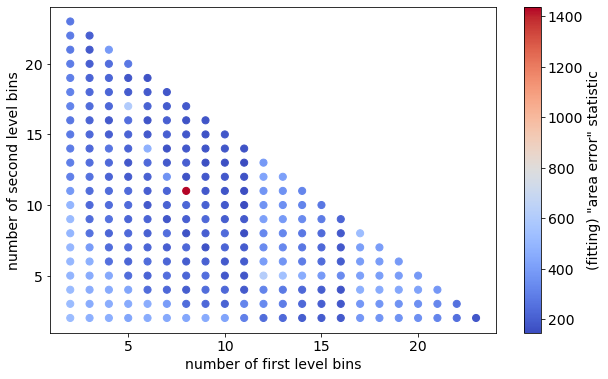

In [193]:
fig, ax = plt.subplots(1,1, figsize=[10,6])
s2 = ax.scatter(iyer_iyer_bins2[1],iyer_iyer_bins2[2],c=iyer_iyer_errs2[0],s=50,cmap='coolwarm')
cbar = fig.colorbar(s2)
cbar.set_label('(binning) "area error" statistic')
ax.set_xlabel('number of first level bins')
ax.set_ylabel('number of second level bins')
plt.show()

fig, ax = plt.subplots(1,1, figsize=[10,6])
s2 = ax.scatter(iyer_iyer_bins2[1],iyer_iyer_bins2[2],c=iyer_iyer_errs2[1],s=50,cmap='coolwarm')
cbar = fig.colorbar(s2)
cbar.set_label('(fitting) "area error" statistic')
ax.set_xlabel('number of first level bins')
ax.set_ylabel('number of second level bins')
plt.show()